# Comprehensive Evaluation Metrics for Fine-tuned NeuTTS Model

In [ ]:
%pip install librosa jiwer openai-whisper fastdtw phonemizer neucodec tqdm matplotlib speechbrain pystoi scipy pesq mel-cepstral-distance

In [ ]:
import os
import torch
import torchaudio
import numpy as np
import librosa
import matplotlib.pyplot as plt
import phonemizer
from datasets import load_dataset
from jiwer import wer
from tqdm import tqdm
import json
import whisper
from pystoi import stoi
from pesq import pesq
from speechbrain.inference.speaker import SpeakerRecognition
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw
from neutts import NeuTTS
from mel_cepstral_distance import compare_audio_files
import soundfile as sf
import tempfile
import csv
import glob

# Set device
device = "cuda:0" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Load SpeechBrain speaker-verification model for similarity scoring
verification = SpeakerRecognition.from_hparams(
    source="speechbrain/spkrec-ecapa-voxceleb",
    savedir="pretrained_models/spkrec-ecapa-voxceleb",
    run_opts={"device": device},
)


## 1. Load Model and Configuration

In [ ]:
model_path = "./data/neutts-romanian-finetune/checkpoint-370000"  # Path to the finetuned checkpoint

# Initialize NeuTTS for inference
tts = NeuTTS(
    backbone_repo=model_path,
    backbone_device="cuda",
    codec_repo="neuphonic/neucodec",
    codec_device="cuda",
    language="ro"
)

# Cache for pre-encoded reference audio
ref_codes_cache = {}

g2p = phonemizer.backend.EspeakBackend(
    language="ro",
    preserve_punctuation=True,
    with_stress=True,
    words_mismatch="ignore",
    language_switch="remove-flags",
)

## 2. Evaluation Metric Functions

In [ ]:
def normalize_audio(wav):
    wav = np.asarray(wav, dtype=np.float32)
    peak = np.max(np.abs(wav))
    if peak < 1e-8:
        return wav
    # Only scale down if clipping is present; otherwise leave loudness alone.
    return wav / peak if peak > 1.0 else wav


def trim_silence(wav, top_db=30):
    wav = np.asarray(wav, dtype=np.float32)
    trimmed, _ = librosa.effects.trim(wav, top_db=top_db)
    # Avoid returning an empty or nearly empty clip.
    if len(trimmed) < 1600:
        return wav
    return trimmed

def calculate_mcd(ref_wav, syn_wav, sr=16000):
    ref_audio = np.asarray(ref_wav, dtype=np.float32)
    syn_audio = np.asarray(syn_wav, dtype=np.float32)
    with tempfile.NamedTemporaryFile(suffix='.wav', delete=True) as ref_tmp, tempfile.NamedTemporaryFile(suffix='.wav', delete=True) as syn_tmp:
        sf.write(ref_tmp.name, ref_audio, sr)
        sf.write(syn_tmp.name, syn_audio, sr)
        mcd, penalty = compare_audio_files(ref_tmp.name, syn_tmp.name)
    return float(mcd)

def calculate_speaker_similarity(ref_wav, syn_wav, sr=16000):
    # SpeechBrain SpeakerRecognition expects file paths for verify_files().
    ref_audio = np.asarray(ref_wav, dtype=np.float32)
    syn_audio = np.asarray(syn_wav, dtype=np.float32)
    with tempfile.NamedTemporaryFile(suffix='.wav', delete=True) as ref_tmp, tempfile.NamedTemporaryFile(suffix='.wav', delete=True) as syn_tmp:
        sf.write(ref_tmp.name, ref_audio, sr)
        sf.write(syn_tmp.name, syn_audio, sr)
        score, prediction = verification.verify_files(ref_tmp.name, syn_tmp.name)
    
    if hasattr(score, 'item'):
        score = score.item()
    return float(score)


def calculate_f0_rmse(ref_wav, syn_wav, sr=16000):
    from discrete_speech_metrics import LogF0RMSE

    metrics = LogF0RMSE(sr)
    logf0rmse = metrics.score(ref_wav, syn_wav)
    return logf0rmse

def calculate_stoi_score(ref_wav, syn_wav, sr=16000):
    min_len = min(len(ref_wav), len(syn_wav))
    return stoi(ref_wav[:min_len], syn_wav[:min_len], sr, extended=False)

def calculate_pesq_score(ref_wav, syn_wav, sr=16000):
    min_len = min(len(ref_wav), len(syn_wav))
    ref_wav_aligned = ref_wav[:min_len]
    syn_wav_aligned = syn_wav[:min_len]
    from discrete_speech_metrics import PESQ

    metrics = PESQ(sr)
    return metrics.score(ref_wav_aligned, syn_wav_aligned)

def calculate_lsd(ref_wav, syn_wav, sr=16000):
    ref_stft = np.abs(librosa.stft(ref_wav))
    syn_stft = np.abs(librosa.stft(syn_wav))
    min_time = min(ref_stft.shape[1], syn_stft.shape[1])
    ref_stft, syn_stft = ref_stft[:, :min_time], syn_stft[:, :min_time]
    log_ref = np.log10(ref_stft**2 + 1e-8)
    log_syn = np.log10(syn_stft**2 + 1e-8)
    return np.mean(np.sqrt(np.mean((log_ref - log_syn)**2, axis=0)))


## 3. Inference Helper

In [29]:
def encode_reference_audio(ref_wav_path, sr=16000):
    """Pre-encode reference audio to NeuCodec tokens via NeuTTS"""
    if ref_wav_path in ref_codes_cache:
        return ref_codes_cache[ref_wav_path]
    ref_codes = tts.encode_reference(ref_wav_path)
    ref_codes_cache[ref_wav_path] = ref_codes
    return ref_codes

def generate_audio_with_codes(text, ref_wav=None, ref_text=None, return_diagnostics=False):
    """
    Generate audio using NeuTTS.infer() with optional reference voice cloning.
    Args:
        text: Input text to synthesize
        ref_wav: Reference waveform (numpy array or path) for voice cloning, or None
        ref_text: Reference text for context (optional)
        return_diagnostics: Return additional metadata
    Returns:
        wav: Synthesized audio (numpy array, 16kHz)
        codes: NeuCodec tokens (list)
        diagnostics: Metadata dict (if diagnostics)
    """
    ref_codes = None
    diagnostics = {
        'voice_cloning': ref_wav is not None,
        'ref_text_provided': ref_text is not None,
    }
    
    try:
        if ref_wav is not None:
            # ref_wav can be numpy array or path
            if isinstance(ref_wav, str):
                ref_codes = encode_reference_audio(ref_wav)
            else:
                # Numpy array: save to temp file and encode
                with tempfile.NamedTemporaryFile(suffix='.wav', delete=False) as tmp:
                    sf.write(tmp.name, ref_wav, 16000)
                    ref_codes = tts.encode_reference(tmp.name)
                    os.remove(tmp.name)
        
        # Generate using NeuTTS.infer()
        wav = tts.infer(text, ref_codes=ref_codes, ref_text=ref_text)
        
        # wav is already numpy array at 16kHz
        if isinstance(wav, torch.Tensor):
            wav = wav.cpu().numpy()
        
        if return_diagnostics:
            diagnostics['success'] = True
            diagnostics['output_samples'] = len(wav)
            diagnostics['duration_sec'] = len(wav) / 24000
            return wav, [], diagnostics
        return wav, []
    
    except Exception as e:
        print(f'Error in generate_audio_with_codes: {e}')
        if return_diagnostics:
            diagnostics['success'] = False
            diagnostics['error'] = str(e)
            return None, [], diagnostics
        return None, []

def generate_audio(text, ref_wav=None, ref_text=None):
    """Standard wrapper returning ONLY the waveform for voice cloning evaluation"""
    wav, _ = generate_audio_with_codes(text, ref_wav=ref_wav, ref_text=ref_text)
    return wav

## 4. Running Full Evaluation

In [30]:
import warnings
warnings.filterwarnings('ignore', message='Performing inference on CPU when CUDA is available')


In [ ]:
import os
import gc
from datasets import load_dataset, load_from_disk, concatenate_datasets
import time
import threading
from collections import Counter

import psutil
import torch
import numpy as np
import pandas as pd

# Fixed evaluation setup
fixed_eval_seed = 42
np.random.seed(fixed_eval_seed)

process = psutil.Process(os.getpid())

def cpu_mem_mb():
    return process.memory_info().rss / (1024 ** 2)

def gpu_mem_mb():
    if not torch.cuda.is_available():
        return None
    return torch.cuda.max_memory_allocated() / (1024 ** 2)

class ResourceMonitor:
    def __init__(self, interval_sec=0.05):
        self.interval_sec = interval_sec
        self.running = False
        self.thread = None
        self.peak_cpu_mb = 0.0
        self.peak_gpu_mb = 0.0

    def _poll(self):
        while self.running:
            try:
                self.peak_cpu_mb = max(self.peak_cpu_mb, cpu_mem_mb())
                if torch.cuda.is_available():
                    self.peak_gpu_mb = max(self.peak_gpu_mb, gpu_mem_mb() or 0.0)
            except Exception:
                pass
            time.sleep(self.interval_sec)

    def start(self):
        self.running = True
        self.peak_cpu_mb = cpu_mem_mb()
        self.peak_gpu_mb = 0.0
        if torch.cuda.is_available():
            torch.cuda.reset_peak_memory_stats()
            torch.cuda.synchronize()
        self.thread = threading.Thread(target=self._poll, daemon=True)
        self.thread.start()

    def stop(self):
        self.running = False
        if self.thread is not None:
            self.thread.join(timeout=1.0)

def classify_failure(error_text, gen_wav=None, clipped=False):
    text = (error_text or "").lower()

    if gen_wav is None:
        if "out of memory" in text or "oom" in text:
            return "oom"
        if "timeout" in text:
            return "timeout"
        if "align" in text:
            return "alignment_error"
        if "whisper" in text or "asr" in text:
            return "asr_mismatch"
        if text:
            return "backend_error"
        return "generation_none"

    if len(gen_wav) == 0:
        return "empty_output"

    if clipped:
        return "clipping"

    if "out of memory" in text or "oom" in text:
        return "oom"
    if "timeout" in text:
        return "timeout"
    if "align" in text:
        return "alignment_error"
    if "whisper" in text or "asr" in text:
        return "asr_mismatch"
    if text:
        return "backend_error"
    return None

# Optional timed model setup if the models are not already loaded
backend_setup_start = time.perf_counter()

if "asr_model" not in globals():
    asr_model_name = "large-v3" 
    asr_model = whisper.load_model(asr_model_name, device="cpu")

if "tts" not in globals() or tts is None:
    model_path = "./data/neutts-romanian-finetune/checkpoint-370000"
    tts = NeuTTS(
        backbone_repo=model_path,
        backbone_device="cuda",
        codec_repo="neuphonic/neucodec",
        codec_device="cuda",
        language="ro"
    )

backend_setup_end = time.perf_counter()
backend_load_sec = backend_setup_end - backend_setup_start

# Fixed split and fixed selection
processed_path = "./data/processed_romanian_dataset"
sample_size = 48
use_processed = False
out_dir = "./diagnostics_outliers"
os.makedirs(out_dir, exist_ok=True)

duration_threshold_sec = 5
speakers = ["Simona", "Stefan", "Vasile"]

for duration_threshold_sec in range(5, 11):
    out_dir = f"./diagnostics_outliers_{duration_threshold_sec}"
    os.makedirs(out_dir, exist_ok=True)
    final_samples = []

    diag_samples = None

    if os.path.exists(processed_path) and use_processed:
        try:
            diag_dataset = load_from_disk(processed_path)
            diag_samples = diag_dataset.select(
                np.random.choice(range(0, len(diag_dataset)), size=sample_size, replace=False)
            )
            print(f"Loaded {len(diag_samples)} samples from processed dataset")
        except Exception as exc:
            print(f"Failed to load processed dataset: {exc}. Falling back to raw dataset.")

    if diag_samples is None:
        print("Loading from Hugging Face raw dataset...")
        raw_dataset = load_dataset("eduardem/romanian-speech-v2", split="train[-32966:]")
        diag_samples = raw_dataset.select(
            np.random.choice(range(0, len(raw_dataset)), size=3 * sample_size, replace=False)
        )

    metrics_results = []
    batch_records = []
    failure_records = []

    print("\nDataset structure check:")
    if len(diag_samples) > 0:
        sample0 = diag_samples[0]
        print(f"  Sample keys: {list(sample0.keys())}")
        for key in sample0.keys():
            val = sample0[key]
            if isinstance(val, dict):
                print(f"    {key}: dict with keys {list(val.keys())}")
            else:
                print(f"    {key}: {type(val).__name__}")
    for i, speaker_filter in enumerate(speakers):
        if duration_threshold_sec == 10:
            print(f"\nFiltering samples for speaker: {speaker_filter} with duration >= {duration_threshold_sec}s")
            diag_samples = diag_samples.filter(
                lambda x: duration_threshold_sec <= x["duration"] and x["speaker"] == speaker_filter
            )
        else:
            print(f"\nFiltering samples for speaker: {speaker_filter} with duration in [{duration_threshold_sec}s, {duration_threshold_sec + 1}s)")
            diag_samples = diag_samples.filter(
                lambda x: duration_threshold_sec <= x["duration"] and x["duration"] < (duration_threshold_sec + 1) and x["speaker"] == speaker_filter
            )

        # Remove duplicates by text
        if len(diag_samples) > 0:
            for i in range(len(diag_samples) - 1, -1, -1):
                if diag_samples[i]["text"] in diag_samples[:i]["text"]:
                    diag_samples = diag_samples.select([j for j in range(len(diag_samples)) if j != i])

        while len(diag_samples) < sample_size // len(speakers):
            if duration_threshold_sec == 10:
                print(
                    f"Filtered dataset has only {len(diag_samples)} samples with duration >= {duration_threshold_sec}s. Resampling..."
                )
            else:
                print(
                    f"Filtered dataset has only {len(diag_samples)} samples with duration in [{duration_threshold_sec}s, {duration_threshold_sec + 1}s). Resampling..."
                )
            resample_count = 3 * sample_size - len(diag_samples)
            diag_samples_resample = raw_dataset.select(
                np.random.choice(range(0, len(raw_dataset)), size=resample_count, replace=False)
            )
            diag_samples = concatenate_datasets([diag_samples, diag_samples_resample])
            if duration_threshold_sec == 10:
                diag_samples = diag_samples.filter(
                    lambda x: duration_threshold_sec <= x["duration"] and x["speaker"] == speaker_filter
                )
            else:
                diag_samples = diag_samples.filter(
                    lambda x: duration_threshold_sec <= x["duration"] and x["duration"] < (duration_threshold_sec + 1) and x["speaker"] == speaker_filter
                )

            if len(diag_samples) > 0:
                for i in range(len(diag_samples) - 1, -1, -1):
                    if diag_samples[i]["text"] in diag_samples[:i]["text"]:
                        diag_samples = diag_samples.select([j for j in range(len(diag_samples)) if j != i])

        if len(diag_samples) > sample_size // len(speakers):
            diag_samples = diag_samples.select(
                np.random.choice(range(0, len(diag_samples)), size=sample_size // len(speakers), replace=False)
            )
        final_samples = concatenate_datasets([final_samples, diag_samples]) if final_samples else diag_samples

    diag_samples = final_samples
    print(f"Simona: {len(final_samples.filter(lambda x: x['speaker'] == 'Simona'))}")
    print(f"Stefan: {len(final_samples.filter(lambda x: x['speaker'] == 'Stefan'))}")
    print(f"Vasile: {len(final_samples.filter(lambda x: x['speaker'] == 'Vasile'))}")

    print(f"\nFinal evaluation samples: {len(diag_samples)}")

    for i in tqdm(range(len(diag_samples))):
        sample = diag_samples[i]
        text = None
        ref_wav = None
        ref_sr = 16000

        sample_start_time = time.perf_counter()
        preprocessing_start = time.perf_counter()

        # Resolve text field
        for text_key in ["text", "sentence", "transcript"]:
            if text_key in sample:
                text = sample[text_key]
                break

        if text is None:
            failure_records.append({
                "sample_index": i,
                "failure_case": "missing_text",
                "status": "failed",
                "error": "No text field found",
            })
            continue

        # Resolve reference audio
        try:
            if "audio" in sample:
                if type(sample["audio"]).__name__ == "AudioDecoder":
                    audio_data = sample["audio"]
                    waveform = torch.tensor(audio_data["array"], dtype=torch.float32)
                    sample_rate = audio_data["sampling_rate"]

                    if sample_rate != 16000:
                        resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
                        waveform = resampler(waveform)

                    if waveform.dim() == 1:
                        waveform = waveform.unsqueeze(0).unsqueeze(0)
                    elif waveform.dim() == 2:
                        waveform = waveform.unsqueeze(0)

                    sample["waveform"] = waveform.squeeze().cpu().numpy()
                    ref_wav = np.array(sample["waveform"], dtype=np.float32)
                    ref_sr = 16000

                elif isinstance(sample["audio"], dict) and "array" in sample["audio"]:
                    ref_wav = np.array(sample["audio"]["array"], dtype=np.float32)
                    ref_sr = sample["audio"].get("sampling_rate", 16000)
                else:
                    failure_records.append({
                        "sample_index": i,
                        "failure_case": "bad_audio_structure",
                        "status": "failed",
                        "error": f"Unexpected audio structure: {type(sample['audio'])}",
                    })
                    continue

            elif "waveform" in sample:
                ref_wav = np.array(sample["waveform"], dtype=np.float32)
                ref_sr = 16000
            else:
                failure_records.append({
                    "sample_index": i,
                    "failure_case": "missing_audio",
                    "status": "failed",
                    "error": "No audio field found",
                })
                continue

        except (KeyError, TypeError) as exc:
            failure_records.append({
                "sample_index": i,
                "failure_case": "audio_extract_error",
                "status": "failed",
                "error": str(exc),
            })
            continue

        if ref_wav is None:
            failure_records.append({
                "sample_index": i,
                "failure_case": "missing_reference_audio",
                "status": "failed",
                "error": "Reference waveform is None",
            })
            continue

        if ref_sr != 16000:
            ref_wav = librosa.resample(ref_wav, orig_sr=ref_sr, target_sr=16000)

        preprocessing_end = time.perf_counter()

        # Synthesis latency
        monitor = ResourceMonitor(interval_sec=0.05)
        monitor.start()

        synthesis_start = time.perf_counter()
        gen_wav = None
        synthesis_error = None

        try:
            gen_wav = generate_audio(text, ref_wav=ref_wav, ref_text=text)
        except Exception as exc:
            synthesis_error = str(exc)

        synthesis_end = time.perf_counter()

        monitor.stop()

        if gen_wav is not None:
            try:
                gen_wav = librosa.resample(gen_wav, orig_sr=24000, target_sr=16000)
            except Exception:
                pass

        if gen_wav is None:
            failure_case = classify_failure(synthesis_error, gen_wav=None)
            failure_records.append({
                "sample_index": i,
                "text": text,
                "failure_case": failure_case,
                "status": "failed",
                "error": synthesis_error,
                "latency_sec": synthesis_end - sample_start_time,
                "backend_runtime_sec": synthesis_end - preprocessing_start,
                "preprocessing_sec": preprocessing_end - preprocessing_start,
                "synthesis_sec": synthesis_end - synthesis_start,
                "asr_sec": None,
                "metric_sec": None,
                "peak_cpu_mem_mb": monitor.peak_cpu_mb,
                "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
                "output_samples": 0,
                "backend_load_sec": backend_load_sec,
            })
            continue

        if len(gen_wav) == 0:
            failure_records.append({
                "sample_index": i,
                "text": text,
                "failure_case": "empty_output",
                "status": "failed",
                "error": None,
                "latency_sec": synthesis_end - sample_start_time,
                "backend_runtime_sec": synthesis_end - preprocessing_start,
                "preprocessing_sec": preprocessing_end - preprocessing_start,
                "synthesis_sec": synthesis_end - synthesis_start,
                "asr_sec": None,
                "metric_sec": None,
                "peak_cpu_mem_mb": monitor.peak_cpu_mb,
                "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
                "output_samples": 0,
                "backend_load_sec": backend_load_sec,
            })
            continue

        # Post-process and compute metrics
        metric_start = time.perf_counter()

        ref_wav_normalized = normalize_audio(trim_silence(ref_wav))
        gen_wav_trimmed = trim_silence(gen_wav)
        clipped = float(np.max(np.abs(gen_wav_trimmed))) >= 0.999
        gen_wav_normalized = normalize_audio(gen_wav_trimmed)

        try:
            mcd = calculate_mcd(ref_wav_normalized, gen_wav_normalized)
            sim = calculate_speaker_similarity(ref_wav_normalized, gen_wav_normalized)
            stoi_val = calculate_stoi_score(ref_wav_normalized, gen_wav_normalized)
            f0_rmse = calculate_f0_rmse(ref_wav_normalized, gen_wav_normalized)
            pesq_val = calculate_pesq_score(ref_wav_normalized, gen_wav_normalized)
            lsd_val = calculate_lsd(ref_wav_normalized, gen_wav_normalized)
        except Exception as exc:
            failure_records.append({
                "sample_index": i,
                "text": text,
                "failure_case": "metric_error",
                "status": "failed",
                "error": str(exc),
                "latency_sec": synthesis_end - sample_start_time,
                "backend_runtime_sec": time.perf_counter() - preprocessing_start,
                "preprocessing_sec": preprocessing_end - preprocessing_start,
                "synthesis_sec": synthesis_end - synthesis_start,
                "asr_sec": None,
                "metric_sec": time.perf_counter() - metric_start,
                "peak_cpu_mem_mb": monitor.peak_cpu_mb,
                "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
                "output_samples": len(gen_wav),
                "backend_load_sec": backend_load_sec,
            })
            continue

        # ASR / WER
        asr_start = time.perf_counter()
        asr_error = None
        try:
            asr_result = asr_model.transcribe(
                gen_wav_normalized,
                language="ro",
                task="transcribe",
                fp16=False
            )
            error_rate = wer(text.lower(), asr_result["text"].lower())
        except Exception as exc:
            asr_error = str(exc)
            asr_result = {"text": ""}
            error_rate = None
        asr_end = time.perf_counter()

        metric_end = time.perf_counter()
        backend_end = metric_end
        total_wall_sec = metric_end - sample_start_time

        row = {
            "sample_index": i,
            "text": text,
            "status": "ok" if error_rate is not None else "failed",
            "failure_case": None if error_rate is not None else classify_failure(asr_error, gen_wav=gen_wav_normalized, clipped=clipped),
            "error": asr_error,
            "speaker_similarity": sim,
            "mcd": mcd,
            "stoi": stoi_val,
            "log_f0_rmse": f0_rmse,
            "pesq": pesq_val,
            "lsd": lsd_val,
            "wer": error_rate,
            "ref_dur_sec": len(ref_wav_normalized) / 16000,
            "gen_dur_sec": len(gen_wav_normalized) / 16000,
            "dur_ratio": ((len(gen_wav_normalized) / 16000) / max(1e-8, len(ref_wav_normalized) / 16000)) if gen_wav_normalized is not None else 0.0,
            "latency_sec": synthesis_end - sample_start_time,
            "preprocessing_sec": preprocessing_end - preprocessing_start,
            "synthesis_sec": synthesis_end - synthesis_start,
            "asr_sec": asr_end - asr_start,
            "metric_sec": metric_end - metric_start,
            "backend_runtime_sec": backend_end - preprocessing_start,
            "total_wall_sec": total_wall_sec,
            "peak_cpu_mem_mb": monitor.peak_cpu_mb,
            "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
            "output_samples": len(gen_wav_normalized),
            "clipped": clipped,
            "backend_load_sec": backend_load_sec,
        }

        if row["status"] == "ok":
            sf.write(os.path.join(out_dir, f"ref_{i}.wav"), ref_wav_normalized, 16000)
            sf.write(os.path.join(out_dir, f"gen_{i}.wav"), gen_wav_normalized, 16000)
            metrics_results.append(row)
        else:
            row["failure_case"] = row["failure_case"] or "asr_mismatch"
            failure_records.append(row)

        batch_records.append(row)

    results_df = pd.DataFrame(batch_records)

    print("\n=== Voice Cloning Evaluation Summary ===")
    if len(metrics_results) > 0:
        for key in ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]:
            values = [r[key] for r in metrics_results if r.get(key) is not None]
            if values:
                print(f"Average {key.upper()}: {np.mean(values):.4f}")
    else:
        print("No successful evaluations.")

    print("\n=== Operational Metrics ===")
    if len(batch_records) > 0:
        for key in ["latency_sec", "preprocessing_sec", "synthesis_sec", "asr_sec", "metric_sec", "backend_runtime_sec", "total_wall_sec", "peak_cpu_mem_mb", "peak_gpu_mem_mb"]:
            values = [r.get(key) for r in batch_records if r.get(key) is not None]
            if values:
                print(f"Average {key}: {np.mean(values):.4f}")

    print(f"\nProcessed {len(batch_records)} samples")
    print(f"Successful runs: {len(metrics_results)}")
    print(f"Failed runs: {len(failure_records)}")

    if failure_records:
        failure_counts = Counter(r["failure_case"] for r in failure_records)
        print("\n=== Failure Cases ===")
        for failure_case, count in failure_counts.most_common():
            print(f"{failure_case}: {count}")

    if batch_records:
        batch_csv = os.path.join(out_dir, "batch_metrics.csv")
        results_df.to_csv(batch_csv, index=False)
        print(f"\nSaved batch metrics to {batch_csv}")

    if failure_records:
        failure_df = pd.DataFrame(failure_records)
        failure_csv = os.path.join(out_dir, "failure_cases.csv")
        failure_df.to_csv(failure_csv, index=False)
        print(f"Saved failure cases to {failure_csv}")

    # --- Bootstrap CI configuration
    n_bootstrap = 5000     
    alpha = 0.05         
    bootstrap_seed = 42

    def bootstrap_ci(data, statfunc=np.mean, n_bootstrap=1000, alpha=0.05, seed=None):
        """
        Compute bootstrap confidence interval for a statistic (statfunc) on `data`.
        Returns: (stat_observed, ci_lower, ci_upper)
        """
        data = np.array(data, dtype=float)
        if data.size == 0:
            return (np.nan, np.nan, np.nan)
        rng = np.random.default_rng(seed)
        n = data.size
        stats = np.empty(n_bootstrap, dtype=float)
        for i in range(n_bootstrap):
            sample = rng.choice(data, size=n, replace=True)
            try:
                stats[i] = float(statfunc(sample))
            except Exception:
                stats[i] = np.nan
        # Remove possible nan entries
        stats = stats[~np.isnan(stats)]
        if stats.size == 0:
            return (float(statfunc(data)), np.nan, np.nan)
        lo = np.percentile(stats, 100 * (alpha / 2.0))
        hi = np.percentile(stats, 100 * (1.0 - alpha / 2.0))
        return float(statfunc(data)), float(lo), float(hi)

    # Replace summary creation with bootstrap CI included
    if metrics_results:
        summary_csv = os.path.join(out_dir, "evaluation_summary.csv")
        summary_rows = []
        metrics_to_report = ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]

        print("\n=== Metric Summary with bootstrap 95% CI ===")
        for key in metrics_to_report:
            values = [r[key] for r in metrics_results if r.get(key) is not None]
            if not values:
                continue
            values_arr = np.array(values, dtype=float)

            mean_val = float(np.mean(values_arr))
            median_val = float(np.median(values_arr))
            std_val = float(np.std(values_arr, ddof=0))

            # Compute bootstrap CI for the mean
            mean_obs, ci_lo, ci_hi = bootstrap_ci(
                values_arr,
                statfunc=np.mean,
                n_bootstrap=n_bootstrap,
                alpha=alpha,
                seed=bootstrap_seed
            )

            summary_rows.append({
                "metric": key,
                "mean": mean_val,
                "median": median_val,
                "std": std_val,
                "ci_lower": ci_lo,
                "ci_upper": ci_hi,
                "n": int(len(values_arr))
            })

            print(f"{key:20s} n={len(values_arr):3d} mean={mean_val:8.4f} "
                f"(95% CI [{ci_lo:.4f}, {ci_hi:.4f}]) median={median_val:8.4f} std={std_val:8.4f}")

        pd.DataFrame(summary_rows).to_csv(summary_csv, index=False)
        print(f"\nSaved summary metrics with bootstrap CI to {summary_csv}")
    else:
        print("No metrics_results to summarize (bootstrap skipped).")

Loading from Hugging Face raw dataset...

Dataset structure check:
  Sample keys: ['audio', 'text', 'speaker', 'gender', 'duration', 'source']
    audio: AudioDecoder
    text: str
    speaker: str
    gender: str
    duration: float
    source: str

Filtering samples with duration in [5s, 6s)


Filter: 100%|██████████| 144/144 [00:01<00:00, 107.30 examples/s]


Filtered dataset has only 20 samples with duration in [5s, 6s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 114.72 examples/s]


Filtered dataset has only 30 samples with duration in [5s, 6s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 114.71 examples/s]


Filtered dataset has only 47 samples with duration in [5s, 6s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 117.68 examples/s]



Final evaluation samples: 48


100%|██████████| 48/48 [23:28<00:00, 29.34s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.4981
Average MCD: 7.0514
Average STOI: 0.1788
Average LOG_F0_RMSE: 0.2588
Average PESQ: 1.1055
Average LSD: 2.1978
Average WER: 0.1221
Average DUR_RATIO: 1.0451

=== Operational Metrics ===
Average latency_sec: 5.1429
Average preprocessing_sec: 0.0158
Average synthesis_sec: 5.1261
Average asr_sec: 18.8685
Average metric_sec: 24.1309
Average backend_runtime_sec: 29.2988
Average total_wall_sec: 29.2988
Average peak_cpu_mem_mb: 12376.2700
Average peak_gpu_mem_mb: 5674.3904

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers_5/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.4981 (95% CI [0.4756, 0.5196]) median=  0.4927 std=  0.0759
mcd                  n= 48 mean=  7.0514 (95% CI [6.8759, 7.2476]) median=  6.9899 std=  0.6634
stoi                 n= 48 mean=  0.1788 (95% CI [0.1598, 0.1972]) median=  0.1713 std=  0.

Filter: 100%|██████████| 144/144 [00:02<00:00, 57.42 examples/s]


Filtered dataset has only 11 samples with duration in [6s, 7s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 68.21 examples/s]


Filtered dataset has only 21 samples with duration in [6s, 7s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 74.89 examples/s]


Filtered dataset has only 34 samples with duration in [6s, 7s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 73.36 examples/s]


Filtered dataset has only 40 samples with duration in [6s, 7s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 82.17 examples/s]



Final evaluation samples: 48


100%|██████████| 48/48 [22:56<00:00, 28.67s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5332
Average MCD: 6.8818
Average STOI: 0.1692
Average LOG_F0_RMSE: 0.2392
Average PESQ: 1.0120
Average LSD: 2.2208
Average WER: 0.1126
Average DUR_RATIO: 1.0614

=== Operational Metrics ===
Average latency_sec: 5.8640
Average preprocessing_sec: 0.0141
Average synthesis_sec: 5.8491
Average asr_sec: 16.9969
Average metric_sec: 22.6979
Average backend_runtime_sec: 28.5907
Average total_wall_sec: 28.5907
Average peak_cpu_mem_mb: 12960.0183
Average peak_gpu_mem_mb: 5700.4308

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers_6/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.5332 (95% CI [0.5097, 0.5572]) median=  0.5402 std=  0.0843
mcd                  n= 48 mean=  6.8818 (95% CI [6.6744, 7.1094]) median=  6.8118 std=  0.7523
stoi                 n= 48 mean=  0.1692 (95% CI [0.1522, 0.1885]) median=  0.1671 std=  0.

Filter: 100%|██████████| 144/144 [00:03<00:00, 38.97 examples/s]


Filtered dataset has only 10 samples with duration in [7s, 8s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 50.45 examples/s]


Filtered dataset has only 16 samples with duration in [7s, 8s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 54.56 examples/s]


Filtered dataset has only 25 samples with duration in [7s, 8s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 64.39 examples/s]


Filtered dataset has only 35 samples with duration in [7s, 8s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 79.09 examples/s]


Filtered dataset has only 42 samples with duration in [7s, 8s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 79.23 examples/s]



Final evaluation samples: 48


100%|██████████| 48/48 [24:05<00:00, 30.11s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5452
Average MCD: 6.9073
Average STOI: 0.1705
Average LOG_F0_RMSE: 0.2454
Average PESQ: 1.0206
Average LSD: 2.3124
Average WER: 0.1189
Average DUR_RATIO: 1.0515

=== Operational Metrics ===
Average latency_sec: 6.8556
Average preprocessing_sec: 0.0106
Average synthesis_sec: 6.8440
Average asr_sec: 16.3790
Average metric_sec: 23.1686
Average backend_runtime_sec: 30.0500
Average total_wall_sec: 30.0500
Average peak_cpu_mem_mb: 13553.2096
Average peak_gpu_mem_mb: 5727.2123

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers_7/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.5452 (95% CI [0.5212, 0.5698]) median=  0.5607 std=  0.0818
mcd                  n= 48 mean=  6.9073 (95% CI [6.7321, 7.1002]) median=  6.9320 std=  0.6349
stoi                 n= 48 mean=  0.1705 (95% CI [0.1515, 0.1894]) median=  0.1716 std=  0.

Filter: 100%|██████████| 144/144 [00:03<00:00, 41.48 examples/s]


Filtered dataset has only 5 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 49.65 examples/s]


Filtered dataset has only 13 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 56.91 examples/s]


Filtered dataset has only 14 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 61.56 examples/s]


Filtered dataset has only 17 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 59.80 examples/s]


Filtered dataset has only 20 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 66.85 examples/s]


Filtered dataset has only 26 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 62.80 examples/s]


Filtered dataset has only 31 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 72.60 examples/s]


Filtered dataset has only 34 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 77.25 examples/s]


Filtered dataset has only 39 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 93.65 examples/s]


Filtered dataset has only 42 samples with duration in [8s, 9s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 95.12 examples/s]



Final evaluation samples: 48


100%|██████████| 48/48 [18:57<00:00, 23.69s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5480
Average MCD: 7.0529
Average STOI: 0.1812
Average LOG_F0_RMSE: 0.2553
Average PESQ: 1.1723
Average LSD: 2.2745
Average WER: 0.1246
Average DUR_RATIO: 1.0148

=== Operational Metrics ===
Average latency_sec: 6.2182
Average preprocessing_sec: 0.0064
Average synthesis_sec: 6.2113
Average asr_sec: 12.4790
Average metric_sec: 17.3984
Average backend_runtime_sec: 23.6460
Average total_wall_sec: 23.6460
Average peak_cpu_mem_mb: 14459.3877
Average peak_gpu_mem_mb: 5756.5951

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers_8/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.5480 (95% CI [0.5239, 0.5699]) median=  0.5661 std=  0.0806
mcd                  n= 48 mean=  7.0529 (95% CI [6.8595, 7.2809]) median=  6.9472 std=  0.7407
stoi                 n= 48 mean=  0.1812 (95% CI [0.1622, 0.2004]) median=  0.1722 std=  0.

Filter: 100%|██████████| 144/144 [00:03<00:00, 45.67 examples/s]


Filtered dataset has only 8 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:03<00:00, 46.33 examples/s]


Filtered dataset has only 10 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 56.43 examples/s]


Filtered dataset has only 16 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 60.02 examples/s]


Filtered dataset has only 22 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 56.99 examples/s]


Filtered dataset has only 27 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 80.72 examples/s]


Filtered dataset has only 30 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 78.93 examples/s]


Filtered dataset has only 34 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 78.09 examples/s]


Filtered dataset has only 41 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 91.01 examples/s]


Filtered dataset has only 45 samples with duration in [9s, 10s). Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 85.77 examples/s]



Final evaluation samples: 48


100%|██████████| 48/48 [41:00<00:00, 51.27s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5512
Average MCD: 6.9314
Average STOI: 0.1872
Average LOG_F0_RMSE: 0.2585
Average PESQ: 1.0782
Average LSD: 2.3240
Average WER: 0.1350
Average DUR_RATIO: 1.0320

=== Operational Metrics ===
Average latency_sec: 11.7583
Average preprocessing_sec: 0.0158
Average synthesis_sec: 11.7421
Average asr_sec: 25.6158
Average metric_sec: 39.4432
Average backend_runtime_sec: 51.2285
Average total_wall_sec: 51.2285
Average peak_cpu_mem_mb: 12915.0623
Average peak_gpu_mem_mb: 5780.3147

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers_9/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.5512 (95% CI [0.5343, 0.5712]) median=  0.5550 std=  0.0666
mcd                  n= 48 mean=  6.9314 (95% CI [6.7795, 7.0959]) median=  7.0005 std=  0.5919
stoi                 n= 48 mean=  0.1872 (95% CI [0.1684, 0.2064]) median=  0.1830 std=  

Filter: 100%|██████████| 144/144 [00:05<00:00, 28.23 examples/s]


Filtered dataset has only 14 samples with duration >= 10s. Resampling...


Filter: 100%|██████████| 144/144 [00:03<00:00, 38.88 examples/s]


Filtered dataset has only 24 samples with duration >= 10s. Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 66.93 examples/s]


Filtered dataset has only 30 samples with duration >= 10s. Resampling...


Filter: 100%|██████████| 144/144 [00:02<00:00, 64.37 examples/s]


Filtered dataset has only 40 samples with duration >= 10s. Resampling...


Filter: 100%|██████████| 144/144 [00:01<00:00, 82.80 examples/s]



Final evaluation samples: 48


100%|██████████| 48/48 [47:44<00:00, 59.69s/it]


=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5845
Average MCD: 7.1668
Average STOI: 0.1754
Average LOG_F0_RMSE: 0.2762
Average PESQ: 1.1506
Average LSD: 2.3248
Average WER: 0.1918
Average DUR_RATIO: 1.0220

=== Operational Metrics ===
Average latency_sec: 13.1931
Average preprocessing_sec: 0.0234
Average synthesis_sec: 13.1687
Average asr_sec: 28.4432
Average metric_sec: 46.4166
Average backend_runtime_sec: 59.6364
Average total_wall_sec: 59.6364
Average peak_cpu_mem_mb: 12141.1036
Average peak_gpu_mem_mb: 5830.2803

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers_10/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.5845 (95% CI [0.5669, 0.6013]) median=  0.5862 std=  0.0587
mcd                  n= 48 mean=  7.1668 (95% CI [6.9211, 7.4272]) median=  7.0553 std=  0.9199
stoi                 n= 48 mean=  0.1754 (95% CI [0.1629, 0.1881]) median=  0.1696 std= 

## 5. F5 Evaluation

In [ ]:
import os
import gc
from datasets import load_dataset, load_from_disk, concatenate_datasets
import time
import threading
from collections import Counter

import psutil
import torch
import numpy as np
import pandas as pd
from f5_tts.api import F5TTS

# Fixed evaluation setup
fixed_eval_seed = 42
np.random.seed(fixed_eval_seed)

process = psutil.Process(os.getpid())

def cpu_mem_mb():
    return process.memory_info().rss / (1024 ** 2)

def gpu_mem_mb():
    if not torch.cuda.is_available():
        return None
    return torch.cuda.max_memory_allocated() / (1024 ** 2)

class ResourceMonitor:
    def __init__(self, interval_sec=0.05):
        self.interval_sec = interval_sec
        self.running = False
        self.thread = None
        self.peak_cpu_mb = 0.0
        self.peak_gpu_mb = 0.0

    def _poll(self):
        while self.running:
            try:
                self.peak_cpu_mb = max(self.peak_cpu_mb, cpu_mem_mb())
                if torch.cuda.is_available():
                    self.peak_gpu_mb = max(self.peak_gpu_mb, gpu_mem_mb() or 0.0)
            except Exception:
                pass
            time.sleep(self.interval_sec)

    def start(self):
        self.running = True
        self.peak_cpu_mb = cpu_mem_mb()
        self.peak_gpu_mb = 0.0
        if torch.cuda.is_available():
            torch.cuda.reset_peak_memory_stats()
            torch.cuda.synchronize()
        self.thread = threading.Thread(target=self._poll, daemon=True)
        self.thread.start()

    def stop(self):
        self.running = False
        if self.thread is not None:
            self.thread.join(timeout=1.0)

def classify_failure(error_text, gen_wav=None, clipped=False):
    text = (error_text or "").lower()

    if gen_wav is None:
        if "out of memory" in text or "oom" in text:
            return "oom"
        if "timeout" in text:
            return "timeout"
        if "align" in text:
            return "alignment_error"
        if "whisper" in text or "asr" in text:
            return "asr_mismatch"
        if text:
            return "backend_error"
        return "generation_none"

    if len(gen_wav) == 0:
        return "empty_output"

    if clipped:
        return "clipping"

    if "out of memory" in text or "oom" in text:
        return "oom"
    if "timeout" in text:
        return "timeout"
    if "align" in text:
        return "alignment_error"
    if "whisper" in text or "asr" in text:
        return "asr_mismatch"
    if text:
        return "backend_error"
    return None

# Optional timed model setup if the models are not already loaded
backend_setup_start = time.perf_counter()

if "asr_model" not in globals():
    asr_model_name = "large-v3"  # Use "medium" if VRAM is limited
    asr_model = whisper.load_model(asr_model_name, device="cpu")

if "tts" not in globals() or tts is None:
    tts = F5TTS(
    ckpt_file="./f5/model_last.pt",
    vocab_file="./f5/vocab.txt",
)


backend_setup_end = time.perf_counter()
backend_load_sec = backend_setup_end - backend_setup_start

# Fixed split and fixed selection
processed_path = "./data/processed_romanian_dataset"
sample_size = 48
use_processed = False
out_dir = "./diagnostics_outliers"
os.makedirs(out_dir, exist_ok=True)

duration_threshold_sec = 5
speakers = ["Simona", "Stefan", "Vasile"]

for duration_threshold_sec in range(5, 11):
    out_dir = f"./diagnostics_outliers__f5_{duration_threshold_sec}"
    os.makedirs(out_dir, exist_ok=True)
    final_samples = []

    diag_samples = None

    if os.path.exists(processed_path) and use_processed:
        try:
            diag_dataset = load_from_disk(processed_path)
            diag_samples = diag_dataset.select(
                np.random.choice(range(0, len(diag_dataset)), size=sample_size, replace=False)
            )
            print(f"Loaded {len(diag_samples)} samples from processed dataset")
        except Exception as exc:
            print(f"Failed to load processed dataset: {exc}. Falling back to raw dataset.")

    if diag_samples is None:
        print("Loading from Hugging Face raw dataset...")
        raw_dataset = load_dataset("eduardem/romanian-speech-v2", split="train[-32966:]")
        diag_samples = raw_dataset.select(
            np.random.choice(range(0, len(raw_dataset)), size=3 * sample_size, replace=False)
        )

    metrics_results = []
    batch_records = []
    failure_records = []

    print("\nDataset structure check:")
    if len(diag_samples) > 0:
        sample0 = diag_samples[0]
        print(f"  Sample keys: {list(sample0.keys())}")
        for key in sample0.keys():
            val = sample0[key]
            if isinstance(val, dict):
                print(f"    {key}: dict with keys {list(val.keys())}")
            else:
                print(f"    {key}: {type(val).__name__}")
    for i, speaker_filter in enumerate(speakers):
        if duration_threshold_sec == 10:
            print(f"\nFiltering samples for speaker: {speaker_filter} with duration >= {duration_threshold_sec}s")
            diag_samples = diag_samples.filter(
                lambda x: duration_threshold_sec <= x["duration"] and x["speaker"] == speaker_filter
            )
        else:
            print(f"\nFiltering samples for speaker: {speaker_filter} with duration in [{duration_threshold_sec}s, {duration_threshold_sec + 1}s)")
            diag_samples = diag_samples.filter(
                lambda x: duration_threshold_sec <= x["duration"] and x["duration"] < (duration_threshold_sec + 1) and x["speaker"] == speaker_filter
            )

        # Remove duplicates by text
        if len(diag_samples) > 0:
            for i in range(len(diag_samples) - 1, -1, -1):
                if diag_samples[i]["text"] in diag_samples[:i]["text"]:
                    diag_samples = diag_samples.select([j for j in range(len(diag_samples)) if j != i])

        while len(diag_samples) < sample_size // len(speakers):
            if duration_threshold_sec == 10:
                print(
                    f"Filtered dataset has only {len(diag_samples)} samples with duration >= {duration_threshold_sec}s. Resampling..."
                )
            else:
                print(
                    f"Filtered dataset has only {len(diag_samples)} samples with duration in [{duration_threshold_sec}s, {duration_threshold_sec + 1}s). Resampling..."
                )
            resample_count = 3 * sample_size - len(diag_samples)
            diag_samples_resample = raw_dataset.select(
                np.random.choice(range(0, len(raw_dataset)), size=resample_count, replace=False)
            )
            diag_samples = concatenate_datasets([diag_samples, diag_samples_resample])
            if duration_threshold_sec == 10:
                diag_samples = diag_samples.filter(
                    lambda x: duration_threshold_sec <= x["duration"] and x["speaker"] == speaker_filter
                )
            else:
                diag_samples = diag_samples.filter(
                    lambda x: duration_threshold_sec <= x["duration"] and x["duration"] < (duration_threshold_sec + 1) and x["speaker"] == speaker_filter
                )

            if len(diag_samples) > 0:
                for i in range(len(diag_samples) - 1, -1, -1):
                    if diag_samples[i]["text"] in diag_samples[:i]["text"]:
                        diag_samples = diag_samples.select([j for j in range(len(diag_samples)) if j != i])

        if len(diag_samples) > sample_size // len(speakers):
            diag_samples = diag_samples.select(
                np.random.choice(range(0, len(diag_samples)), size=sample_size // len(speakers), replace=False)
            )
        final_samples = concatenate_datasets([final_samples, diag_samples]) if final_samples else diag_samples

    diag_samples = final_samples
    print(f"Simona: {len(final_samples.filter(lambda x: x['speaker'] == 'Simona'))}")
    print(f"Stefan: {len(final_samples.filter(lambda x: x['speaker'] == 'Stefan'))}")
    print(f"Vasile: {len(final_samples.filter(lambda x: x['speaker'] == 'Vasile'))}")

    print(f"\nFinal evaluation samples: {len(diag_samples)}")

    for i in tqdm(range(len(diag_samples))):
        sample = diag_samples[i]
        text = None
        ref_wav = None
        ref_sr = 16000

        sample_start_time = time.perf_counter()
        preprocessing_start = time.perf_counter()

        # Resolve text field
        for text_key in ["text", "sentence", "transcript"]:
            if text_key in sample:
                text = sample[text_key]
                break

        if text is None:
            failure_records.append({
                "sample_index": i,
                "failure_case": "missing_text",
                "status": "failed",
                "error": "No text field found",
            })
            continue

        # Resolve reference audio
        try:
            if "audio" in sample:
                if type(sample["audio"]).__name__ == "AudioDecoder":
                    audio_data = sample["audio"]
                    waveform = torch.tensor(audio_data["array"], dtype=torch.float32)
                    sample_rate = audio_data["sampling_rate"]

                    if sample_rate != 16000:
                        resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
                        waveform = resampler(waveform)

                    if waveform.dim() == 1:
                        waveform = waveform.unsqueeze(0).unsqueeze(0)
                    elif waveform.dim() == 2:
                        waveform = waveform.unsqueeze(0)

                    sample["waveform"] = waveform.squeeze().cpu().numpy()
                    ref_wav = np.array(sample["waveform"], dtype=np.float32)
                    ref_sr = 16000

                elif isinstance(sample["audio"], dict) and "array" in sample["audio"]:
                    ref_wav = np.array(sample["audio"]["array"], dtype=np.float32)
                    ref_sr = sample["audio"].get("sampling_rate", 16000)
                else:
                    failure_records.append({
                        "sample_index": i,
                        "failure_case": "bad_audio_structure",
                        "status": "failed",
                        "error": f"Unexpected audio structure: {type(sample['audio'])}",
                    })
                    continue

            elif "waveform" in sample:
                ref_wav = np.array(sample["waveform"], dtype=np.float32)
                ref_sr = 16000
            else:
                failure_records.append({
                    "sample_index": i,
                    "failure_case": "missing_audio",
                    "status": "failed",
                    "error": "No audio field found",
                })
                continue

        except (KeyError, TypeError) as exc:
            failure_records.append({
                "sample_index": i,
                "failure_case": "audio_extract_error",
                "status": "failed",
                "error": str(exc),
            })
            continue

        if ref_wav is None:
            failure_records.append({
                "sample_index": i,
                "failure_case": "missing_reference_audio",
                "status": "failed",
                "error": "Reference waveform is None",
            })
            continue

        if ref_sr != 16000:
            ref_wav = librosa.resample(ref_wav, orig_sr=ref_sr, target_sr=16000)

        preprocessing_end = time.perf_counter()

        # Synthesis latency
        monitor = ResourceMonitor(interval_sec=0.05)
        monitor.start()

        synthesis_start = time.perf_counter()
        gen_wav = None
        synthesis_error = None

        try:
            sf.write(os.path.join(out_dir, f"ref_{i}.wav"), ref_wav, 16000)
            ref_path = os.path.join(out_dir, f"ref_{i}.wav")
            gen_wav, sr, _ = tts.infer(
                ref_file=ref_path,
                ref_text=text,
                gen_text=text,
                nfe_step=64,
                cfg_strength=2.0,
                sway_sampling_coef=-1.0,
                seed=42,
            )
        except Exception as exc:
            synthesis_error = str(exc)

        synthesis_end = time.perf_counter()

        monitor.stop()

        if gen_wav is not None:
            try:
                gen_wav = librosa.resample(gen_wav, orig_sr=24000, target_sr=16000)
            except Exception:
                pass

        if gen_wav is None:
            failure_case = classify_failure(synthesis_error, gen_wav=None)
            failure_records.append({
                "sample_index": i,
                "text": text,
                "failure_case": failure_case,
                "status": "failed",
                "error": synthesis_error,
                "latency_sec": synthesis_end - sample_start_time,
                "backend_runtime_sec": synthesis_end - preprocessing_start,
                "preprocessing_sec": preprocessing_end - preprocessing_start,
                "synthesis_sec": synthesis_end - synthesis_start,
                "asr_sec": None,
                "metric_sec": None,
                "peak_cpu_mem_mb": monitor.peak_cpu_mb,
                "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
                "output_samples": 0,
                "backend_load_sec": backend_load_sec,
            })
            continue

        if len(gen_wav) == 0:
            failure_records.append({
                "sample_index": i,
                "text": text,
                "failure_case": "empty_output",
                "status": "failed",
                "error": None,
                "latency_sec": synthesis_end - sample_start_time,
                "backend_runtime_sec": synthesis_end - preprocessing_start,
                "preprocessing_sec": preprocessing_end - preprocessing_start,
                "synthesis_sec": synthesis_end - synthesis_start,
                "asr_sec": None,
                "metric_sec": None,
                "peak_cpu_mem_mb": monitor.peak_cpu_mb,
                "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
                "output_samples": 0,
                "backend_load_sec": backend_load_sec,
            })
            continue

        # Post-process and compute metrics
        metric_start = time.perf_counter()

        ref_wav_normalized = normalize_audio(trim_silence(ref_wav))
        gen_wav_trimmed = trim_silence(gen_wav)
        clipped = float(np.max(np.abs(gen_wav_trimmed))) >= 0.999
        gen_wav_normalized = normalize_audio(gen_wav_trimmed)

        try:
            mcd = calculate_mcd(ref_wav_normalized, gen_wav_normalized)
            sim = calculate_speaker_similarity(ref_wav_normalized, gen_wav_normalized)
            stoi_val = calculate_stoi_score(ref_wav_normalized, gen_wav_normalized)
            f0_rmse = calculate_f0_rmse(ref_wav_normalized, gen_wav_normalized)
            pesq_val = calculate_pesq_score(ref_wav_normalized, gen_wav_normalized)
            lsd_val = calculate_lsd(ref_wav_normalized, gen_wav_normalized)
        except Exception as exc:
            failure_records.append({
                "sample_index": i,
                "text": text,
                "failure_case": "metric_error",
                "status": "failed",
                "error": str(exc),
                "latency_sec": synthesis_end - sample_start_time,
                "backend_runtime_sec": time.perf_counter() - preprocessing_start,
                "preprocessing_sec": preprocessing_end - preprocessing_start,
                "synthesis_sec": synthesis_end - synthesis_start,
                "asr_sec": None,
                "metric_sec": time.perf_counter() - metric_start,
                "peak_cpu_mem_mb": monitor.peak_cpu_mb,
                "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
                "output_samples": len(gen_wav),
                "backend_load_sec": backend_load_sec,
            })
            continue

        # ASR / WER
        asr_start = time.perf_counter()
        asr_error = None
        try:
            asr_result = asr_model.transcribe(
                gen_wav_normalized,
                language="ro",
                task="transcribe",
                fp16=False
            )
            error_rate = wer(text.lower(), asr_result["text"].lower())
        except Exception as exc:
            asr_error = str(exc)
            asr_result = {"text": ""}
            error_rate = None
        asr_end = time.perf_counter()

        metric_end = time.perf_counter()
        backend_end = metric_end
        total_wall_sec = metric_end - sample_start_time

        row = {
            "sample_index": i,
            "text": text,
            "status": "ok" if error_rate is not None else "failed",
            "failure_case": None if error_rate is not None else classify_failure(asr_error, gen_wav=gen_wav_normalized, clipped=clipped),
            "error": asr_error,
            "speaker_similarity": sim,
            "mcd": mcd,
            "stoi": stoi_val,
            "log_f0_rmse": f0_rmse,
            "pesq": pesq_val,
            "lsd": lsd_val,
            "wer": error_rate,
            "ref_dur_sec": len(ref_wav_normalized) / 16000,
            "gen_dur_sec": len(gen_wav_normalized) / 16000,
            "dur_ratio": ((len(gen_wav_normalized) / 16000) / max(1e-8, len(ref_wav_normalized) / 16000)) if gen_wav_normalized is not None else 0.0,
            "latency_sec": synthesis_end - sample_start_time,
            "preprocessing_sec": preprocessing_end - preprocessing_start,
            "synthesis_sec": synthesis_end - synthesis_start,
            "asr_sec": asr_end - asr_start,
            "metric_sec": metric_end - metric_start,
            "backend_runtime_sec": backend_end - preprocessing_start,
            "total_wall_sec": total_wall_sec,
            "peak_cpu_mem_mb": monitor.peak_cpu_mb,
            "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
            "output_samples": len(gen_wav_normalized),
            "clipped": clipped,
            "backend_load_sec": backend_load_sec,
        }

        if row["status"] == "ok":
            sf.write(os.path.join(out_dir, f"ref_{i}.wav"), ref_wav_normalized, 16000)
            sf.write(os.path.join(out_dir, f"gen_{i}.wav"), gen_wav_normalized, 16000)
            metrics_results.append(row)
        else:
            row["failure_case"] = row["failure_case"] or "asr_mismatch"
            failure_records.append(row)

        batch_records.append(row)

    results_df = pd.DataFrame(batch_records)

    print("\n=== Voice Cloning Evaluation Summary ===")
    if len(metrics_results) > 0:
        for key in ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]:
            values = [r[key] for r in metrics_results if r.get(key) is not None]
            if values:
                print(f"Average {key.upper()}: {np.mean(values):.4f}")
    else:
        print("No successful evaluations.")

    print("\n=== Operational Metrics ===")
    if len(batch_records) > 0:
        for key in ["latency_sec", "preprocessing_sec", "synthesis_sec", "asr_sec", "metric_sec", "backend_runtime_sec", "total_wall_sec", "peak_cpu_mem_mb", "peak_gpu_mem_mb"]:
            values = [r.get(key) for r in batch_records if r.get(key) is not None]
            if values:
                print(f"Average {key}: {np.mean(values):.4f}")

    print(f"\nProcessed {len(batch_records)} samples")
    print(f"Successful runs: {len(metrics_results)}")
    print(f"Failed runs: {len(failure_records)}")

    if failure_records:
        failure_counts = Counter(r["failure_case"] for r in failure_records)
        print("\n=== Failure Cases ===")
        for failure_case, count in failure_counts.most_common():
            print(f"{failure_case}: {count}")

    if batch_records:
        batch_csv = os.path.join(out_dir, "batch_metrics.csv")
        results_df.to_csv(batch_csv, index=False)
        print(f"\nSaved batch metrics to {batch_csv}")

    if failure_records:
        failure_df = pd.DataFrame(failure_records)
        failure_csv = os.path.join(out_dir, "failure_cases.csv")
        failure_df.to_csv(failure_csv, index=False)
        print(f"Saved failure cases to {failure_csv}")

    # --- Bootstrap CI configuration
    n_bootstrap = 5000     
    alpha = 0.05         
    bootstrap_seed = 42

    def bootstrap_ci(data, statfunc=np.mean, n_bootstrap=1000, alpha=0.05, seed=None):
        """
        Compute bootstrap confidence interval for a statistic (statfunc) on `data`.
        Returns: (stat_observed, ci_lower, ci_upper)
        """
        data = np.array(data, dtype=float)
        if data.size == 0:
            return (np.nan, np.nan, np.nan)
        rng = np.random.default_rng(seed)
        n = data.size
        stats = np.empty(n_bootstrap, dtype=float)
        for i in range(n_bootstrap):
            sample = rng.choice(data, size=n, replace=True)
            try:
                stats[i] = float(statfunc(sample))
            except Exception:
                stats[i] = np.nan
        # Remove possible nan entries
        stats = stats[~np.isnan(stats)]
        if stats.size == 0:
            return (float(statfunc(data)), np.nan, np.nan)
        lo = np.percentile(stats, 100 * (alpha / 2.0))
        hi = np.percentile(stats, 100 * (1.0 - alpha / 2.0))
        return float(statfunc(data)), float(lo), float(hi)

    # Replace summary creation with bootstrap CI included
    if metrics_results:
        summary_csv = os.path.join(out_dir, "evaluation_summary.csv")
        summary_rows = []
        metrics_to_report = ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]

        print("\n=== Metric Summary with bootstrap 95% CI ===")
        for key in metrics_to_report:
            values = [r[key] for r in metrics_results if r.get(key) is not None]
            if not values:
                continue
            values_arr = np.array(values, dtype=float)

            mean_val = float(np.mean(values_arr))
            median_val = float(np.median(values_arr))
            std_val = float(np.std(values_arr, ddof=0))

            # Compute bootstrap CI for the mean
            mean_obs, ci_lo, ci_hi = bootstrap_ci(
                values_arr,
                statfunc=np.mean,
                n_bootstrap=n_bootstrap,
                alpha=alpha,
                seed=bootstrap_seed
            )

            summary_rows.append({
                "metric": key,
                "mean": mean_val,
                "median": median_val,
                "std": std_val,
                "ci_lower": ci_lo,
                "ci_upper": ci_hi,
                "n": int(len(values_arr))
            })

            print(f"{key:20s} n={len(values_arr):3d} mean={mean_val:8.4f} "
                f"(95% CI [{ci_lo:.4f}, {ci_hi:.4f}]) median={median_val:8.4f} std={std_val:8.4f}")

        pd.DataFrame(summary_rows).to_csv(summary_csv, index=False)
        print(f"\nSaved summary metrics with bootstrap CI to {summary_csv}")
    else:
        print("No metrics_results to summarize (bootstrap skipped).")

Loading from Hugging Face raw dataset...

Dataset structure check:
  Sample keys: ['audio', 'text', 'speaker', 'gender', 'duration', 'source']
    audio: AudioDecoder
    text: str
    speaker: str
    gender: str
    duration: float
    source: str

Filtering samples for speaker: Simona with duration in [5s, 6s)
Filtered dataset has only 0 samples with duration in [5s, 6s). Resampling...
Filtered dataset has only 0 samples with duration in [5s, 6s). Resampling...
Filtered dataset has only 0 samples with duration in [5s, 6s). Resampling...
Filtered dataset has only 0 samples with duration in [5s, 6s). Resampling...
Filtered dataset has only 1 samples with duration in [5s, 6s). Resampling...
Filtered dataset has only 3 samples with duration in [5s, 6s). Resampling...
Filtered dataset has only 5 samples with duration in [5s, 6s). Resampling...
Filtered dataset has only 7 samples with duration in [5s, 6s). Resampling...
Filtered dataset has only 8 samples with duration in [5s, 6s). Resamp

  0%|          | 0/48 [00:00<?, ?it/s]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ca să-și facă un pic de curaj, își aduse aminte că e actor, că e posesorul unui fizic plăcut. 
gen_text 0 Ca să-și facă un pic de curaj, își aduse aminte că e actor, că e posesorul unui fizic plăcut.


Generating audio in 1 batches...


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]
/home/psimandan/miniconda3/lib/python3.13/site-packages/pysptk/util.py:32: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
[nltk_data] Downloading package punkt to /home/psimandan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
  2%|▏         | 1/48 [00:24<19:04, 24.35s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/gener

Converting audio...
Using custom reference text...

ref_text   Va ține piept cu înverșunare cât va putea de mult spre a evita să-și rea locul în ferma familiei. 
gen_text 0 Va ține piept cu înverșunare cât va putea de mult spre a evita să-și rea locul în ferma familiei.


Generating audio in 1 batches...


  4%|▍         | 2/48 [00:43<16:30, 21.53s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Fără un plan în cap, fără o strategie prestabilită, trebuia să-mi coroborez ipoteza. 
gen_text 0 Fără un plan în cap, fără o strategie prestabilită, trebuia să-mi coroborez ipoteza.


Generating audio in 1 batches...


  6%|▋         | 3/48 [01:04<15:47, 21.06s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Nici nu terminase bine că Rudi ieși valvârteș din camera lui unde flirta cu noul lui iubit. 
gen_text 0 Nici nu terminase bine că Rudi ieși valvârteș din camera lui unde flirta cu noul lui iubit.


Generating audio in 1 batches...


  8%|▊         | 4/48 [01:26<15:39, 21.36s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Rămân pe fir cu dumneavoastră, astfel persoana aceea nu va putea să facă nici o mișcare fără știrea dumneavoastră. 
gen_text 0 Rămân pe fir cu dumneavoastră, astfel persoana aceea nu va putea să facă nici o mișcare fără știrea dumneavoastră.


Generating audio in 1 batches...


 10%|█         | 5/48 [01:52<16:34, 23.13s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Își terse o lacrimă și declară cu mare tristețe ca și cum își ar fi trădat soțul defunct. 
gen_text 0 Își terse o lacrimă și declară cu mare tristețe ca și cum își ar fi trădat soțul defunct.


Generating audio in 1 batches...


 12%|█▎        | 6/48 [02:17<16:31, 23.61s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Îmi dădea podoabe de doi bani, cum făceau conchistadori spanioli cu indienii din America. 
gen_text 0 Îmi dădea podoabe de doi bani, cum făceau conchistadori spanioli cu indienii din America.


Generating audio in 1 batches...


 15%|█▍        | 7/48 [02:44<16:58, 24.85s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Un clipit aprobator din cene îmi arătă că era măgulit să colaboreze cu un ziar de prestigiu. 
gen_text 0 Un clipit aprobator din cene îmi arătă că era măgulit să colaboreze cu un ziar de prestigiu.


Generating audio in 1 batches...


 17%|█▋        | 8/48 [03:11<17:05, 25.63s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Nu vreau să fii reprezentativ pentru tinerii de astăzi, ci să te reprezinți pe dumneata însuți. 
gen_text 0 Nu vreau să fii reprezentativ pentru tinerii de astăzi, ci să te reprezinți pe dumneata însuți.


Generating audio in 1 batches...


 19%|█▉        | 9/48 [03:36<16:33, 25.47s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În fiecare noapte îmi venea să înghit niște somnifere ca să termin o dată cu toate. 
gen_text 0 În fiecare noapte îmi venea să înghit niște somnifere ca să termin o dată cu toate.


Generating audio in 1 batches...


 21%|██        | 10/48 [04:02<16:10, 25.55s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Din punct de vedere moral, era încrezător, naiv la limita ingenuității. 
gen_text 0 Din punct de vedere moral, era încrezător, naiv la limita ingenuității.


Generating audio in 1 batches...


 23%|██▎       | 11/48 [04:29<16:05, 26.09s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Când cineva are norocul să aibă de-a face cu asemenea comori, atunci se ocupă de ele. 
gen_text 0 Când cineva are norocul să aibă de-a face cu asemenea comori, atunci se ocupă de ele.


Generating audio in 1 batches...


 25%|██▌       | 12/48 [05:01<16:36, 27.67s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Chiar dacă străbătuse lumea și văzuse mii de feluri de a te îmbrăca, vecinul ei se părea îndrăsâneț. 
gen_text 0 Chiar dacă străbătuse lumea și văzuse mii de feluri de a te îmbrăca, vecinul ei se părea îndrăsâneț.


Generating audio in 1 batches...


 27%|██▋       | 13/48 [05:38<17:52, 30.64s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Căreierul meu înțelesese imediat, deși o parte din mine rezista și refuza să priceapă. 
gen_text 0 Căreierul meu înțelesese imediat, deși o parte din mine rezista și refuza să priceapă.


Generating audio in 1 batches...


 29%|██▉       | 14/48 [06:09<17:28, 30.84s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Infinitul apelor, al cerului, al plajei, îi se părea un lux mai presus de posibilitățile ei. 
gen_text 0 Infinitul apelor, al cerului, al plajei, îi se părea un lux mai presus de posibilitățile ei.


Generating audio in 1 batches...


 31%|███▏      | 15/48 [06:43<17:21, 31.57s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Însă era ceva mult mai grav. Supraveghea acum două schivnice izolate în lăuntrul ei. 
gen_text 0 Însă era ceva mult mai grav. Supraveghea acum două schivnice izolate în lăuntrul ei.


Generating audio in 1 batches...


 33%|███▎      | 16/48 [07:06<15:31, 29.12s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   De altfel, toți slujitorii mei erau adunați acolo pentru lucrare. 
gen_text 0 De altfel, toți slujitorii mei erau adunați acolo pentru lucrare.


Generating audio in 1 batches...


 35%|███▌      | 17/48 [07:34<14:49, 28.70s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El nu a îngăduit niciunui om să-i asuprească și a mustrat regi pentru ei. 
gen_text 0 El nu a îngăduit niciunui om să-i asuprească și a mustrat regi pentru ei.


Generating audio in 1 batches...


 38%|███▊      | 18/48 [08:04<14:37, 29.27s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Saul a încetat să-i mai urmărească pe filisteni și filistenii s-au retras în teritoriul lor. 
gen_text 0 Saul a încetat să-i mai urmărească pe filisteni și filistenii s-au retras în teritoriul lor.


Generating audio in 1 batches...


 40%|███▉      | 19/48 [08:38<14:45, 30.55s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   A aruncat piatra cu ajutorul praștiei și l-a lovit pe filistian în frunte. 
gen_text 0 A aruncat piatra cu ajutorul praștiei și l-a lovit pe filistian în frunte.


Generating audio in 1 batches...


 42%|████▏     | 20/48 [09:07<14:03, 30.12s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El a dat foc atât înălțimii, transformând-o în cenușă, cât și stâlpul lui Așerei. 
gen_text 0 El a dat foc atât înălțimii, transformând-o în cenușă, cât și stâlpul lui Așerei.


Generating audio in 1 batches...


 44%|████▍     | 21/48 [09:40<13:52, 30.84s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Atunci David s-a ridicat de la pământ, s-a spălat, s-a uns și și-a schimbat hainele. 
gen_text 0 Atunci David s-a ridicat de la pământ, s-a spălat, s-a uns și și-a schimbat hainele.


Generating audio in 1 batches...


 46%|████▌     | 22/48 [10:12<13:35, 31.37s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Arba fusese tatălui Anac, cu pășunile din jur, pe muntele lui Iuda. 
gen_text 0 Arba fusese tatălui Anac, cu pășunile din jur, pe muntele lui Iuda.


Generating audio in 1 batches...


 48%|████▊     | 23/48 [10:40<12:34, 30.19s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Toți oamenii care erau cu el și-au acoperit capetele și urcau și ei plângând. 
gen_text 0 Toți oamenii care erau cu el și-au acoperit capetele și urcau și ei plângând.


Generating audio in 1 batches...


 50%|█████     | 24/48 [11:10<12:08, 30.37s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ei să-l primească în cetate și să-i dea un loc ca să locuiască împreună cu ei. 
gen_text 0 Ei să-l primească în cetate și să-i dea un loc ca să locuiască împreună cu ei.


Generating audio in 1 batches...


 52%|█████▏    | 25/48 [11:41<11:40, 30.44s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Tu însă împarte acest teritoriu ca moștenire lui Israel, așa cum ți-am poruncit. 
gen_text 0 Tu însă împarte acest teritoriu ca moștenire lui Israel, așa cum ți-am poruncit.


Generating audio in 1 batches...


 54%|█████▍    | 26/48 [12:11<11:05, 30.23s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ea a devenit servitoarea regelui și s-a îngrijit de el, dar regele nu s-a culcat cu ea. 
gen_text 0 Ea a devenit servitoarea regelui și s-a îngrijit de el, dar regele nu s-a culcat cu ea.


Generating audio in 1 batches...


 56%|█████▋    | 27/48 [12:42<10:41, 30.53s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Tatăl tău însă nu mai este îngrijorat pentru măgărițe, ci este îngrijorat pentru voi. 
gen_text 0 Tatăl tău însă nu mai este îngrijorat pentru măgărițe, ci este îngrijorat pentru voi.


Generating audio in 1 batches...


 58%|█████▊    | 28/48 [13:14<10:20, 31.02s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Saul și-a dat seama că acesta era Samuel și s-a plecat cu fața la pământ și s-a închinat. 
gen_text 0 Saul și-a dat seama că acesta era Samuel și s-a plecat cu fața la pământ și s-a închinat.


Generating audio in 1 batches...


 60%|██████    | 29/48 [13:46<09:55, 31.32s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   18.000 de bărbați din Beniamin au căzut, toți aceștia fiind bărbați viteji. 
gen_text 0 18.000 de bărbați din Beniamin au căzut, toți aceștia fiind bărbați viteji.


Generating audio in 1 batches...


 62%|██████▎   | 30/48 [14:20<09:37, 32.08s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Se înălța fum din nările lui, iar din gura lui ieșa un foc mistuitor. 
gen_text 0 Se înălța fum din nările lui, iar din gura lui ieșa un foc mistuitor.


Generating audio in 1 batches...


 65%|██████▍   | 31/48 [14:51<08:57, 31.65s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Eu am construit pentru tine o casă măreață, un loc unde să stai pe vecie. 
gen_text 0 Eu am construit pentru tine o casă măreață, un loc unde să stai pe vecie.


Generating audio in 1 batches...


 67%|██████▋   | 32/48 [15:20<08:17, 31.08s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dar briza îl destrămă repede, dezvăluind iarăși zidurile aparent neatinse. 
gen_text 0 Dar briza îl destrămă repede, dezvăluind iarăși zidurile aparent neatinse.


Generating audio in 1 batches...


 69%|██████▉   | 33/48 [15:51<07:43, 30.88s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Cred că Marula, împotriva aparenților ale talentele ei ascunse, presupuse Maria Magdalena Angelos. 
gen_text 0 Cred că Marula, împotriva aparenților ale talentele ei ascunse, presupuse Maria Magdalena Angelos.


Generating audio in 1 batches...


 71%|███████   | 34/48 [16:22<07:12, 30.89s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Umblă zvonul tată că ducele de Silli va fi înscăunat prim sfetnic al regelui. 
gen_text 0 Umblă zvonul tată că ducele de Silli va fi înscăunat prim sfetnic al regelui.


Generating audio in 1 batches...


 73%|███████▎  | 35/48 [16:53<06:42, 30.98s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Suntem amândoi atât de compromiși încât puterile noastre reunite nu fac nici cât puterea unui coglan oarecare. 
gen_text 0 Suntem amândoi atât de compromiși încât puterile noastre reunite nu fac nici cât puterea unui coglan oarecare.


Generating audio in 1 batches...


 75%|███████▌  | 36/48 [17:27<06:23, 31.99s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dar calvarul nu încetase nici după ce Cosmas socotea că atinsese limanul, călăcând pe pământul bizantin. 
gen_text 0 Dar calvarul nu încetase nici după ce Cosmas socotea că atinsese limanul, călăcând pe pământul bizantin.


Generating audio in 1 batches...


 77%|███████▋  | 37/48 [18:01<05:58, 32.58s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Se adresea Abdul Rahman fetei care încerca înspăimântată să-și ascundă cu mâinile goliciunea. 
gen_text 0 Se adresea Abdul Rahman fetei care încerca înspăimântată să-și ascundă cu mâinile goliciunea.


Generating audio in 1 batches...


 79%|███████▉  | 38/48 [18:35<05:28, 32.84s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Când săvârșise acest gest, Nereu s-o cotise că dăduse dovadă de o înaltă înțelepciune politică. 
gen_text 0 Când săvârșise acest gest, Nereu s-o cotise că dăduse dovadă de o înaltă înțelepciune politică.


Generating audio in 1 batches...


 81%|████████▏ | 39/48 [19:08<04:55, 32.82s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Mehmed fusese prevenit de șehabet din și de zaganos pașa asupra tulburărilor care se pregăteau. 
gen_text 0 Mehmed fusese prevenit de șehabet din și de zaganos pașa asupra tulburărilor care se pregăteau.


Generating audio in 1 batches...


 83%|████████▎ | 40/48 [19:41<04:24, 33.12s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Când crezi că ai să-mi poți procura primele date?" "- Mă voi strădui să le capăt cât mai repede. 
gen_text 0 Când crezi că ai să-mi poți procura primele date?" "- Mă voi strădui să le capăt cât mai repede.


Generating audio in 1 batches...


 85%|████████▌ | 41/48 [20:14<03:50, 32.96s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Câți dintre actualii locuitori ai orașului vor supraviețui măcelurii care avea să se abată asupra lor?. 
gen_text 0 Câți dintre actualii locuitori ai orașului vor supraviețui măcelurii care avea să se abată asupra lor?


Generating audio in 1 batches...


 88%|████████▊ | 42/48 [20:47<03:18, 33.03s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Se apropia de osmanlâii care o trântiseră pe paradoseala de piatră și începuselă să-și lase în jos șalvarii. 
gen_text 0 Se apropia de osmanlâii care o trântiseră pe paradoseala de piatră și începuselă să-și lase în jos șalvarii.


Generating audio in 1 batches...


 90%|████████▉ | 43/48 [21:22<02:47, 33.51s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Îndeopște sunt pașnici, dar câteodată îi lovește nebunia și se năpustesc asupra caravanelor. 
gen_text 0 Îndeopște sunt pașnici, dar câteodată îi lovește nebunia și se năpustesc asupra caravanelor.


Generating audio in 1 batches...


 92%|█████████▏| 44/48 [21:57<02:15, 33.96s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Despre celelalte chestiuni politice vei trata cu fiul meu, sultanul, și cu sfetnicii săi. 
gen_text 0 Despre celelalte chestiuni politice vei trata cu fiul meu, sultanul, și cu sfetnicii săi.


Generating audio in 1 batches...


 94%|█████████▍| 45/48 [22:23<01:35, 31.71s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Papa Nicolo al V-lea este prietenul Bizantzului, afirmă el, și nu ne va lăsa să pierim. 
gen_text 0 Papa Nicolo al V-lea este prietenul Bizantzului, afirmă el, și nu ne va lăsa să pierim.


Generating audio in 1 batches...


 96%|█████████▌| 46/48 [23:06<01:09, 34.91s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dracula nu putea să uite anii grei în care fusese zălog la Adrianopole, împreună cu fratele său mai mic, Radu. 
gen_text 0 Dracula nu putea să uite anii grei în care fusese zălog la Adrianopole, împreună cu fratele său mai mic, Radu.


Generating audio in 1 batches...


 98%|█████████▊| 47/48 [23:41<00:35, 35.09s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Foarte bun cunoscător al limbii și tradițiilor turcești, nu-i fusese greu să se dea drept un turc oarecare. 
gen_text 0 Foarte bun cunoscător al limbii și tradițiilor turcești, nu-i fusese greu să se dea drept un turc oarecare.


Generating audio in 1 batches...


100%|██████████| 48/48 [24:15<00:00, 30.32s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.8324
Average MCD: 5.8122
Average STOI: 0.1856
Average LOG_F0_RMSE: 0.2518
Average PESQ: 1.1703
Average LSD: 2.0254
Average WER: 0.0712
Average DUR_RATIO: 0.8832

=== Operational Metrics ===
Average latency_sec: 3.3498
Average preprocessing_sec: 0.0027
Average synthesis_sec: 3.3465
Average asr_sec: 20.7483
Average metric_sec: 26.8591
Average backend_runtime_sec: 30.2567
Average total_wall_sec: 30.2567
Average peak_cpu_mem_mb: 9287.8574
Average peak_gpu_mem_mb: 856.4258

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers__f5_5/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.8324 (95% CI [0.8235, 0.8409]) median=  0.8379 std=  0.0310
mcd                  n= 48 mean=  5.8122 (95% CI [5.6771, 5.9394]) median=  5.8191 std=  0.4592
stoi                 n= 48 mean=  0.1856 (95% CI [0.1642, 0.2057]) median=  0.1801 std=  

  0%|          | 0/48 [00:00<?, ?it/s]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Și pe bună dreptate, mai exista oare vreo femeie de vârsta ei incapabilă să spună numele și prenumele?. 
gen_text 0 Și pe bună dreptate, mai exista oare vreo femeie de vârsta ei incapabilă să spună numele și prenumele?


Generating audio in 1 batches...


  2%|▏         | 1/48 [00:24<19:15, 24.59s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   François voia să se facă acceptat de ceilalți, semănându-le, și suferea totuși că nu era unde a ajuns el însuși. 
gen_text 0 François voia să se facă acceptat de ceilalți, semănându-le, și suferea totuși că nu era unde a ajuns el însuși.


Generating audio in 1 batches...


  4%|▍         | 2/48 [00:58<22:51, 29.82s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Afară, deși era începutul lunii iulie, peluzele se îngălbeneau, copacii își pierdeau frunzele uscate. 
gen_text 0 Afară, deși era începutul lunii iulie, peluzele se îngălbeneau, copacii își pierdeau frunzele uscate.


Generating audio in 1 batches...


  6%|▋         | 3/48 [01:34<24:45, 33.01s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Trimis neîndoielnic de către Samuel, doctorul Feldheim, fostul meu psihiatru, a venit în vizită. 
gen_text 0 Trimis neîndoielnic de către Samuel, doctorul Feldheim, fostul meu psihiatru, a venit în vizită.


Generating audio in 1 batches...


  8%|▊         | 4/48 [02:00<22:09, 30.21s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Desigur, ar fi putut să contacteze poliția, căci dacă se înșelase, nu escrocase totuși pe nimeni. 
gen_text 0 Desigur, ar fi putut să contacteze poliția, căci dacă se înșelase, nu escrocase totuși pe nimeni.


Generating audio in 1 batches...


 10%|█         | 5/48 [02:36<23:08, 32.29s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Da, confirmă intriganta, așezându-se cu eleganță picior peste picior ca și cum nu s-ar fi întâmplat nimic. 
gen_text 0 Da, confirmă intriganta, așezându-se cu eleganță picior peste picior ca și cum nu s-ar fi întâmplat nimic.


Generating audio in 1 batches...


 12%|█▎        | 6/48 [03:14<23:50, 34.07s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Aveam să-i arăt că puteam trece peste conveniențele burgheze, la fel ca el, din dragoste. 
gen_text 0 Aveam să-i arăt că puteam trece peste conveniențele burgheze, la fel ca el, din dragoste.


Generating audio in 1 batches...


 15%|█▍        | 7/48 [03:48<23:19, 34.12s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dar lumina alba a reflectoarelor lor bea, împiedicându-l să scruteze publicul apărat de pe-n umbră. 
gen_text 0 Dar lumina alba a reflectoarelor lor bea, împiedicându-l să scruteze publicul apărat de pe-n umbră.


Generating audio in 1 batches...


 17%|█▋        | 8/48 [04:23<22:54, 34.36s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Am să-i închid ușor culoarea la rădăcină, apoi am să-l filesc pe partea dreaptă și am să-i dau volum pe stânga. 
gen_text 0 Am să-i închid ușor culoarea la rădăcină, apoi am să-l filesc pe partea dreaptă și am să-i dau volum pe stânga.


Generating audio in 1 batches...


 19%|█▉        | 9/48 [05:01<23:08, 35.60s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Spera că intrusa i-a auzit cuvintele și s-a speriat, în ciuda distanței, a ușii și a paltoanelor din dulap. 
gen_text 0 Spera că intrusa i-a auzit cuvintele și s-a speriat, în ciuda distanței, a ușii și a paltoanelor din dulap.


Generating audio in 1 batches...


 21%|██        | 10/48 [05:40<23:07, 36.51s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Fii liniștit, vei apărea sub un nume fals, iar eu nu voi spune nimic care să dezvăluie identitatea ta sau a părinților tăi. 
gen_text 0 Fii liniștit, vei apărea sub un nume fals, iar eu nu voi spune nimic care să dezvăluie identitatea ta sau a părinților tăi.


Generating audio in 1 batches...


 23%|██▎       | 11/48 [06:06<20:34, 33.36s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În orice caz, când ieși pe terasa hotelului care domina oceanul, băgă de seamă că inima îi bătea mai repede. 
gen_text 0 În orice caz, când ieși pe terasa hotelului care domina oceanul, băgă de seamă că inima îi bătea mai repede.


Generating audio in 1 batches...


 25%|██▌       | 12/48 [06:45<20:58, 34.95s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În trei dimensiuni, cât de fidele sunt cărțile poștale expuse în holul hotelului, nimic mai mult. 
gen_text 0 În trei dimensiuni, cât de fidele sunt cărțile poștale expuse în holul hotelului, nimic mai mult.


Generating audio in 1 batches...


 27%|██▋       | 13/48 [07:12<19:02, 32.65s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Fica ei, care îi era alături în ultimele clipe și care o făcea să simtă că nu era singură pe lume. 
gen_text 0 Fica ei, care îi era alături în ultimele clipe și care o făcea să simtă că nu era singură pe lume.


Generating audio in 1 batches...


 29%|██▉       | 14/48 [07:51<19:35, 34.58s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Când el se limita la reflexii teoretice, ea simțea că ar fi o dovadă de mojicie să insiste. 
gen_text 0 Când el se limita la reflexii teoretice, ea simțea că ar fi o dovadă de mojicie să insiste.


Generating audio in 1 batches...


 31%|███▏      | 15/48 [08:16<17:25, 31.69s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Fraterniza cu o funcționară de la primărie, seacă și categorică, o persoană care știa totul despre toate. 
gen_text 0 Fraterniza cu o funcționară de la primărie, seacă și categorică, o persoană care știa totul despre toate.


Generating audio in 1 batches...


 33%|███▎      | 16/48 [08:55<18:07, 33.97s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Încă din vremuri stăvechi, aceștia locuiau teritoriul dinspre șur până în țara Egiptului. 
gen_text 0 Încă din vremuri stăvechi, aceștia locuiau teritoriul dinspre șur până în țara Egiptului.


Generating audio in 1 batches...


 35%|███▌      | 17/48 [09:31<17:52, 34.60s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Totuși, înălțimile n-au fost îndepărtate, iar poporul încă mai aducea șertfe și tămâie pe înălțimi. 
gen_text 0 Totuși, înălțimile n-au fost îndepărtate, iar poporul încă mai aducea șertfe și tămâie pe înălțimi.


Generating audio in 1 batches...


 38%|███▊      | 18/48 [10:11<18:03, 36.11s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Manoah i-a zis Îngerului Domnului, Te rog, dă nevoie să te reținem ca să-ți pregătim un ied. 
gen_text 0 Manoah i-a zis Îngerului Domnului, Te rog, dă nevoie să te reținem ca să-ți pregătim un ied.


Generating audio in 1 batches...


 40%|███▉      | 19/48 [10:47<17:26, 36.09s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În ziua a șaptea s-au sculat dimineața și au înconjurat cetatea în același fel, dar de șapte ori. 
gen_text 0 În ziua a șaptea s-au sculat dimineața și au înconjurat cetatea în același fel, dar de șapte ori.


Generating audio in 1 batches...


 42%|████▏     | 20/48 [11:24<16:55, 36.25s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Tiba i-a zis regelui, iată că el este în casa lui Machir, fiul lui Amiel din Lodebar. 
gen_text 0 Tiba i-a zis regelui, iată că el este în casa lui Machir, fiul lui Amiel din Lodebar.


Generating audio in 1 batches...


 44%|████▍     | 21/48 [11:57<15:51, 35.26s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dacă veniți la mine cu gânduri bune ca să mă ajutați, atunci inima mea se va uni cu a voastră. 
gen_text 0 Dacă veniți la mine cu gânduri bune ca să mă ajutați, atunci inima mea se va uni cu a voastră.


Generating audio in 1 batches...


 46%|████▌     | 22/48 [12:31<15:10, 35.01s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El i-a invitat pe toți frații săi, fiii regelui, și pe toți bărbații lui Iuda, slujitorii regelui. 
gen_text 0 El i-a invitat pe toți frații săi, fiii regelui, și pe toți bărbații lui Iuda, slujitorii regelui.


Generating audio in 1 batches...


 48%|████▊     | 23/48 [13:07<14:45, 35.41s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Au apucat torțele cu mâna stângă, în timp ce în mâna dreaptă țineau trâmbițele ca să sune. 
gen_text 0 Au apucat torțele cu mâna stângă, în timp ce în mâna dreaptă țineau trâmbițele ca să sune.


Generating audio in 1 batches...


 50%|█████     | 24/48 [13:44<14:16, 35.67s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El a făcut ce este drept înaintea ochilor Domnului, tot așa cum făcuse David strămoșul său. 
gen_text 0 El a făcut ce este drept înaintea ochilor Domnului, tot așa cum făcuse David strămoșul său.


Generating audio in 1 batches...


 52%|█████▏    | 25/48 [14:18<13:34, 35.42s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Atunci Saul și-a zis, Eu voi da ca să-i fie o capcană și astfel mâna filistenilor va fi împotriva lui. 
gen_text 0 Atunci Saul și-a zis, Eu voi da ca să-i fie o capcană și astfel mâna filistenilor va fi împotriva lui.


Generating audio in 1 batches...


 54%|█████▍    | 26/48 [14:54<12:59, 35.44s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Eu am născut lângă ea în casă, iar la trei zile după ce am născut eu, a născut și femeia aceasta. 
gen_text 0 Eu am născut lângă ea în casă, iar la trei zile după ce am născut eu, a născut și femeia aceasta.


Generating audio in 1 batches...


 56%|█████▋    | 27/48 [15:31<12:33, 35.89s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El a vorbit cu Ioab, fiul țeruiei, și cu preotul Abiatar, iar aceștia l-au sprișnit pe Adonia. 
gen_text 0 El a vorbit cu Ioab, fiul țeruiei, și cu preotul Abiatar, iar aceștia l-au sprișnit pe Adonia.


Generating audio in 1 batches...


 58%|█████▊    | 28/48 [16:07<12:01, 36.08s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Cei care nu mureau erau loviți cu bube, iar strigătul cetății după ajutor se înălța până la ceruri. 
gen_text 0 Cei care nu mureau erau loviți cu bube, iar strigătul cetății după ajutor se înălța până la ceruri.


Generating audio in 1 batches...


 60%|██████    | 29/48 [16:42<11:15, 35.57s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dar Micaia a zis, Dacă te vei întoarce în pace, Înseamnă că nu Domnul a vorbit prin mine. 
gen_text 0 Dar Micaia a zis, Dacă te vei întoarce în pace, Înseamnă că nu Domnul a vorbit prin mine.


Generating audio in 1 batches...


 62%|██████▎   | 30/48 [17:16<10:30, 35.05s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Apoi a apropiat seminția lui Beniamin după clanuri, iar sorțul a căzut pe clanul lui Matri. 
gen_text 0 Apoi a apropiat seminția lui Beniamin după clanuri, iar sorțul a căzut pe clanul lui Matri.


Generating audio in 1 batches...


 65%|██████▍   | 31/48 [17:47<09:39, 34.10s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El nu s-a depărtat de păcatele lui Ieroboam, fiul lui Nebat, cel care l-a făcut pe Israel să păcătuiască. 
gen_text 0 El nu s-a depărtat de păcatele lui Ieroboam, fiul lui Nebat, cel care l-a făcut pe Israel să păcătuiască.


Generating audio in 1 batches...


 67%|██████▋   | 32/48 [18:27<09:32, 35.77s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   "- Știi prea bine că datina nu îngăduie bărbaților străini." Ali exhibă ordinul scris al Padișahului. 
gen_text 0 "- Știi prea bine că datina nu îngăduie bărbaților străini." Ali exhibă ordinul scris al Padișahului.


Generating audio in 1 batches...


 69%|██████▉   | 33/48 [19:05<09:05, 36.39s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Nu ne-a mai rămas decât să-i poftim pe turci ași înfige drapelul verde al islamului pe cupola centrala Sfintei Sofia. 
gen_text 0 Nu ne-a mai rămas decât să-i poftim pe turci ași înfige drapelul verde al islamului pe cupola centrala Sfintei Sofia.


Generating audio in 1 batches...


 71%|███████   | 34/48 [19:41<08:29, 36.40s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Cuvintele lui, traduse în latinește, îl treziră din dureroasa imobilitate pe Fabrizio Corner, care își făcu semnul crucii. 
gen_text 0 Cuvintele lui, traduse în latinește, îl treziră din dureroasa imobilitate pe Fabrizio Corner, care își făcu semnul crucii.


Generating audio in 1 batches...


 73%|███████▎  | 35/48 [20:09<07:19, 33.81s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   "- Ce să le duc sanctitate în afară de binecuvântarea pontificală?" Papa își înclăște pumnii. 
gen_text 0 "- Ce să le duc sanctitate în afară de binecuvântarea pontificală?" Papa își înclăște pumnii.


Generating audio in 1 batches...


 75%|███████▌  | 36/48 [20:43<06:45, 33.77s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Că trebuia să acorde mai mult timp odihnei și că ar fi indicat să reducă eforturile fizice și intelectuale. 
gen_text 0 Că trebuia să acorde mai mult timp odihnei și că ar fi indicat să reducă eforturile fizice și intelectuale.


Generating audio in 1 batches...


 77%|███████▋  | 37/48 [21:17<06:11, 33.81s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Lebedele nu sunt bune de mâncat!" Varegii au înjumătățit și căprioarele din parc mărite, Doamne. 
gen_text 0 Lebedele nu sunt bune de mâncat!" Varegii au înjumătățit și căprioarele din parc mărite, Doamne.


Generating audio in 1 batches...


 79%|███████▉  | 38/48 [21:53<05:44, 34.48s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   "- Eu trag la caravanseraiul de lângă bazar." "- Aha, la ce ved chiorul?" "- Da, la ce ved chiorul. 
gen_text 0 "- Eu trag la caravanseraiul de lângă bazar." "- Aha, la ce ved chiorul?" "- Da, la ce ved chiorul.


Generating audio in 1 batches...


 81%|████████▏ | 39/48 [22:28<05:11, 34.59s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Sedusă de regele Jean, trăise în taină o încântătoare poveste de dragoste ce avea să se termine în chip tragic. 
gen_text 0 Sedusă de regele Jean, trăise în taină o încântătoare poveste de dragoste ce avea să se termine în chip tragic.


Generating audio in 1 batches...


 83%|████████▎ | 40/48 [23:03<04:39, 34.93s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Aliați sau dușmani, aceștia nu urmăriseră decât propriile interese, dând frâul liber seteilor de cotropiri. 
gen_text 0 Aliați sau dușmani, aceștia nu urmăriseră decât propriile interese, dând frâul liber seteilor de cotropiri.


Generating audio in 1 batches...


 85%|████████▌ | 41/48 [23:39<04:06, 35.27s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Musa rămăsese stăpânul posesiunilor otomane din Europa, iar Mehmed al celor din Asia Mică. 
gen_text 0 Musa rămăsese stăpânul posesiunilor otomane din Europa, iar Mehmed al celor din Asia Mică.


Generating audio in 1 batches...


 88%|████████▊ | 42/48 [24:13<03:28, 34.82s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   După aproape două ore de învălmășarea sângeroasă, turcii se retraseră, lăsând în urmă mulți morți. 
gen_text 0 După aproape două ore de învălmășarea sângeroasă, turcii se retraseră, lăsând în urmă mulți morți.


Generating audio in 1 batches...


 90%|████████▉ | 43/48 [24:51<02:58, 35.71s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dacă Mahmud Angelos ar câștiga dragostea padișahului, multe lucruri s-ar schimba în bine. 
gen_text 0 Dacă Mahmud Angelos ar câștiga dragostea padișahului, multe lucruri s-ar schimba în bine.


Generating audio in 1 batches...


 92%|█████████▏| 44/48 [25:25<02:20, 35.25s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Agopian îl primise cu bunăvoință pe tânărul refugiat, angajându-l băiat de prăvălie pe lângă ceilalți doi, aflați deja în serviciul său. 
gen_text 0 Agopian îl primise cu bunăvoință pe tânărul refugiat, angajându-l băiat de prăvălie pe lângă ceilalți doi, aflați deja în serviciul său.


Generating audio in 1 batches...


 94%|█████████▍| 45/48 [26:03<01:48, 36.14s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Se pregătise sufletește spre a jerfi viața, dar totul se terminase fără ca vreunul din soldați să vi participa direct la acțiune. 
gen_text 0 Se pregătise sufletește spre a jerfi viața, dar totul se terminase fără ca vreunul din soldați să vi participa direct la acțiune.


Generating audio in 1 batches...


 96%|█████████▌| 46/48 [26:37<01:10, 35.43s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Manuel se temea însă de exigențele venețienilor și ale genovezilor, toți de o lăcomie fără margini. 
gen_text 0 Manuel se temea însă de exigențele venețienilor și ale genovezilor, toți de o lăcomie fără margini.


Generating audio in 1 batches...


 98%|█████████▊| 47/48 [27:16<00:36, 36.47s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Prefăcându-se prietenos, se apropiase de sultan și cu un gest fulgerător îi înfisese jungherul în pântece. 
gen_text 0 Prefăcându-se prietenos, se apropiase de sultan și cu un gest fulgerător îi înfisese jungherul în pântece.


Generating audio in 1 batches...


100%|██████████| 48/48 [27:52<00:00, 34.85s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.8330
Average MCD: 5.8400
Average STOI: 0.1776
Average LOG_F0_RMSE: 0.2709
Average PESQ: 1.1698
Average LSD: 2.1163
Average WER: 0.0671
Average DUR_RATIO: 0.8726

=== Operational Metrics ===
Average latency_sec: 3.8233
Average preprocessing_sec: 0.0149
Average synthesis_sec: 3.8080
Average asr_sec: 23.4322
Average metric_sec: 30.9507
Average backend_runtime_sec: 34.7980
Average total_wall_sec: 34.7980
Average peak_cpu_mem_mb: 8840.1998
Average peak_gpu_mem_mb: 867.3945

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers__f5_6/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.8330 (95% CI [0.8235, 0.8424]) median=  0.8317 std=  0.0347
mcd                  n= 48 mean=  5.8400 (95% CI [5.6921, 5.9840]) median=  5.9391 std=  0.5058
stoi                 n= 48 mean=  0.1776 (95% CI [0.1609, 0.1957]) median=  0.1647 std=  

  0%|          | 0/48 [00:00<?, ?it/s]

Converting audio...


/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Using custom reference text...

ref_text   Să fi fost oare din cauza ei, atât de stranie, îndărătnică și totodată rafinată, sofisticată, dar și animalică?. 
gen_text 0 Să fi fost oare din cauza ei, atât de stranie, îndărătnică și totodată rafinată, sofisticată, dar și animalică?


Generating audio in 1 batches...


  2%|▏         | 1/48 [00:24<18:57, 24.21s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ne așteaptă." Când pătrunseră în sală, toți membrii personalului erau aliniați pe două rânduri și se înclinară în fața lor. 
gen_text 0 Ne așteaptă." Când pătrunseră în sală, toți membrii personalului erau aliniați pe două rânduri și se înclinară în fața lor.


Generating audio in 1 batches...


  4%|▍         | 2/48 [00:57<22:33, 29.42s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Nu corespunde deloc cu portretele obișnuite ale hoților și ale altor spărgători care fac acrobație la înălțime. 
gen_text 0 Nu corespunde deloc cu portretele obișnuite ale hoților și ale altor spărgători care fac acrobație la înălțime.


Generating audio in 1 batches...


  6%|▋         | 3/48 [01:34<24:47, 33.05s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Nu se gândea la cât de jenantă putea fi situația pentru Odet. Aceasta, frecându-și mâini, mâinile încurcată, nu întrăsnea să-i vorbească despre ce o să căia. 
gen_text 0 Nu se gândea la cât de jenantă putea fi situația pentru Odet. Aceasta, frecându-și mâini, mâinile încurcată, nu întrăsnea să-i vorbească despre ce o să căia.


Generating audio in 1 batches...


  8%|▊         | 4/48 [02:14<26:12, 35.75s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Iartă-mă, am spus psihiatrul tău când de fapt ar fi trebuit să spun psihiatrul nostru, din moment ce ne-am dus la el an la rând. 
gen_text 0 Iartă-mă, am spus psihiatrul tău când de fapt ar fi trebuit să spun psihiatrul nostru, din moment ce ne-am dus la el an la rând.


Generating audio in 1 batches...


 10%|█         | 5/48 [02:53<26:29, 36.96s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Odil făcea eforturi să susțină conversația, deși mintea ei nu se putea împiedica să-i arasnă în afara frazelor pe care le schimbau între ei. 
gen_text 0 Odil făcea eforturi să susțină conversația, deși mintea ei nu se putea împiedica să-i arasnă în afara frazelor pe care le schimbau între ei.


Generating audio in 1 batches...


 12%|█▎        | 6/48 [03:36<27:18, 39.00s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Am pretextat că îmi mai trebuie niște zahăr ca să mă agit, să mă scol de pe scaun, să fac câțiva pași preț de câteva secunde, apoi să mă așez la loc. 
gen_text 0 Am pretextat că îmi mai trebuie niște zahăr ca să mă agit, să mă scol de pe scaun, să fac câțiva pași preț de câteva secunde, apoi să mă așez la loc.


Generating audio in 1 batches...


 15%|█▍        | 7/48 [04:13<26:14, 38.41s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   După o oră, constatând că ipotezele ei nu aujungeau nicăieri, ridică receptorul și hotărâsă chemea a doua zi un lăcătuș. 
gen_text 0 După o oră, constatând că ipotezele ei nu aujungeau nicăieri, ridică receptorul și hotărâsă chemea a doua zi un lăcătuș.


Generating audio in 1 batches...


 17%|█▋        | 8/48 [04:55<26:17, 39.43s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Cel care era metr de hotel, i se adresă tinerei femei cu o curtoazie excesivă, numind-o Prințesă. 
gen_text 0 Cel care era metr de hotel, i se adresă tinerei femei cu o curtoazie excesivă, numind-o Prințesă.


Generating audio in 1 batches...


 19%|█▉        | 9/48 [05:31<24:58, 38.43s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   De fiecare dată când se gândea să se refugieze la cineva acasă, se lăsa păgubași la ideea că va fi nevoit să dă explicații. 
gen_text 0 De fiecare dată când se gândea să se refugieze la cineva acasă, se lăsa păgubași la ideea că va fi nevoit să dă explicații.


Generating audio in 1 batches...


 21%|██        | 10/48 [06:12<24:49, 39.20s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ea închise ușa și, desprinzându-și eșarfa care îi înconjura gâtul, îi dădu de înțeles că îi se dăruia. 
gen_text 0 Ea închise ușa și, desprinzându-și eșarfa care îi înconjura gâtul, îi dădu de înțeles că îi se dăruia.


Generating audio in 1 batches...


 23%|██▎       | 11/48 [06:52<24:21, 39.49s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   "- Da." "- Dar mai repede, vă rog, când mi se lasă albușurile." Apucă ceanta de voia și-l trase pe Baltazar înăuntru. 
gen_text 0 "- Da." "- Dar mai repede, vă rog, când mi se lasă albușurile." Apucă ceanta de voia și-l trase pe Baltazar înăuntru.


Generating audio in 1 batches...


 25%|██▌       | 12/48 [07:33<23:50, 39.74s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Prințul Leocadio îi permisese să capete un rol într-un serial franco-germano-italian, cel al unui miliardar inteligent. 
gen_text 0 Prințul Leocadio îi permisese să capete un rol într-un serial franco-germano-italian, cel al unui miliardar inteligent.


Generating audio in 1 batches...


 27%|██▋       | 13/48 [08:09<22:38, 38.81s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Atunci când fixa butonul de reglare la 20 de grade, îl descoperea după ce suferise câteva ore bune pus la 30 de grade. 
gen_text 0 Atunci când fixa butonul de reglare la 20 de grade, îl descoperea după ce suferise câteva ore bune pus la 30 de grade.


Generating audio in 1 batches...


 29%|██▉       | 14/48 [08:49<22:09, 39.10s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Odile nu simți nevoia să-l chime din nou pe meșter, căci pricepuse cine era la originea acestor disfuncționalități. 
gen_text 0 Odile nu simți nevoia să-l chime din nou pe meșter, căci pricepuse cine era la originea acestor disfuncționalități.


Generating audio in 1 batches...


 31%|███▏      | 15/48 [09:25<20:55, 38.05s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Cu toate astea, niciuna din acele tare nu justifica o suspendare imediată a relației lor. 
gen_text 0 Cu toate astea, niciuna din acele tare nu justifica o suspendare imediată a relației lor.


Generating audio in 1 batches...


 33%|███▎      | 16/48 [09:59<19:41, 36.93s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În timp ce stătea la băut împreună cu regii în tabără și le-a spus slujitorilor săi, Pregătiți-vă!. 
gen_text 0 În timp ce stătea la băut împreună cu regii în tabără și le-a spus slujitorilor săi, Pregătiți-vă!


Generating audio in 1 batches...


 35%|███▌      | 17/48 [10:38<19:21, 37.46s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Domnul i-a răspuns, să iei o juncană cu tine și să zici, am venit să aduc domnului o jertfă. 
gen_text 0 Domnul i-a răspuns, să iei o juncană cu tine și să zici, am venit să aduc domnului o jertfă.


Generating audio in 1 batches...


 38%|███▊      | 18/48 [11:15<18:41, 37.40s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   pentru că i-ai pedepsit, ascultă din ceruri și iartă păcatul slujitorilor tăi și al poporului tău, Israel, 57. 
gen_text 0 pentru că i-ai pedepsit, ascultă din ceruri și iartă păcatul slujitorilor tăi și al poporului tău, Israel, 57.


Generating audio in 1 batches...


 40%|███▉      | 19/48 [11:50<17:48, 36.84s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   La porunca regelui, ei au adus pietre mari, pietre scumpe, ca să facă temelie a casei din pietre cioplite. 
gen_text 0 La porunca regelui, ei au adus pietre mari, pietre scumpe, ca să facă temelie a casei din pietre cioplite.


Generating audio in 1 batches...


 42%|████▏     | 20/48 [12:28<17:15, 36.98s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Toți domnitorii filistenilor erau acolo, iar pe acoperiș erau aproape trei mii de bărbați și de femei care îl priveau pe Samson. 
gen_text 0 Toți domnitorii filistenilor erau acolo, iar pe acoperiș erau aproape trei mii de bărbați și de femei care îl priveau pe Samson.


Generating audio in 1 batches...


 44%|████▍     | 21/48 [13:07<17:00, 37.80s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Zifiții au venit la Saul la Giva și i-au zis, David se ascunde pe dealul Hachila, la sud de Iesimon. 
gen_text 0 Zifiții au venit la Saul la Giva și i-au zis, David se ascunde pe dealul Hachila, la sud de Iesimon.


Generating audio in 1 batches...


 46%|████▌     | 22/48 [13:42<15:56, 36.77s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Leviții domoleau poporul zicând, Liniște, căci aceasta este o zi sfântă, nu vă întristați. 
gen_text 0 Leviții domoleau poporul zicând, Liniște, căci aceasta este o zi sfântă, nu vă întristați.


Generating audio in 1 batches...


 48%|████▊     | 23/48 [14:18<15:18, 36.73s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El le-a zis, din cel ce mănâncă a ieșit ce se mănâncă și din cel puternic a ieșit dulceață. 
gen_text 0 El le-a zis, din cel ce mănâncă a ieșit ce se mănâncă și din cel puternic a ieșit dulceață.


Generating audio in 1 batches...


 50%|█████     | 24/48 [14:55<14:39, 36.66s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Aduți aminte de mine și pentru aceasta, Dumnezeul meu, și îndură-te de mine după marea ta îndurare. 
gen_text 0 Aduți aminte de mine și pentru aceasta, Dumnezeul meu, și îndură-te de mine după marea ta îndurare.


Generating audio in 1 batches...


 52%|█████▏    | 25/48 [15:32<14:08, 36.87s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Până în ziua aceasta, copiii lor și copiii copiilor lor fac ceea ce au făcut și strămoșii lor. 
gen_text 0 Până în ziua aceasta, copiii lor și copiii copiilor lor fac ceea ce au făcut și strămoșii lor.


Generating audio in 1 batches...


 54%|█████▍    | 26/48 [16:10<13:39, 37.24s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   6 Dar acesta i-a zis, Iată, în cetatea aceasta se află un om al lui Dumnezeu, un om respectat. 
gen_text 0 6 Dar acesta i-a zis, Iată, în cetatea aceasta se află un om al lui Dumnezeu, un om respectat.


Generating audio in 1 batches...


 56%|█████▋    | 27/48 [16:47<12:56, 36.96s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Tatăl său și mama sa nu știau că lucrul acesta era de la Domnul, căci el căuta un prilej împotriva filistenilor. 
gen_text 0 Tatăl său și mama sa nu știau că lucrul acesta era de la Domnul, căci el căuta un prilej împotriva filistenilor.


Generating audio in 1 batches...


 58%|█████▊    | 28/48 [17:25<12:24, 37.23s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Cu adevărat, viu este Domnul și viu este sufletul tău, că între mine și moarte nu este decât un pas. 
gen_text 0 Cu adevărat, viu este Domnul și viu este sufletul tău, că între mine și moarte nu este decât un pas.


Generating audio in 1 batches...


 60%|██████    | 29/48 [18:04<12:02, 38.03s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Benaia, fiul lui Jehoiada, era un viteaz din Capțeel care a făcut multe fapte mărețe. 
gen_text 0 Benaia, fiul lui Jehoiada, era un viteaz din Capțeel care a făcut multe fapte mărețe.


Generating audio in 1 batches...


 62%|██████▎   | 30/48 [18:41<11:14, 37.50s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Apoi Abigail s-a ridicat repede, a încălecat pe un măgar și a plecat însoțită de cinci servitoare ale sale. 
gen_text 0 Apoi Abigail s-a ridicat repede, a încălecat pe un măgar și a plecat însoțită de cinci servitoare ale sale.


Generating audio in 1 batches...


 65%|██████▍   | 31/48 [19:19<10:43, 37.84s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Din fructe, din must și din ulei și le vom da leviților zeciuiala din roadele pământurilor noastre. 
gen_text 0 Din fructe, din must și din ulei și le vom da leviților zeciuiala din roadele pământurilor noastre.


Generating audio in 1 batches...


 67%|██████▋   | 32/48 [19:46<09:10, 34.38s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Teoretic, sultanul era liber să ia orice măsură, oricât de importantă și de gravă, fără să ceară părerea sfetnicilor săi. 
gen_text 0 Teoretic, sultanul era liber să ia orice măsură, oricât de importantă și de gravă, fără să ceară părerea sfetnicilor săi.


Generating audio in 1 batches...


 69%|██████▉   | 33/48 [20:25<08:56, 35.78s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Charles urmărise cu atenție desfășurarea evenimentelor care tindeau să facă din unchiul său Filip, adevăratul stăpân al Franței. 
gen_text 0 Charles urmărise cu atenție desfășurarea evenimentelor care tindeau să facă din unchiul său Filip, adevăratul stăpân al Franței.


Generating audio in 1 batches...


 71%|███████   | 34/48 [21:05<08:38, 37.05s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În jurul lor se strânse un cerc de soldați cu armele scoase, gata să lovească, dacă vreunul ar fi schițat un gest de împotrivire. 
gen_text 0 În jurul lor se strânse un cerc de soldați cu armele scoase, gata să lovească, dacă vreunul ar fi schițat un gest de împotrivire.


Generating audio in 1 batches...


 73%|███████▎  | 35/48 [21:45<08:14, 38.04s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Duceza Chiara încredințase soțului ei morganatic demnitatea de mareșal al curții spre al păstra lângă ea fără a da naștere la clevetiri. 
gen_text 0 Duceza Chiara încredințase soțului ei morganatic demnitatea de mareșal al curții spre al păstra lângă ea fără a da naștere la clevetiri.


Generating audio in 1 batches...


 75%|███████▌  | 36/48 [22:27<07:50, 39.23s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Se respecta astfel o tradiție care impunea suveranului să împărtășească plăcerile și bucuriile soldaților săi, manifestate în neînfrânate orgii. 
gen_text 0 Se respecta astfel o tradiție care impunea suveranului să împărtășească plăcerile și bucuriile soldaților săi, manifestate în neînfrânate orgii.


Generating audio in 1 batches...


 77%|███████▋  | 37/48 [23:05<07:07, 38.83s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Emulația aceasta magnifică, în fața unui inamic surprins, dezorientat de violența contra atacului creștinilor, făcea minuni. 
gen_text 0 Emulația aceasta magnifică, în fața unui inamic surprins, dezorientat de violența contra atacului creștinilor, făcea minuni.


Generating audio in 1 batches...


 79%|███████▉  | 38/48 [23:42<06:23, 38.37s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Pri de aceștia se afla și emirul Faraj, care-și câștigase cu prisosință perlele, obținând primirea lui Faiz de către sultanul muribund. 
gen_text 0 Pri de aceștia se afla și emirul Faraj, care-și câștigase cu prisosință perlele, obținând primirea lui Faiz de către sultanul muribund.


Generating audio in 1 batches...


 81%|████████▏ | 39/48 [24:24<05:54, 39.40s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dar fiindcă vă închipuiți că suntem la Anagie în Caramanie, încercați să ne speriați cu momâile pe care le-ați pregătit în taină. 
gen_text 0 Dar fiindcă vă închipuiți că suntem la Anagie în Caramanie, încercați să ne speriați cu momâile pe care le-ați pregătit în taină.


Generating audio in 1 batches...


 83%|████████▎ | 40/48 [25:04<05:16, 39.55s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Rămas regent al Ungariei, acceptase după lungi dezbateri lăuntrice, revenirea dinastiei de Austria pe tronul regatului maghiar. 
gen_text 0 Rămas regent al Ungariei, acceptase după lungi dezbateri lăuntrice, revenirea dinastiei de Austria pe tronul regatului maghiar.


Generating audio in 1 batches...


 85%|████████▌ | 41/48 [25:41<04:31, 38.75s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   O luvitură de sabie bine plasată îi sfâșie capa neagră și tunica în dreptul inimii, dar alunecă pe cămașa de zale. 
gen_text 0 O luvitură de sabie bine plasată îi sfâșie capa neagră și tunica în dreptul inimii, dar alunecă pe cămașa de zale.


Generating audio in 1 batches...


 88%|████████▊ | 42/48 [26:21<03:54, 39.04s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   O, dar mai înălțătoare ar fi faptele lor de arme dacă și-ar vârsa sângele războindu-se cu păgânii pentru apărarea crucii. 
gen_text 0 O, dar mai înălțătoare ar fi faptele lor de arme dacă și-ar vârsa sângele războindu-se cu păgânii pentru apărarea crucii.


Generating audio in 1 batches...


 90%|████████▉ | 43/48 [26:59<03:13, 38.73s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Pe când cerceta picturile murale ale unei biserici, blândul bibliotecar patriarhicesc îl cunoscu pe Nicolo Brancaleone. 
gen_text 0 Pe când cerceta picturile murale ale unei biserici, blândul bibliotecar patriarhicesc îl cunoscu pe Nicolo Brancaleone.


Generating audio in 1 batches...


 92%|█████████▏| 44/48 [27:37<02:34, 38.55s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Voi cucerii Constantinopolele, chiar dacă va trebui să lupti singur împotriva întregii lumi. 
gen_text 0 Voi cucerii Constantinopolele, chiar dacă va trebui să lupti singur împotriva întregii lumi.


Generating audio in 1 batches...


 94%|█████████▍| 45/48 [28:13<01:53, 37.95s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Părțile înalte ale orașului se desprindeau din masa compactă de ceață, evocând o imensă corabie nabigând pe un ocean de nori. 
gen_text 0 Părțile înalte ale orașului se desprindeau din masa compactă de ceață, evocând o imensă corabie nabigând pe un ocean de nori.


Generating audio in 1 batches...


 96%|█████████▌| 46/48 [28:52<01:16, 38.29s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Elefteria Trasachii trecea prin Forum Bovis când văzu multă lume adunată lângă obeliscul egiptean. 
gen_text 0 Elefteria Trasachii trecea prin Forum Bovis când văzu multă lume adunată lângă obeliscul egiptean.


Generating audio in 1 batches...


 98%|█████████▊| 47/48 [29:28<00:37, 37.48s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Vă jur, efendi, nu cunosc numele personajului din naturajul înălțimii sale sultanul care primea stipendii de la răpăsatul Bazileu Constantinos. 
gen_text 0 Vă jur, efendi, nu cunosc numele personajului din naturajul înălțimii sale sultanul care primea stipendii de la răpăsatul Bazileu Constantinos.


Generating audio in 1 batches...


100%|██████████| 48/48 [30:09<00:00, 37.71s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.8250
Average MCD: 6.0579
Average STOI: 0.1921
Average LOG_F0_RMSE: 0.2711
Average PESQ: 1.2826
Average LSD: 2.1278
Average WER: 0.0572
Average DUR_RATIO: 0.8823

=== Operational Metrics ===
Average latency_sec: 4.4515
Average preprocessing_sec: 0.0068
Average synthesis_sec: 4.4443
Average asr_sec: 23.8088
Average metric_sec: 33.1658
Average backend_runtime_sec: 37.6422
Average total_wall_sec: 37.6422
Average peak_cpu_mem_mb: 8757.8853
Average peak_gpu_mem_mb: 875.7386

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers__f5_7/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.8250 (95% CI [0.8128, 0.8382]) median=  0.8324 std=  0.0424
mcd                  n= 48 mean=  6.0579 (95% CI [5.9040, 6.2203]) median=  6.0582 std=  0.5741
stoi                 n= 48 mean=  0.1921 (95% CI [0.1760, 0.2091]) median=  0.1934 std=  

  0%|          | 0/48 [00:00<?, ?it/s]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În străfundul ființei ei sălășluia probabil o orchestră de jazz care cânta ritmuri antrenante și melodii trepidante. 
gen_text 0 În străfundul ființei ei sălășluia probabil o orchestră de jazz care cânta ritmuri antrenante și melodii trepidante.


Generating audio in 1 batches...


  2%|▏         | 1/48 [00:25<20:09, 25.74s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ești la fel de naivă cum am fost și eu, sărmana mea, Kumiko, și fără îndoială că ai să fii într-o zi la fel de dezamăgită ca mine. 
gen_text 0 Ești la fel de naivă cum am fost și eu, sărmana mea, Kumiko, și fără îndoială că ai să fii într-o zi la fel de dezamăgită ca mine.


Generating audio in 1 batches...


  4%|▍         | 2/48 [01:00<23:51, 31.11s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Uite, Kumiko, sunt foarte bolnavă și va trebui să stau mult timp la spital. Nu cred că o să te mai pot găzdui. 
gen_text 0 Uite, Kumiko, sunt foarte bolnavă și va trebui să stau mult timp la spital. Nu cred că o să te mai pot găzdui.


Generating audio in 1 batches...


  6%|▋         | 3/48 [01:38<25:45, 34.34s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Cu mic zâmbet, Olaf Pimps se-ntoarse spre camera de filmat și grăi de parcă s-ar fi găsit dintr-o dată în fața lui Baltazar Balsan. 
gen_text 0 Cu mic zâmbet, Olaf Pimps se-ntoarse spre camera de filmat și grăi de parcă s-ar fi găsit dintr-o dată în fața lui Baltazar Balsan.


Generating audio in 1 batches...


  8%|▊         | 4/48 [02:21<27:31, 37.54s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Lua în mâna noua carte din care librarii înălțaseră o piramidă de exemplare la fel de frumoasă ca un pom de Crăciun și începu să sporovoiască cu vecinele. 
gen_text 0 Lua în mâna noua carte din care librarii înălțaseră o piramidă de exemplare la fel de frumoasă ca un pom de Crăciun și începu să sporovoiască cu vecinele.


Generating audio in 1 batches...


 10%|█         | 5/48 [03:05<28:35, 39.90s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Totuși, era mai bine să nu dau atenție acestui gen de remarcă și să mă servesc de frizerul cu pricina doar ca să mă ajute să-l ascund și mai mult. 
gen_text 0 Totuși, era mai bine să nu dau atenție acestui gen de remarcă și să mă servesc de frizerul cu pricina doar ca să mă ajute să-l ascund și mai mult.


Generating audio in 1 batches...


 12%|█▎        | 6/48 [03:47<28:30, 40.73s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   M-a luat un brațe și, deși mă zbăteam, m-a strâns cu tandrețe la piept. Te iubesc și nu vreau să te părăsesc. 
gen_text 0 M-a luat un brațe și, deși mă zbăteam, m-a strâns cu tandrețe la piept. Te iubesc și nu vreau să te părăsesc.


Generating audio in 1 batches...


 15%|█▍        | 7/48 [04:30<28:20, 41.48s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Cercetându-se în oglinda mare din camera ei, constată că silueta ei, modelată de sport și de un regim macrobiotic, rezista cu succes. 
gen_text 0 Cercetându-se în oglinda mare din camera ei, constată că silueta ei, modelată de sport și de un regim macrobiotic, rezista cu succes.


Generating audio in 1 batches...


 17%|█▋        | 8/48 [05:11<27:32, 41.30s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Fără să zăbovească la nicio emisiune, erau mai degrabă îmbătați de faptul că aveau atâtea programe decât atrași de ideea de a urmări unul la nume. 
gen_text 0 Fără să zăbovească la nicio emisiune, erau mai degrabă îmbătați de faptul că aveau atâtea programe decât atrași de ideea de a urmări unul la nume.


Generating audio in 1 batches...


 19%|█▉        | 9/48 [05:55<27:23, 42.14s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În vreme ce eu trăgeam cu ochiul la cămașa lui descheiată, care lăsa să-i se vadă pieptul păros, întrebându-mă dacă asta era o condiție ca să devii coafor. 
gen_text 0 În vreme ce eu trăgeam cu ochiul la cămașa lui descheiată, care lăsa să-i se vadă pieptul păros, întrebându-mă dacă asta era o condiție ca să devii coafor.


Generating audio in 1 batches...


 21%|██        | 10/48 [06:40<27:12, 42.95s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dar nu ar fi ales un cuvânt mai puternic sau mai cald pentru a defini senzația care o reținea, deocamdată, să nu rupă relația. 
gen_text 0 Dar nu ar fi ales un cuvânt mai puternic sau mai cald pentru a defini senzația care o reținea, deocamdată, să nu rupă relația.


Generating audio in 1 batches...


 23%|██▎       | 11/48 [07:19<25:43, 41.72s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dintr-o burgheză între două vârste, epuizată de cei patru copii, tunsoarea cu păr scurt o transforma într-o blondă frumoasă, sportivă și energică. 
gen_text 0 Dintr-o burgheză între două vârste, epuizată de cei patru copii, tunsoarea cu păr scurt o transforma într-o blondă frumoasă, sportivă și energică.


Generating audio in 1 batches...


 25%|██▌       | 12/48 [08:04<25:39, 42.77s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ceva ușor, aerian, prețios, oriental. Alegerea unei femei cu trup svelt, o femeie care nu atârnă greu. 
gen_text 0 Ceva ușor, aerian, prețios, oriental. Alegerea unei femei cu trup svelt, o femeie care nu atârnă greu.


Generating audio in 1 batches...


 27%|██▋       | 13/48 [08:43<24:18, 41.66s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Baltazar Balsan nu s-o si singur la librăria din Namur, că ceditorul venise de la Paris ca să-i ridice moralul, fapt care îl deprima și mai mult. 
gen_text 0 Baltazar Balsan nu s-o si singur la librăria din Namur, că ceditorul venise de la Paris ca să-i ridice moralul, fapt care îl deprima și mai mult.


Generating audio in 1 batches...


 29%|██▉       | 14/48 [09:25<23:36, 41.65s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Jerome și Hugo, în spatele ei, tocmai descopereau deliciile televiziunii prin satelit și tot butonau de la un post la altul. 
gen_text 0 Jerome și Hugo, în spatele ei, tocmai descopereau deliciile televiziunii prin satelit și tot butonau de la un post la altul.


Generating audio in 1 batches...


 31%|███▏      | 15/48 [10:03<22:16, 40.51s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Era epoca în care o întâlnise pe ea, femeia misterioasă, în orașul acela cetat, așezat precum o cunună pe un munte stâncos. 
gen_text 0 Era epoca în care o întâlnise pe ea, femeia misterioasă, în orașul acela cetat, așezat precum o cunună pe un munte stâncos.


Generating audio in 1 batches...


 33%|███▎      | 16/48 [10:56<23:36, 44.26s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Au întins așadar un cort pentru Absalom pe acoperiș, iar acesta a intrat la țiitoarele tatălui său sub privirea întregului Israel. 
gen_text 0 Au întins așadar un cort pentru Absalom pe acoperiș, iar acesta a intrat la țiitoarele tatălui său sub privirea întregului Israel.


Generating audio in 1 batches...


 35%|███▌      | 17/48 [11:40<22:55, 44.36s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El a fortificat Rama ca să nu dea voie nimănui să iasă sau să intre în teritoriul lui Asa, regele lui Iuda. 
gen_text 0 El a fortificat Rama ca să nu dea voie nimănui să iasă sau să intre în teritoriul lui Asa, regele lui Iuda.


Generating audio in 1 batches...


 38%|███▊      | 18/48 [12:20<21:30, 43.02s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Oricine nu-l căuta pe Domnul Dumnezeul lui Israel trebuia să fie omorât, fie că era mic sau mare, bărbat sau femeie. 
gen_text 0 Oricine nu-l căuta pe Domnul Dumnezeul lui Israel trebuia să fie omorât, fie că era mic sau mare, bărbat sau femeie.


Generating audio in 1 batches...


 40%|███▉      | 19/48 [13:01<20:29, 42.40s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În a cincea zi s-a sculat dimineață ca să plece, dar tatăl fetei a zis, te rog, mai stai la mine ca să-ți refaci puterile. 
gen_text 0 În a cincea zi s-a sculat dimineață ca să plece, dar tatăl fetei a zis, te rog, mai stai la mine ca să-ți refaci puterile.


Generating audio in 1 batches...


 42%|████▏     | 20/48 [13:44<19:52, 42.60s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Acesta a sunat din trâmbiță și a zis, Noi nu avem nicio parte de moștenire în David, n-avem nicio moștenire în fiul lui Ișai. 
gen_text 0 Acesta a sunat din trâmbiță și a zis, Noi nu avem nicio parte de moștenire în David, n-avem nicio moștenire în fiul lui Ișai.


Generating audio in 1 batches...


 44%|████▍     | 21/48 [14:26<19:02, 42.33s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Au venit deci, au chemat străjerii de la poarta cetăţii şi le-au zis, Noi am intrat în tabăra arameilor şi iată că nu era nimeni acolo. 
gen_text 0 Au venit deci, au chemat străjerii de la poarta cetăţii şi le-au zis, Noi am intrat în tabăra arameilor şi iată că nu era nimeni acolo.


Generating audio in 1 batches...


 46%|████▌     | 22/48 [15:08<18:18, 42.23s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Câinii îi vor devora pe cei ai lui Bașa, care vor muri în cetate, iar păsările cerului îi vor devora pe cei care vor muri pe câmp. 
gen_text 0 Câinii îi vor devora pe cei ai lui Bașa, care vor muri în cetate, iar păsările cerului îi vor devora pe cei care vor muri pe câmp.


Generating audio in 1 batches...


 48%|████▊     | 23/48 [15:51<17:39, 42.39s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Din Iuda, căpeteniile peste mii erau Căpetenia Adna, însoțit de 300.000 de războinici viteji. 
gen_text 0 Din Iuda, căpeteniile peste mii erau Căpetenia Adna, însoțit de 300.000 de războinici viteji.


Generating audio in 1 batches...


 50%|█████     | 24/48 [16:30<16:34, 41.43s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Fiilor lui Israel le părea rău de fratele lor Beniamin și ziceau, Astăzi a fost nimicită o seminție din Israel. 
gen_text 0 Fiilor lui Israel le părea rău de fratele lor Beniamin și ziceau, Astăzi a fost nimicită o seminție din Israel.


Generating audio in 1 batches...


 52%|█████▏    | 25/48 [17:09<15:37, 40.76s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Tinerii care copilăriseră împreună cu el i-au răspuns, acestui popor care ți-a zis, tatăl tău ne-a îngreunat jugul, 12. 
gen_text 0 Tinerii care copilăriseră împreună cu el i-au răspuns, acestui popor care ți-a zis, tatăl tău ne-a îngreunat jugul, 12.


Generating audio in 1 batches...


 54%|█████▍    | 26/48 [17:50<14:59, 40.90s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ilie le-a zis profeților lui Baal, Alegeți-vă un taur și pregătiți-l voi mai întâi, pentru că sunteți mai mulți. 
gen_text 0 Ilie le-a zis profeților lui Baal, Alegeți-vă un taur și pregătiți-l voi mai întâi, pentru că sunteți mai mulți.


Generating audio in 1 batches...


 56%|█████▋    | 27/48 [18:29<14:08, 40.41s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Saul a trimis la Ișai să-i spună, Dă-i voie lui David să rămână în slujba mea, pentru că a găsit bunăvoință înaintea mea. 
gen_text 0 Saul a trimis la Ișai să-i spună, Dă-i voie lui David să rămână în slujba mea, pentru că a găsit bunăvoință înaintea mea.


Generating audio in 1 batches...


 58%|█████▊    | 28/48 [19:12<13:43, 41.19s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   5 Atunci Hanun i-a luat pe slujitorii lui David, iar as, le-a tăiat hainele pe jumătate până la brâu și le-a dat drumul. 
gen_text 0 5 Atunci Hanun i-a luat pe slujitorii lui David, iar as, le-a tăiat hainele pe jumătate până la brâu și le-a dat drumul.


Generating audio in 1 batches...


 60%|██████    | 29/48 [19:52<12:53, 40.72s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Au mers pe urma lor până la Iordan şi iată că tot drumul era plin cu haine şi cu lucruri pe care le aruncase arameii în goana lor. 
gen_text 0 Au mers pe urma lor până la Iordan şi iată că tot drumul era plin cu haine şi cu lucruri pe care le aruncase arameii în goana lor.


Generating audio in 1 batches...


 62%|██████▎   | 30/48 [20:33<12:13, 40.74s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   De asemenea, el a întrebat pe cineva care cheamă duhurile morților, cerând călăuzire, și nu l-a căutat pe Domnul. 
gen_text 0 De asemenea, el a întrebat pe cineva care cheamă duhurile morților, cerând călăuzire, și nu l-a căutat pe Domnul.


Generating audio in 1 batches...


 65%|██████▍   | 31/48 [21:12<11:23, 40.23s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În timp ce regele lui Israel trecea pe zid, o femeie a strigat către el zicând, Ajută-mă, o rege stăpânul meu!. 
gen_text 0 În timp ce regele lui Israel trecea pe zid, o femeie a strigat către el zicând, Ajută-mă, o rege stăpânul meu!


Generating audio in 1 batches...


 67%|██████▋   | 32/48 [22:07<11:55, 44.71s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Oamenii ajunși pe panta coborătoare a vieții sunt istoviți, roși de boli scâitoare, incapabili să scruteze viitorul, de la care știu că nu mai au nimic de așteptat. 
gen_text 0 Oamenii ajunși pe panta coborătoare a vieții sunt istoviți, roși de boli scâitoare, incapabili să scruteze viitorul, de la care știu că nu mai au nimic de așteptat.


Generating audio in 1 batches...


 69%|██████▉   | 33/48 [22:55<11:27, 45.84s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Numai el și cu suveranul pontif își dădeau seama de urmările grave pe care le-ar putea avea pentru Europa căderea Constantinopolelui în mâna turcilor. 
gen_text 0 Numai el și cu suveranul pontif își dădeau seama de urmările grave pe care le-ar putea avea pentru Europa căderea Constantinopolelui în mâna turcilor.


Generating audio in 1 batches...


 71%|███████   | 34/48 [23:34<10:09, 43.54s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Trimisese la Roma pe Fra Giovanni da Romano, franciscanul închizitor și agentul său de încredere în chestiunile legate de Sfântul Scaun. 
gen_text 0 Trimisese la Roma pe Fra Giovanni da Romano, franciscanul închizitor și agentul său de încredere în chestiunile legate de Sfântul Scaun.


Generating audio in 1 batches...


 73%|███████▎  | 35/48 [24:26<09:59, 46.09s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Flăcările torțelor înfipte în suporturi de fier, erau smulse încoace și încolo, de curentele înghețate de aer, care se vânzoleau prin uriașa încăpere. 
gen_text 0 Flăcările torțelor înfipte în suporturi de fier, erau smulse încoace și încolo, de curentele înghețate de aer, care se vânzoleau prin uriașa încăpere.


Generating audio in 1 batches...


 75%|███████▌  | 36/48 [25:41<10:58, 54.88s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ceilalți fraței lui erau și mai goi, sufletește, plini de ifose, capricioși, violenți, socoteau că totul li se cuvine. 
gen_text 0 Ceilalți fraței lui erau și mai goi, sufletește, plini de ifose, capricioși, violenți, socoteau că totul li se cuvine.


Generating audio in 1 batches...


 77%|███████▋  | 37/48 [26:20<09:09, 49.94s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Regina, uluite de această neașteptată explozie de autoritate, își retractase porunca, făcându-și firești rezerve mentale. 
gen_text 0 Regina, uluite de această neașteptată explozie de autoritate, își retractase porunca, făcându-și firești rezerve mentale.


Generating audio in 1 batches...


 79%|███████▉  | 38/48 [27:00<07:51, 47.11s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Poetul diplomat dibui o librărie cu rafturile încărcate de cărți legate în piele și cu manuscrise făcute sul, orânduite prin dulapuri cu geamuri. 
gen_text 0 Poetul diplomat dibui o librărie cu rafturile încărcate de cărți legate în piele și cu manuscrise făcute sul, orânduite prin dulapuri cu geamuri.


Generating audio in 1 batches...


 81%|████████▏ | 39/48 [27:44<06:55, 46.16s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Frasii tăi mai vârstnici mânuiesc cu dibăcie armele și au dat în repetate rând urdovată de îndrăzneală, tenacitate și spirit de inițiativă. 
gen_text 0 Frasii tăi mai vârstnici mânuiesc cu dibăcie armele și au dat în repetate rând urdovată de îndrăzneală, tenacitate și spirit de inițiativă.


Generating audio in 1 batches...


 83%|████████▎ | 40/48 [28:28<06:03, 45.47s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În oalele gospodinilor erau puși la fiert guzgan și pisici, șerpi și șopârle, vrăbii și bufnise care aveau o mare căutare. 
gen_text 0 În oalele gospodinilor erau puși la fiert guzgan și pisici, șerpi și șopârle, vrăbii și bufnise care aveau o mare căutare.


Generating audio in 1 batches...


 85%|████████▌ | 41/48 [29:10<05:11, 44.51s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Să împlinesc astăzi 57 de zile de când nelegiuitul Padișah ne-a împresurat, lovindu-ne cu toate armatele, tunurile și mașinile lui de război. 
gen_text 0 Să împlinesc astăzi 57 de zile de când nelegiuitul Padișah ne-a împresurat, lovindu-ne cu toate armatele, tunurile și mașinile lui de război.


Generating audio in 1 batches...


 88%|████████▊ | 42/48 [29:56<04:29, 44.97s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Marele Consiliu al Imperiului a ajuns să aibă atribuțiile unui simplu Consiliu Municipal, rostis odată Alexios Lascaris, președintele Senatului. 
gen_text 0 Marele Consiliu al Imperiului a ajuns să aibă atribuțiile unui simplu Consiliu Municipal, rostis odată Alexios Lascaris, președintele Senatului.


Generating audio in 1 batches...


 90%|████████▉ | 43/48 [30:41<03:44, 44.89s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El, portarul, trimisese străji la hanul unde trăsese tânărul, spre a-i cerceta identitatea, dar acesta plecase în dimineața aceleiași zile. 
gen_text 0 El, portarul, trimisese străji la hanul unde trăsese tânărul, spre a-i cerceta identitatea, dar acesta plecase în dimineața aceleiași zile.


Generating audio in 1 batches...


 92%|█████████▏| 44/48 [31:23<02:56, 44.11s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Câțiva dintre supușii săi, cu renume în mânuirea armelor, au fost trimiți spre a-și măsura puterile cu vitejii tăi și cu ceilalți cavaleri creștini. 
gen_text 0 Câțiva dintre supușii săi, cu renume în mânuirea armelor, au fost trimiți spre a-și măsura puterile cu vitejii tăi și cu ceilalți cavaleri creștini.


Generating audio in 1 batches...


 94%|█████████▍| 45/48 [32:07<02:11, 43.89s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Lucas Notaras, care vânează de multe vreme demnitatea de Mare Logofăt, se laude pretutindeni că nu fac nicio mișcare fără să-i cer povața. 
gen_text 0 Lucas Notaras, care vânează de multe vreme demnitatea de Mare Logofăt, se laude pretutindeni că nu fac nicio mișcare fără să-i cer povața.


Generating audio in 1 batches...


 96%|█████████▌| 46/48 [32:48<01:26, 43.26s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Tot umblând după leșul acestuia, își mai afunda mâinile și prin buzunarele, chimirele și pungile altor morți, așa ca să nu-și pierdă obișnuința. 
gen_text 0 Tot umblând după leșul acestuia, își mai afunda mâinile și prin buzunarele, chimirele și pungile altor morți, așa ca să nu-și pierdă obișnuința.


Generating audio in 1 batches...


 98%|█████████▊| 47/48 [33:35<00:44, 44.32s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Semilunile cădeau pe străzi, pe acoperișuri, în curți, iar în locurile în care luau contact cu pământul, se înmulțeau coiuțeale uluitoare. 
gen_text 0 Semilunile cădeau pe străzi, pe acoperișuri, în curți, iar în locurile în care luau contact cu pământul, se înmulțeau coiuțeale uluitoare.


Generating audio in 1 batches...


100%|██████████| 48/48 [34:19<00:00, 42.91s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.8358
Average MCD: 5.8669
Average STOI: 0.1829
Average LOG_F0_RMSE: 0.2773
Average PESQ: 1.2348
Average LSD: 2.1143
Average WER: 0.0637
Average DUR_RATIO: 0.8963

=== Operational Metrics ===
Average latency_sec: 5.3454
Average preprocessing_sec: 0.0086
Average synthesis_sec: 5.3364
Average asr_sec: 25.7111
Average metric_sec: 37.4916
Average backend_runtime_sec: 42.8648
Average total_wall_sec: 42.8648
Average peak_cpu_mem_mb: 8509.8789
Average peak_gpu_mem_mb: 885.4463

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers__f5_8/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.8358 (95% CI [0.8243, 0.8470]) median=  0.8344 std=  0.0378
mcd                  n= 48 mean=  5.8669 (95% CI [5.7477, 5.9916]) median=  5.8365 std=  0.4134
stoi                 n= 48 mean=  0.1829 (95% CI [0.1648, 0.1993]) median=  0.1939 std=  

  0%|          | 0/48 [00:00<?, ?it/s]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Du-te repede să cauți niște martori pe coridor, așa am să mor cu cugetul în păcat." În fața medicului și a infirmierei, Eme semnă documentele necesare. 
gen_text 0 Du-te repede să cauți niște martori pe coridor, așa am să mor cu cugetul în păcat." În fața medicului și a infirmierei, Eme semnă documentele necesare.


Generating audio in 1 batches...


  2%|▏         | 1/48 [00:33<26:17, 33.55s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Personajul îl ridică ușor din sprânceană și privirea lui exprimă un dispreț regal. Lucrurile demarează foarte prost, doamnă. 
gen_text 0 Personajul îl ridică ușor din sprânceană și privirea lui exprimă un dispreț regal. Lucrurile demarează foarte prost, doamnă.


Generating audio in 1 batches...


  4%|▍         | 2/48 [01:12<28:08, 36.70s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ca să nu asiste la un spectacol pe care nervii ei n-aveau să-l poată suporta, preferă să se refugieze în salon, de unde auzea vag aminințările și somațiile. 
gen_text 0 Ca să nu asiste la un spectacol pe care nervii ei n-aveau să-l poată suporta, preferă să se refugieze în salon, de unde auzea vag aminințările și somațiile.


Generating audio in 1 batches...


  6%|▋         | 3/48 [01:57<30:15, 40.35s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Prin cărțile dumneavoastră arătați că în orice viață, chiar și în cea mai nefericită, există ceva care te face să te bucuri, să râzi, să iubești. 
gen_text 0 Prin cărțile dumneavoastră arătați că în orice viață, chiar și în cea mai nefericită, există ceva care te face să te bucuri, să râzi, să iubești.


Generating audio in 1 batches...


  8%|▊         | 4/48 [02:43<31:14, 42.60s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Descumpănit, simțind că lucrurile luau o întorsătură neconvenabilă pentru reputația lui Odet dacă dezmințea, Baltazar se-ntoarse în apartament săcâit de noi întrebări. 
gen_text 0 Descumpănit, simțind că lucrurile luau o întorsătură neconvenabilă pentru reputația lui Odet dacă dezmințea, Baltazar se-ntoarse în apartament săcâit de noi întrebări.


Generating audio in 1 batches...


 10%|█         | 5/48 [03:30<31:47, 44.35s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ia dorința ta de a trezi interesul oamenilor drept marketing. În plus, se discreditează tratând publicul drept o turmă inferioară și nedemnă. 
gen_text 0 Ia dorința ta de a trezi interesul oamenilor drept marketing. În plus, se discreditează tratând publicul drept o turmă inferioară și nedemnă.


Generating audio in 1 batches...


 12%|█▎        | 6/48 [04:11<30:05, 43.00s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Treizeci de ani, brunet, fără nici un fier de păr alb, cu pielea bronzată și sănătoasă, cu mâini sigure și fine, un spate puternic și o talie îngustă. 
gen_text 0 Treizeci de ani, brunet, fără nici un fier de păr alb, cu pielea bronzată și sănătoasă, cu mâini sigure și fine, un spate puternic și o talie îngustă.


Generating audio in 1 batches...


 15%|█▍        | 7/48 [05:08<32:32, 47.62s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Și se surprinse că avea poftă să atingă firișoarele acelea de păr blond, ca firișoarele unui mușchi ușor, și plăcut sub palma ei. 
gen_text 0 Și se surprinse că avea poftă să atingă firișoarele acelea de păr blond, ca firișoarele unui mușchi ușor, și plăcut sub palma ei.


Generating audio in 1 batches...


 17%|█▋        | 8/48 [05:53<31:17, 46.94s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Faptul că îl întâlnisem pe neașteptate pe fiul soțului meu, sosia lui exactă cu 20 de ani mai puțin, stărnea în mine o exaltare de îndrăgostită. 
gen_text 0 Faptul că îl întâlnisem pe neașteptate pe fiul soțului meu, sosia lui exactă cu 20 de ani mai puțin, stărnea în mine o exaltare de îndrăgostită.


Generating audio in 1 batches...


 19%|█▉        | 9/48 [06:41<30:39, 47.16s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Deprinsă cu interminabilele vacanțe familiale pe malul Mediteranei, Elen se bucurase să descopere oceanul și valurile lui zgomotoase. 
gen_text 0 Deprinsă cu interminabilele vacanțe familiale pe malul Mediteranei, Elen se bucurase să descopere oceanul și valurile lui zgomotoase.


Generating audio in 1 batches...


 21%|██        | 10/48 [07:23<28:57, 45.71s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Am mers probabil la nimereală, fără să știu de mine, până ce, la căderea nopții, o stație de taxiuri de pe drum mi-a reamintit că trebuia să mă întorc acasă. 
gen_text 0 Am mers probabil la nimereală, fără să știu de mine, până ce, la căderea nopții, o stație de taxiuri de pe drum mi-a reamintit că trebuia să mă întorc acasă.


Generating audio in 1 batches...


 23%|██▎       | 11/48 [08:06<27:42, 44.95s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Se pricepe oare la artă?" Lacrimile țâșnirea de sub ploapele oblice și cu mico a început să geamă deznădăjduită. 
gen_text 0 Se pricepe oare la artă?" Lacrimile țâșnirea de sub ploapele oblice și cu mico a început să geamă deznădăjduită.


Generating audio in 1 batches...


 25%|██▌       | 12/48 [08:51<26:56, 44.89s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Femeile ne plac pentru că se ivesc prinse ca niște nestemate în montiura unei enigme și încetează să ne mai placă de-ndată ce ne intrigă mai puțin. 
gen_text 0 Femeile ne plac pentru că se ivesc prinse ca niște nestemate în montiura unei enigme și încetează să ne mai placă de-ndată ce ne intrigă mai puțin.


Generating audio in 1 batches...


 27%|██▋       | 13/48 [09:36<26:04, 44.71s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Poate din cauza timbrului vocii mele care, a idoma celui al mamei, are ceva parcă lăcrimos, văicăreț și dă de sigur impresia că mă lamentez?. 
gen_text 0 Poate din cauza timbrului vocii mele care, a idoma celui al mamei, are ceva parcă lăcrimos, văicăreț și dă de sigur impresia că mă lamentez?


Generating audio in 1 batches...


 29%|██▉       | 14/48 [10:21<25:30, 45.02s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Imediat, aparatele de monitorizare cardiacă începură să trepideze până un soi de alară, mă chemând personalul în ajutor pentru o inimă care o lua serasnă. 
gen_text 0 Imediat, aparatele de monitorizare cardiacă începură să trepideze până un soi de alară, mă chemând personalul în ajutor pentru o inimă care o lua serasnă.


Generating audio in 1 batches...


 31%|███▏      | 15/48 [11:07<24:53, 45.25s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Se crampona așadar de optimismul lui Antoan care, neobosit, cu zâmbetul pe buze, îi descria lumea așa cum o simțea el. 
gen_text 0 Se crampona așadar de optimismul lui Antoan care, neobosit, cu zâmbetul pe buze, îi descria lumea așa cum o simțea el.


Generating audio in 1 batches...


 33%|███▎      | 16/48 [11:46<23:11, 43.49s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Astfel, fiilui Israel le-au dat leviților, prin tragere la sorți, cetățile acestea cu pășunile din jur, așa cum poruncise Domnul prin Moise. 
gen_text 0 Astfel, fiilui Israel le-au dat leviților, prin tragere la sorți, cetățile acestea cu pășunile din jur, așa cum poruncise Domnul prin Moise.


Generating audio in 1 batches...


 35%|███▌      | 17/48 [12:32<22:44, 44.02s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ei au pus deoparte și ceea ce era pentru leviți, iar leviții au pus deoparte ceea ce era pentru urmașii lui Aaron. 
gen_text 0 Ei au pus deoparte și ceea ce era pentru leviți, iar leviții au pus deoparte ceea ce era pentru urmașii lui Aaron.


Generating audio in 1 batches...


 38%|███▊      | 18/48 [13:14<21:47, 43.59s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Acum vă spun din nou, nu-i voi alunga dinaintea voastră, ci vă vor fi ca niște spini în coaste, iar Dumnezeii lor vă vor fi o capcană. 
gen_text 0 Acum vă spun din nou, nu-i voi alunga dinaintea voastră, ci vă vor fi ca niște spini în coaste, iar Dumnezeii lor vă vor fi o capcană.


Generating audio in 1 batches...


 40%|███▉      | 19/48 [14:00<21:21, 44.19s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Moartea lui Gedeon Astfel, Midianul a fost supus înaintea fiilor lui Israel și n-a mai îndrăznit să-și ridice capul. 
gen_text 0 Moartea lui Gedeon Astfel, Midianul a fost supus înaintea fiilor lui Israel și n-a mai îndrăznit să-și ridice capul.


Generating audio in 1 batches...


 42%|████▏     | 20/48 [14:42<20:22, 43.65s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   I-a batjocorit pe iudei și a zis înaintea fraților săi și a armatei Samariei, ce fac amărâții aceștia de iudei?. 
gen_text 0 I-a batjocorit pe iudei și a zis înaintea fraților săi și a armatei Samariei, ce fac amărâții aceștia de iudei?


Generating audio in 1 batches...


 44%|████▍     | 21/48 [15:29<20:05, 44.66s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Gedeon le-a zis, Ei bine, după ce domnul îi va da pe Zebah și pe țal Muna în mâinile mele, vă voi trăiera carnea cu spinii deșertului și cu mărăcini. 
gen_text 0 Gedeon le-a zis, Ei bine, după ce domnul îi va da pe Zebah și pe țal Muna în mâinile mele, vă voi trăiera carnea cu spinii deșertului și cu mărăcini.


Generating audio in 1 batches...


 46%|████▌     | 22/48 [16:19<20:03, 46.29s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Apoi i-a zis regelui, așadar este adevărat ce am auzit în țara mea cu privire la faptele tale și la înțelepciunea ta. 
gen_text 0 Apoi i-a zis regelui, așadar este adevărat ce am auzit în țara mea cu privire la faptele tale și la înțelepciunea ta.


Generating audio in 1 batches...


 48%|████▊     | 23/48 [17:04<19:06, 45.84s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Atunci, unul dintre bărbații a zis, Tatăl tău a pus poporul sub un jurământ sever zicând, Blestemat să fie omul care va îndrăzni să mănânce astăzi. 
gen_text 0 Atunci, unul dintre bărbații a zis, Tatăl tău a pus poporul sub un jurământ sever zicând, Blestemat să fie omul care va îndrăzni să mănânce astăzi.


Generating audio in 1 batches...


 50%|█████     | 24/48 [17:52<18:32, 46.36s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   23 Au pus mâna pe ea în momentul în care trecea prin locul pe unde intră cai în curtea palatului regelui și a fost omorâtă acolo. 
gen_text 0 23 Au pus mâna pe ea în momentul în care trecea prin locul pe unde intră cai în curtea palatului regelui și a fost omorâtă acolo.


Generating audio in 1 batches...


 52%|█████▏    | 25/48 [18:32<17:01, 44.42s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   David și tot Israelul au înaintat spre Ierusalim, adică Iebus, împotriva iebusiților care locuiau acolo. 
gen_text 0 David și tot Israelul au înaintat spre Ierusalim, adică Iebus, împotriva iebusiților care locuiau acolo.


Generating audio in 1 batches...


 54%|█████▍    | 26/48 [18:55<13:56, 38.03s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Slujitorii mei vor lucra împreună cu slujitorii tăi, iar eu îți voi plăti pentru munca slujitorilor tăi ceea ce-mi vei cere, căci știi că nimeni dintre noi nu este un slujitor. 
gen_text 0 Slujitorii mei vor lucra împreună cu slujitorii tăi, iar eu îți voi plăti pentru munca slujitorilor tăi ceea ce-mi vei cere, căci știi că nimeni dintre noi nu este un slujitor.


Generating audio in 1 batches...


 56%|█████▋    | 27/48 [19:47<14:51, 42.43s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ascultă rugăciunea pe care eu, slujitorul tău, o rostesc înaintea ta zi și noapte, cu privire la fiii lui Israel, slujitorii tăi. 
gen_text 0 Ascultă rugăciunea pe care eu, slujitorul tău, o rostesc înaintea ta zi și noapte, cu privire la fiii lui Israel, slujitorii tăi.


Generating audio in 1 batches...


 58%|█████▊    | 28/48 [20:41<15:17, 45.87s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Acum, predați-i pe bărbații aceia, pe acei oameni de nimic, care sunt în Ghiva, ca să-i omorâm și să nimicim astfel răul din Israel. 
gen_text 0 Acum, predați-i pe bărbații aceia, pe acei oameni de nimic, care sunt în Ghiva, ca să-i omorâm și să nimicim astfel răul din Israel.


Generating audio in 1 batches...


 60%|██████    | 29/48 [21:25<14:20, 45.27s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Au luat oalele, lopețile, mucarnițele, vasele pentru tămâie și toate uneltele de bronz cu care preoții făceau slujba. 
gen_text 0 Au luat oalele, lopețile, mucarnițele, vasele pentru tămâie și toate uneltele de bronz cu care preoții făceau slujba.


Generating audio in 1 batches...


 62%|██████▎   | 30/48 [22:10<13:30, 45.01s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Osemintele lui Iosif, pe care fiii lui Israel le aduseseră din Egipt, au fost înmormântate la Shechem, pe terenul cumpărat de Iacov de la Hamoriți. 
gen_text 0 Osemintele lui Iosif, pe care fiii lui Israel le aduseseră din Egipt, au fost înmormântate la Shechem, pe terenul cumpărat de Iacov de la Hamoriți.


Generating audio in 1 batches...


 65%|██████▍   | 31/48 [22:56<12:49, 45.28s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   De asemenea, i-a alungat pe cei ce ardeau tămâie lui Baal, soarelui, lunii, stelelor și întregii armate a cerurilor. 
gen_text 0 De asemenea, i-a alungat pe cei ce ardeau tămâie lui Baal, soarelui, lunii, stelelor și întregii armate a cerurilor.


Generating audio in 1 batches...


 67%|██████▋   | 32/48 [23:37<11:46, 44.18s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dădură simultan drumul la blocurile de piatră strivind sub greutatea lor și pe generalul bizantin și pe turcii care îl împresuraseră fără a-l putea înfrânge. 
gen_text 0 Dădură simultan drumul la blocurile de piatră strivind sub greutatea lor și pe generalul bizantin și pe turcii care îl împresuraseră fără a-l putea înfrânge.


Generating audio in 1 batches...


 69%|██████▉   | 33/48 [24:26<11:25, 45.68s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În primii ani după căsătorie se iubiseră cu pasiune, dar vârstea le potolise treptate la anurile, făcându-i să-și piardă nu numai ingenuitatea tineriții, ci și iluziile. 
gen_text 0 În primii ani după căsătorie se iubiseră cu pasiune, dar vârstea le potolise treptate la anurile, făcându-i să-și piardă nu numai ingenuitatea tineriții, ci și iluziile.


Generating audio in 1 batches...


 71%|███████   | 34/48 [25:19<11:08, 47.77s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În timpul cederii sale la Delhi, acesta putuse să-și dea seama însă de adevăratele motive ale reținerii sultanului de a interveni pe calea armelor împotriva lui Mehmed. 
gen_text 0 În timpul cederii sale la Delhi, acesta putuse să-și dea seama însă de adevăratele motive ale reținerii sultanului de a interveni pe calea armelor împotriva lui Mehmed.


Generating audio in 1 batches...


 73%|███████▎  | 35/48 [26:08<10:26, 48.21s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Bărbații de stat, din ambele tabere, se întrebau dacă pacea aceasta, dorită de toată lumea, va avea o lungă durată sau se va reduce la un simplu și precar armistițiu. 
gen_text 0 Bărbații de stat, din ambele tabere, se întrebau dacă pacea aceasta, dorită de toată lumea, va avea o lungă durată sau se va reduce la un simplu și precar armistițiu.


Generating audio in 1 batches...


 75%|███████▌  | 36/48 [26:55<09:34, 47.85s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În vreme ce cortegiul șerpuia pe lângă ziduri, preoții și mulțimea binecuvântau pe soldații de pe Metereze și implorau pe Sfânta Pecioară să izbăvească orașul de urgia păgânilor. 
gen_text 0 În vreme ce cortegiul șerpuia pe lângă ziduri, preoții și mulțimea binecuvântau pe soldații de pe Metereze și implorau pe Sfânta Pecioară să izbăvească orașul de urgia păgânilor.


Generating audio in 1 batches...


 77%|███████▋  | 37/48 [27:53<09:17, 50.71s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Lumea se scurgea în susul și în josul străzii, fără a arunca cel puțin o privire asupra mărfurilor, o rânduite în toate chipurile pe taraba din fața prăbăliei. 
gen_text 0 Lumea se scurgea în susul și în josul străzii, fără a arunca cel puțin o privire asupra mărfurilor, o rânduite în toate chipurile pe taraba din fața prăbăliei.


Generating audio in 1 batches...


 79%|███████▉  | 38/48 [28:44<08:30, 51.02s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Murad ordonase atunci armatelor sale să ia cu asalt Constantinopolele acțiune de mare amploare, pe care nici unul dintre înaintașii săi nu izbutiseră să o ducă la capăt. 
gen_text 0 Murad ordonase atunci armatelor sale să ia cu asalt Constantinopolele acțiune de mare amploare, pe care nici unul dintre înaintașii săi nu izbutiseră să o ducă la capăt.


Generating audio in 1 batches...


 81%|████████▏ | 39/48 [29:21<07:01, 46.83s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Supliciul descăpățânării cu securea, hotărât de legea criminalilor de rând, să-i se aplice și lui Orcan, înainte de apusul soarelui să fie judecat și executat. 
gen_text 0 Supliciul descăpățânării cu securea, hotărât de legea criminalilor de rând, să-i se aplice și lui Orcan, înainte de apusul soarelui să fie judecat și executat.


Generating audio in 1 batches...


 83%|████████▎ | 40/48 [30:08<06:13, 46.64s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ambasadorului se recomanda să dea dovadă de tact în negocierile cu turcii și să raporteze secretarului de stat pentru afacerile externe dificultățile evite în cursul discuțiilor. 
gen_text 0 Ambasadorului se recomanda să dea dovadă de tact în negocierile cu turcii și să raporteze secretarului de stat pentru afacerile externe dificultățile evite în cursul discuțiilor.


Generating audio in 1 batches...


 85%|████████▌ | 41/48 [30:56<05:29, 47.04s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Fiindcă nu avea la îndemână o lance, făcut din sticlă armă și cu o forță înzecită de credința ai creștinească, îl trăzni pe demon înțeastă. 
gen_text 0 Fiindcă nu avea la îndemână o lance, făcut din sticlă armă și cu o forță înzecită de credința ai creștinească, îl trăzni pe demon înțeastă.


Generating audio in 1 batches...


 88%|████████▊ | 42/48 [31:43<04:42, 47.10s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ajunse la fereastră fără să se împiedice de masa mare și lungă pe care o știa în mijlocul încăperii și nici de lăzile frumos sculptate ori înduite de-a lungul pereților. 
gen_text 0 Ajunse la fereastră fără să se împiedice de masa mare și lungă pe care o știa în mijlocul încăperii și nici de lăzile frumos sculptate ori înduite de-a lungul pereților.


Generating audio in 1 batches...


 90%|████████▉ | 43/48 [32:34<04:01, 48.32s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În următoarele 24 de ore, bombardamentele provocare stricăciuni mai mari zidurilor decât în tot cursul celor șapte săptămâni care se scursesele de la începutul asediului. 
gen_text 0 În următoarele 24 de ore, bombardamentele provocare stricăciuni mai mari zidurilor decât în tot cursul celor șapte săptămâni care se scursesele de la începutul asediului.


Generating audio in 1 batches...


 92%|█████████▏| 44/48 [33:24<03:15, 48.78s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Voi transmite de-ndată ordinul înălțimii tale comandanților de mari unități, zise Zaganos Pașa, manifestându-și adeziunea de plină față de hotărârea sultanului. 
gen_text 0 Voi transmite de-ndată ordinul înălțimii tale comandanților de mari unități, zise Zaganos Pașa, manifestându-și adeziunea de plină față de hotărârea sultanului.


Generating audio in 1 batches...


 94%|█████████▍| 45/48 [34:14<02:27, 49.15s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Plin de sânge, de praf, de sudoare, Bayazid emana un miros acro de țap, acoperind până și miresmele răspândite din potpuriurile de argint. 
gen_text 0 Plin de sânge, de praf, de sudoare, Bayazid emana un miros acro de țap, acoperind până și miresmele răspândite din potpuriurile de argint.


Generating audio in 1 batches...


 96%|█████████▌| 46/48 [34:59<01:35, 47.82s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Se uită la soarele care a început să se apună și se rugă de Allah ca noaptea să se lase mai repede spre a acoperi vederii gheaurilor buluciți pe ziduri în rușinea de pe obrazul marinei otomane. 
gen_text 0 Se uită la soarele care a început să se apună și se rugă de Allah ca noaptea să se lase mai repede spre a acoperi vederii gheaurilor buluciți pe ziduri în rușinea de pe obrazul marinei otomane.


Generating audio in 1 batches...


 98%|█████████▊| 47/48 [35:49<00:48, 48.76s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Într-o noapte fără lună, își luase nevasta și progenitura, redusă pe atunci la șapte copii din 11 și ferindu-se de caraule, pornise spre Constantinopole. 
gen_text 0 Într-o noapte fără lună, își luase nevasta și progenitura, redusă pe atunci la șapte copii din 11 și ferindu-se de caraule, pornise spre Constantinopole.


Generating audio in 1 batches...


100%|██████████| 48/48 [36:39<00:00, 45.83s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.8469
Average MCD: 5.9662
Average STOI: 0.1843
Average LOG_F0_RMSE: 0.2668
Average PESQ: 1.2806
Average LSD: 2.1197
Average WER: 0.0679
Average DUR_RATIO: 0.9092

=== Operational Metrics ===
Average latency_sec: 5.9319
Average preprocessing_sec: 0.0061
Average synthesis_sec: 5.9254
Average asr_sec: 25.1079
Average metric_sec: 39.8115
Average backend_runtime_sec: 45.7688
Average total_wall_sec: 45.7688
Average peak_cpu_mem_mb: 8393.4609
Average peak_gpu_mem_mb: 895.5481

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers__f5_9/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.8469 (95% CI [0.8371, 0.8570]) median=  0.8520 std=  0.0359
mcd                  n= 48 mean=  5.9662 (95% CI [5.8047, 6.1487]) median=  5.8602 std=  0.6419
stoi                 n= 48 mean=  0.1843 (95% CI [0.1700, 0.1971]) median=  0.1847 std=  

  0%|          | 0/48 [00:00<?, ?it/s]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Vechiul zid din piatră mai degrabă decât burlanul spart, farmecul pietrelor din caldărâm mai degrabă decât faptul că erau alunecoase, chiciul naiv al vitrinelor mai curând decât ridicolul lor. 
gen_text 0 Vechiul zid din piatră mai degrabă decât burlanul spart, farmecul pietrelor din caldărâm mai degrabă decât faptul că erau alunecoase,
gen_text 1 chiciul naiv al vitrinelor mai curând decât ridicolul lor.


Generating audio in 2 batches...


  2%|▏         | 1/48 [01:04<50:25, 64.38s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (1)
Using custom reference text...

ref_text   În loc de răspuns Un rictus dureros schimonosii fața Olga-i Și noi Continua Tatiana Ne-e dor de bărbații noștri Dar de ce să ne facem griji Pentru ei mai mult decât pentru noi?. 
gen_text 0 În loc de răspuns Un rictus dureros schimonosii fața Olga-i Și noi Continua Tatiana Ne-e dor de bărbații noștri Dar de ce să ne facem griji Pentru ei mai mult decât pentru noi?


Generating audio in 1 batches...


  4%|▍         | 2/48 [01:56<43:50, 57.19s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În camera lui de hotel, gol, cu un prosop în jurul șalelor, Baltazar Balsan asista cu gura găscată la demolarea sa în direcție. 
gen_text 0 În camera lui de hotel, gol, cu un prosop în jurul șalelor, Baltazar Balsan asista cu gura găscată la demolarea sa în direcție.


Generating audio in 1 batches...


  6%|▋         | 3/48 [02:40<38:22, 51.16s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Neavând habar de această agitație, deoarece nu citea ziarele și nici nu se uita la emisiunile culturale, Odetă nu și imagina că scritorul ei trecea prin momente atât de grele. 
gen_text 0 Neavând habar de această agitație, deoarece nu citea ziarele și nici nu se uita la emisiunile culturale, Odetă nu și imagina că scritorul ei trecea prin momente atât de grele.


Generating audio in 1 batches...


  8%|▊         | 4/48 [03:32<37:51, 51.63s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Antoan însă le atribuia oamenilor nobile intenții, scopuri înalte, idealuri, de parcă el n-ar fi aruncat niciodată o privire, lucidă minții omenești ca să descopere în ce hal duhnea și viermuia. 
gen_text 0 Antoan însă le atribuia oamenilor nobile intenții, scopuri înalte, idealuri, de parcă el n-ar fi aruncat niciodată o privire, lucidă minții omenești ca să descopere în ce hal duhnea și viermuia.


Generating audio in 1 batches...


 10%|█         | 5/48 [04:29<38:22, 53.55s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Un lent moment de plăcere, urmat de un somn adânc, îi convenea mai mult decât o noapte agitată alături de un armăsar, în care răgazurile și plăcerile scurte se succedau. 
gen_text 0 Un lent moment de plăcere, urmat de un somn adânc, îi convenea mai mult decât o noapte agitată alături de un armăsar, în care răgazurile și plăcerile scurte se succedau.


Generating audio in 1 batches...


 12%|█▎        | 6/48 [05:21<37:02, 52.92s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Era ea conștientă, instalându-se cu soțul ei la Cannes, că lăsa în urma ei, lovită, lividă, o femeie care dorise vreme de 25 de ani să ia locul și încă mai spera asta cu câteva minute mai înainte?. 
gen_text 0 Era ea conștientă, instalându-se cu soțul ei la Cannes, că lăsa în urma ei, lovită, lividă, o femeie care dorise vreme de 25 de ani să ia locul și încă mai spera asta cu câteva minute mai înainte?


Generating audio in 1 batches...


 15%|█▍        | 7/48 [06:09<35:03, 51.29s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Pe deasupra chipurilor anonime, remarcase o femeie frumoasă, o metisă îmbrăcată în mătase roșiatică și castaniu aurie și care, stând deoparte, se plimba în sus și în jos. 
gen_text 0 Pe deasupra chipurilor anonime, remarcase o femeie frumoasă, o metisă îmbrăcată în mătase roșiatică și castaniu aurie și care, stând deoparte, se plimba în sus și în jos.


Generating audio in 1 batches...


 17%|█▋        | 8/48 [06:39<29:38, 44.45s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   De fiecare dată se înscria fără chef la câteva excursii, pentru că Antoan i-ar fi reproșat că nu le face, dar nu era cupleșită de admirație în fața a ceea ce descoperea. 
gen_text 0 De fiecare dată se înscria fără chef la câteva excursii, pentru că Antoan i-ar fi reproșat că nu le face, dar nu era cupleșită de admirație în fața a ceea ce descoperea.


Generating audio in 1 batches...


 19%|█▉        | 9/48 [07:26<29:24, 45.25s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Mergând pe plașa pe care vântul nu avusese timp să o usuce între doua verse, pentru că picioarele ei se tot afundau într-un nisip la fel de dens ca un ciment gata să facă priză, ea nu se putu împiedica să nu bombăne. 
gen_text 0 Mergând pe plașa pe care vântul nu avusese timp să o usuce între doua verse, pentru că picioarele ei se tot afundau într-un nisip la fel de dens ca un ciment gata să facă priză, ea nu se putu împiedica să nu bombăne.


Generating audio in 1 batches...


 21%|██        | 10/48 [08:02<26:57, 42.57s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dacă cineva posedă în asemenea grad simțul clișelor, domnule Balsan, nu trebuie să-și numească producția roman, ci dicționar. 
gen_text 0 Dacă cineva posedă în asemenea grad simțul clișelor, domnule Balsan, nu trebuie să-și numească producția roman, ci dicționar.


Generating audio in 1 batches...


 23%|██▎       | 11/48 [08:38<24:55, 40.42s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Considerând că găzduirea de locatare devenise adevărata ei meserie, le selecționa în urma expertizei, astfel că știa pe de rost cele șase porunci ale celui care ia chiriaș în gazdă. 
gen_text 0 Considerând că găzduirea de locatare devenise adevărata ei meserie, le selecționa în urma expertizei,
gen_text 1 astfel că știa pe de rost cele șase porunci ale celui care ia chiriaș în gazdă.


Generating audio in 2 batches...


 25%|██▌       | 12/48 [09:15<23:36, 39.35s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Cel mai mult mă descumpănea faptul că atunci când adolescentul cu pielea lui albă și netedă, cu părul lui bogat, cu picioarele lui lungi, cu pas golănesc și legănat trecuse pe lângă mine, îl dorisem. 
gen_text 0 Cel mai mult mă descumpănea faptul că atunci când adolescentul cu pielea lui albă și netedă, cu părul lui bogat, cu picioarele lui lungi, cu pas golănesc și legănat trecuse pe lângă mine,
gen_text 1 îl dorisem.


Generating audio in 2 batches...


 27%|██▋       | 13/48 [09:57<23:29, 40.28s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Pentru că era de o origine modestă, pentru că era de o inteligență medie, pentru că venea cu autobuzul de la Charleroi, oraș minier dezafectat, îi făcu plăcere să descopere că le e superioară celor din Bruxelles, măcar ca față. 
gen_text 0 Pentru că era de o origine modestă, pentru că era de o inteligență medie, pentru că venea cu autobuzul de la Charleroi, oraș minier dezafectat, îi făcu plăcere să descopere că le e superioară celor din Bruxelles, măcar ca față.


Generating audio in 1 batches...


 29%|██▉       | 14/48 [10:39<23:00, 40.59s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (1)
Using custom reference text...

ref_text   Autocarul trecea acum de porțile citadelei, aducând trupa melcilor verzi la teatrul municipal. Directorul urcăr în partea din față și le anunță, cu o mutră ursuză, că rezervările nu depășau o treime din sală. 
gen_text 0 Autocarul trecea acum de porțile citadelei, aducând trupa melcilor verzi la teatrul municipal. Directorul urcăr în partea din față și le anunță, cu o mutră ursuză, că rezervările nu depășau o treime din sală.


Generating audio in 1 batches...


 31%|███▏      | 15/48 [11:20<22:31, 40.95s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dar nu am așteptat să simt nevoia unei noi tunsori ca să revin la atelierul capilar unde am decis să profit și de alte îngrijiri pe care acesta le-a oferea, iar incidentul s-a produs din nou. 
gen_text 0 Dar nu am așteptat să simt nevoia unei noi tunsori ca să revin la atelierul capilar unde am decis să profit și de alte îngrijiri pe care acesta le-a oferea, iar incidentul s-a produs din nou.


Generating audio in 1 batches...


 33%|███▎      | 16/48 [11:52<20:25, 38.31s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Eu m-am ridicat în locul tatălui meu David, m-am așezat pe tronul lui Israel, așa cum a promis Domnul, și am construit casa pentru numele Domnului Dumnezeului Israel. 
gen_text 0 Eu m-am ridicat în locul tatălui meu David, m-am așezat pe tronul lui Israel, așa cum a promis Domnul, și am construit casa pentru numele Domnului Dumnezeului Israel.


Generating audio in 1 batches...


 35%|███▌      | 17/48 [12:18<17:49, 34.52s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Domnia lui Iotam peste Iuda Iotam, fiul lui Uzia, a început să domnească peste Iuda în al doilea an al lui Pecah, fiul lui Remalia, regele lui Israel. 
gen_text 0 Domnia lui Iotam peste Iuda Iotam, fiul lui Uzia, a început să domnească peste Iuda în al doilea an al lui Pecah, fiul lui Remalia, regele lui Israel.


Generating audio in 1 batches...


 38%|███▊      | 18/48 [12:42<15:39, 31.32s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   El a umblat pe calea regilor lui Israel, făcând ce este rău înaintea ochilor Domnului, așa cum a făcut familia lui Ahab, căci soția lui era o fată a lui Ahab. 
gen_text 0 El a umblat pe calea regilor lui Israel, făcând ce este rău înaintea ochilor Domnului, așa cum a făcut familia lui Ahab, căci soția lui era o fată a lui Ahab.


Generating audio in 1 batches...


 40%|███▉      | 19/48 [13:10<14:37, 30.27s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   El a trăit în toate păcatele pe care tatăl său le comisese înaintea lui și inima lui nu i-a fost devotată în întregime Domnului Dumnezeul său, cum fusese inima tatălui său, David. 
gen_text 0 El a trăit în toate păcatele pe care tatăl său le comisese înaintea lui și inima lui nu i-a fost devotată în întregime Domnului Dumnezeul său, cum fusese inima tatălui său,
gen_text 1 David.


Generating audio in 2 batches...


 42%|████▏     | 20/48 [13:53<15:56, 34.17s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Îi va lua pe slujitorii voștri, pe slujitoarele voastre, pe cei mai buni dintre tinerii voștri și pe măgarii voștri și îi va folosi pentru lucrările lui. 
gen_text 0 Îi va lua pe slujitorii voștri, pe slujitoarele voastre, pe cei mai buni dintre tinerii voștri și pe măgarii voștri și îi va folosi pentru lucrările lui.


Generating audio in 1 batches...


 44%|████▍     | 21/48 [14:18<14:03, 31.24s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Dar Sihon n-a avut încredere în Izrael, ca să-l lase să-i traverseze teritoriul, ci și-a mobilizat poporul și-a așezat tabăra la Iahaț și s-a luptat cu Izrael. 
gen_text 0 Dar Sihon n-a avut încredere în Izrael, ca să-l lase să-i traverseze teritoriul, ci și-a mobilizat poporul și-a așezat tabăra la Iahaț și s-a luptat cu Izrael.


Generating audio in 1 batches...


 46%|████▌     | 22/48 [14:54<14:10, 32.72s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   El i-a pus să locuiască în Halah, în Gozan, de-a lungul râului Habor și în cetățile Mezilor, cauzele desființării regatului lui Israel. 
gen_text 0 El i-a pus să locuiască în Halah, în Gozan, de-a lungul râului Habor și în cetățile Mezilor,
gen_text 1 cauzele desființării regatului lui Israel.


Generating audio in 2 batches...


 48%|████▊     | 23/48 [15:23<13:15, 31.82s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Pe la miezul nopții s-a trezit, a apucat porțile de la intrarea în cetate cu amândoi stâlpii, le-a smuls cu tot cu zăvor, le-a pus pe umeri și le-a dus pe vârful muntelui din fața Hebronului. 
gen_text 0 Pe la miezul nopții s-a trezit, a apucat porțile de la intrarea în cetate cu amândoi stâlpii, le-a smuls cu tot cu zăvor, le-a pus pe umeri și le-a dus pe vârful muntelui din fața Hebronului.


Generating audio in 1 batches...


 50%|█████     | 24/48 [16:00<13:14, 33.11s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Elisei îi zisese femeii pe al cărui fiul înviase, Ridică-te și pleacă împreună cu familia ta și locuiește pe unde vei putea, pentru că Domnul a hotărât să vină o foamete de șapte ani peste țară și ea a și început. 
gen_text 0 Elisei îi zisese femeii pe al cărui fiul înviase, Ridică-te și pleacă împreună cu familia ta și locuiește pe unde vei putea,
gen_text 1 pentru că Domnul a hotărât să vină o foamete de șapte ani peste țară și ea a și început.


Generating audio in 2 batches...


 52%|█████▏    | 25/48 [16:36<13:01, 33.98s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Domitorii filistenilor s-au dus la ea, și i-au zis Amăgește-l și află de unde vine puterea lui cea mare și cum l-am putea învinge ca să-l putem lega și să-l umilim. 
gen_text 0 Domitorii filistenilor s-au dus la ea,
gen_text 1 și i-au zis Amăgește-l și află de unde vine puterea lui cea mare și cum l-am putea învinge ca să-l putem lega și să-l umilim.


Generating audio in 2 batches...


 54%|█████▍    | 26/48 [17:17<13:17, 36.24s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Genealogiile cântăreților de la Casa Domnului Iată-i pe cei numiți de David responsabil să înalțe cântări în Casa Domnului, de când Chivotul a avut un loc de odihnă. 
gen_text 0 Genealogiile cântăreților de la Casa Domnului Iată-i pe cei numiți de David responsabil să înalțe cântări în Casa Domnului, de când Chivotul a avut un loc de odihnă.


Generating audio in 1 batches...


 56%|█████▋    | 27/48 [17:41<11:26, 32.69s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Preotul Jehoiada a trimis căpeteniile peste sute care conduceau armata și le-a zis, Scoateți-o afară dintre rânduri și oricine o va urma să fie omorât cu sabia. 
gen_text 0 Preotul Jehoiada a trimis căpeteniile peste sute care conduceau armata și le-a zis, Scoateți-o afară dintre rânduri și oricine o va urma să fie omorât cu sabia.


Generating audio in 1 batches...


 58%|█████▊    | 28/48 [18:41<13:33, 40.69s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Meremot, fiul lui Uria, fiul lui Hacoț, a restaurat următoarea parte a zidului, iar Mesulam, fiul lui Berechia, fiul lui Meshezabel, pe următoarea. 
gen_text 0 Meremot, fiul lui Uria, fiul lui Hacoț, a restaurat următoarea parte a zidului, iar Mesulam, fiul lui Berechia, fiul lui Meshezabel,
gen_text 1 pe următoarea.


Generating audio in 2 batches...


 60%|██████    | 29/48 [19:55<16:05, 50.79s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ionatan l-a vorbit de bine pe David tatălui său Saul zicându-i, Să nu păcătuiască regele împotriva slujitorului său David, pentru că el n-a păcătuit împotriva ta, ci din potrivă. 
gen_text 0 Ionatan l-a vorbit de bine pe David tatălui său Saul zicându-i, Să nu păcătuiască regele împotriva slujitorului său David, pentru că el n-a păcătuit împotriva ta,
gen_text 1 ci din potrivă.


Generating audio in 2 batches...


 62%|██████▎   | 30/48 [21:14<17:46, 59.23s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   De aceea, dăm înțelepciune și cunoștință ca să pot conduce poporul acesta, căci cine este în stare să judece acest popor al tău atât de numeros?. 
gen_text 0 De aceea, dăm înțelepciune și cunoștință ca să pot conduce poporul acesta, căci cine este în stare să judece acest popor al tău atât de numeros?


Generating audio in 1 batches...


 65%|██████▍   | 31/48 [22:13<16:45, 59.16s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   O femeie, două femei de fiecare bărbat, pradă de stofă colorată pentru Sisera, pradă de stofă colorată brodată, câte două stofe colorate brodate pentru gâtul prădătorului. 
gen_text 0 O femeie, două femei de fiecare bărbat, pradă de stofă colorată pentru Sisera, pradă de stofă colorată brodată, câte două stofe colorate brodate pentru gâtul prădătorului.


Generating audio in 1 batches...


 67%|██████▋   | 32/48 [23:13<15:48, 59.27s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Voi reuși oare să-i fac a înțelege cât de indispensabilă este prezența unui bizans independent la fruntariile de sud-est ale Europei?. 
gen_text 0 Voi reuși oare să-i fac a înțelege cât de indispensabilă este prezența unui bizans independent la fruntariile de sud-est ale Europei?


Generating audio in 1 batches...


 69%|██████▉   | 33/48 [24:06<14:22, 57.50s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Vizirul armatei părăsi euforic cortul imperial. Calil nu mai asculta, în demnul leisterice la militarilor, angajamentele lor grandilocvente de a-și dărui viața pentru sultan, pentru imperiu. 
gen_text 0 Vizirul armatei părăsi euforic cortul imperial. Calil nu mai asculta, în demnul leisterice la militarilor, angajamentele lor grandilocvente de a-și dărui viața pentru sultan, pentru imperiu.


Generating audio in 1 batches...


 71%|███████   | 34/48 [25:04<13:28, 57.78s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Turcii care reușeau să se urce pe ziduri, angajau înverșunate lupte corp la corp cu creștinii, ori urneau cu niște cărlige zdravene, butoaiele și lăzile cu pământ ce ținau loc de crănelă. 
gen_text 0 Turcii care reușeau să se urce pe ziduri, angajau înverșunate lupte corp la corp cu creștinii, ori urneau cu niște cărlige zdravene, butoaiele și lăzile cu pământ ce ținau loc de crănelă.


Generating audio in 1 batches...


 73%|███████▎  | 35/48 [26:11<13:06, 60.49s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   După ce se înapoie acasă și povesti soției sale Grozevia, bău jumătate din sticla cu rachet dăruită de Calinicos și se culcă, încercând să-și îngroape în somn supărarea și spaimă. 
gen_text 0 După ce se înapoie acasă și povesti soției sale Grozevia, bău jumătate din sticla cu rachet dăruită de Calinicos și se culcă,
gen_text 1 încercând să-și îngroape în somn supărarea și spaimă.


Generating audio in 2 batches...


 75%|███████▌  | 36/48 [27:20<12:35, 62.98s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Asemenea soarelui care, înainte de a apune, învăpăiaze cerul și pământul cu strălucirea lui sângerie, ducesa ardea pe rugul unei iubiri mai aprinse decât niște flăcări reale. 
gen_text 0 Asemenea soarelui care, înainte de a apune, învăpăiaze cerul și pământul cu strălucirea lui sângerie, ducesa ardea pe rugul unei iubiri mai aprinse decât niște flăcări reale.


Generating audio in 1 batches...


 77%|███████▋  | 37/48 [28:25<11:38, 63.52s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Schija unei ghiulele de marmură, care se sfărâmă în zeci de bucăți, lovi în plin pe Justinianii în regiunea dreapta a pieptului, spărgându-i platoșa, fracturându-i coastele, pătrunzând în plămân. 
gen_text 0 Schija unei ghiulele de marmură, care se sfărâmă în zeci de bucăți, lovi în plin pe Justinianii în regiunea dreapta a pieptului, spărgându-i platoșa, fracturându-i coastele, pătrunzând în plămân.


Generating audio in 1 batches...


 79%|███████▉  | 38/48 [29:29<10:36, 63.63s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Azizi suspină sufocat de fericire când servitorii îi puse rătur banul, prinzând în dreptul frunții rozeta cu diamante, suport al penelor albe, vaporoase, cu vârfuri ușor curbate, gătea la cea mai de preț a păsărilor paradisului. 
gen_text 0 Azizi suspină sufocat de fericire când servitorii îi puse rătur banul, prinzând în dreptul frunții rozeta cu diamante, suport al penelor albe, vaporoase, cu vârfuri ușor curbate,
gen_text 1 gătea la cea mai de preț a păsărilor paradisului.


Generating audio in 2 batches...


 81%|████████▏ | 39/48 [31:31<12:10, 81.19s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   În miez de noapte chemă în cortul său pe tânărul Ismail Hamza Iskanderoglu, emir de Sinope și de Costamboli, căsătorit cu una din fiicele sultanului Murad. 
gen_text 0 În miez de noapte chemă în cortul său pe tânărul Ismail Hamza Iskanderoglu, emir de Sinope și de Costamboli, căsătorit cu una din fiicele sultanului Murad.


Generating audio in 1 batches...


 83%|████████▎ | 40/48 [32:45<10:31, 78.95s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Moartea, care l-aștepta la capătul unui drum plin de suferințe, îl făcu să se gândească și la alți semenei lui, cunoscuți sau necunoscuți, care fără să vi fost condamnați la moarte, trebuiau să moară, fiindcă așa cereau legile războiului. 
gen_text 0 Moartea, care l-aștepta la capătul unui drum plin de suferințe, îl făcu să se gândească și la alți semenei lui, cunoscuți sau necunoscuți, care fără să vi fost condamnați la moarte, trebuiau să moară,
gen_text 1 fiindcă așa cereau legile războiului.


Generating audio in 2 batches...


 85%|████████▌ | 41/48 [33:37<08:16, 70.87s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Ofițerii, marinarii, încremeniră în poziție de trepți, în vreme ce Mehmed, urmat de generali și de un escadron de gardă, își făcu o spectaculoasă intrare în galopul cailor. 
gen_text 0 Ofițerii, marinarii, încremeniră în poziție de trepți, în vreme ce Mehmed, urmat de generali și de un escadron de gardă, își făcu o spectaculoasă intrare în galopul cailor.


Generating audio in 1 batches...


 88%|████████▊ | 42/48 [34:33<06:39, 66.53s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   De la o vreme, Acacios începuse să se îngrașe, minunându-și frații într-un domnul care nu se puteau domini cum reușea el să se rotunjească de pe urma nemicului regim alimentar. 
gen_text 0 De la o vreme, Acacios începuse să se îngrașe, minunându-și frații într-un domnul care nu se puteau domini cum reușea el să se rotunjească de pe urma nemicului regim alimentar.


Generating audio in 1 batches...


 90%|████████▉ | 43/48 [35:36<05:27, 65.59s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Îndată, după transferare, Mustafa Bakr, aga palatului, Sarai, Agasi, îi deduse instrucțiunea mânunțită asupra viitoarelor, sale atribuțiuni. 
gen_text 0 Îndată, după transferare, Mustafa Bakr, aga palatului, Sarai, Agasi, îi deduse instrucțiunea mânunțită asupra viitoarelor, sale atribuțiuni.


Generating audio in 1 batches...


 92%|█████████▏| 44/48 [36:36<04:15, 63.76s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   A doua zi de dimineață slujitorii veni să-i aducă micul dejun și veșmintele de gală, îl găsiră îmbrăcat, întins pe pat, cu fața în sus, cu ochii deschiși fixați în gol și rostind vorbe neînțelese. 
gen_text 0 A doua zi de dimineață slujitorii veni să-i aducă micul dejun și veșmintele de gală, îl găsiră îmbrăcat, întins pe pat, cu fața în sus, cu ochii deschiși fixați în gol și rostind vorbe neînțelese.


Generating audio in 1 batches...


 94%|█████████▍| 45/48 [37:36<03:08, 62.77s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Using custom reference text...

ref_text   Spre bucuria romeilor de pe ziduri și spre mânia turcilor, capitanul Cristafis izbuti să se furiceze până în dreptul portului de pe malul stâng al cornului de aur rămas în mâinile bizantinilor. 
gen_text 0 Spre bucuria romeilor de pe ziduri și spre mânia turcilor,
gen_text 1 capitanul Cristafis izbuti să se furiceze până în dreptul portului de pe malul stâng al cornului de aur rămas în mâinile bizantinilor.


Generating audio in 2 batches...


 96%|█████████▌| 46/48 [38:46<02:09, 64.94s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Scânteierile săbilor mânuite cu furie, urletele încrâncenate ale luptătorilor, zgomotul iataganelor, al buzduganelor, al lângilor lovită de platoșe și de scuturi se împleteau într-o măreață sinfonie a morții. 
gen_text 0 Scânteierile săbilor mânuite cu furie, urletele încrâncenate ale luptătorilor, zgomotul iataganelor, al buzduganelor, al lângilor lovită de platoșe și de scuturi se împleteau într-o măreață sinfonie a morții.


Generating audio in 1 batches...


 98%|█████████▊| 47/48 [39:41<01:01, 61.94s/it]/home/psimandan/miniconda3/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


Converting audio...
Audio is over 12s, clipping short. (2)
Using custom reference text...

ref_text   Câteva zile mai târziu, 500 de călăreți francezi, avantgarda corpului expediționar aliat, luaseră cu asalt Rahova, localitate fortificată, apărată de o garnizoană turcă ceva mai puternică. 
gen_text 0 Câteva zile mai târziu, 500 de călăreți francezi, avantgarda corpului expediționar aliat, luaseră cu asalt Rahova, localitate fortificată, apărată de o garnizoană turcă ceva mai puternică.


Generating audio in 1 batches...


100%|██████████| 48/48 [40:38<00:00, 50.80s/it]


=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.8440
Average MCD: 6.6352
Average STOI: 0.1696
Average LOG_F0_RMSE: 0.2755
Average PESQ: 1.1273
Average LSD: 2.1911
Average WER: 0.2042
Average DUR_RATIO: 0.8426

=== Operational Metrics ===
Average latency_sec: 7.8306
Average preprocessing_sec: 0.0085
Average synthesis_sec: 7.8217
Average asr_sec: 24.4940
Average metric_sec: 42.8982
Average backend_runtime_sec: 50.7564
Average total_wall_sec: 50.7564
Average peak_cpu_mem_mb: 8047.0218
Average peak_gpu_mem_mb: 929.9202

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers__f5_10/batch_metrics.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.8440 (95% CI [0.8329, 0.8549]) median=  0.8474 std=  0.0386
mcd                  n= 48 mean=  6.6352 (95% CI [6.3838, 6.9147]) median=  6.4815 std=  0.9378
stoi                 n= 48 mean=  0.1696 (95% CI [0.1530, 0.1854]) median=  0.1619 std= 

## 6. Bootstrap CI

In [ ]:
import numpy as np
import os
import pandas as pd
# --- Bootstrap CI configuration
n_bootstrap = 5000     
alpha = 0.05         
bootstrap_seed = 42

def bootstrap_ci(data, statfunc=np.mean, n_bootstrap=1000, alpha=0.05, seed=None):
    """
    Compute bootstrap confidence interval for a statistic (statfunc) on `data`.
    Returns: (stat_observed, ci_lower, ci_upper)
    """
    data = np.array(data, dtype=float)
    if data.size == 0:
        return (np.nan, np.nan, np.nan)
    rng = np.random.default_rng(seed)
    n = data.size
    stats = np.empty(n_bootstrap, dtype=float)
    for i in range(n_bootstrap):
        sample = rng.choice(data, size=n, replace=True)
        try:
            stats[i] = float(statfunc(sample))
        except Exception:
            stats[i] = np.nan
    # Remove possible nan entries
    stats = stats[~np.isnan(stats)]
    if stats.size == 0:
        return (float(statfunc(data)), np.nan, np.nan)
    lo = np.percentile(stats, 100 * (alpha / 2.0))
    hi = np.percentile(stats, 100 * (1.0 - alpha / 2.0))
    return float(statfunc(data)), float(lo), float(hi)

for duration_threshold_sec in range(5, 11):
    out_dir = f'./equal/diagnostics_outliers_{duration_threshold_sec}'
    batch_metrics_csv = os.path.join(out_dir, 'batch_metrics.csv')

    # Replace summary creation with bootstrap CI included
    if os.path.exists(batch_metrics_csv):
        df = pd.read_csv(batch_metrics_csv)

        summary_csv = os.path.join(out_dir, "evaluation_summary.csv")
        summary_rows = []
        metrics_to_report = ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]

        print("\n=== Metric Summary with bootstrap 95% CI ===")
        for key in metrics_to_report:
            if key in df.columns:
                values = df[key].dropna().values.astype(float)
                if len(values) == 0:
                    continue
                values_arr = np.array(values, dtype=float)

                mean_val = float(np.mean(values_arr))
                median_val = float(np.median(values_arr))
                std_val = float(np.std(values_arr, ddof=0))

                # Compute bootstrap CI for the mean
                mean_obs, ci_lo, ci_hi = bootstrap_ci(
                    values_arr,
                    statfunc=np.mean,
                    n_bootstrap=n_bootstrap,
                    alpha=alpha,
                    seed=bootstrap_seed
                )

                summary_rows.append({
                    "metric": key,
                    "mean": mean_val,
                    "median": median_val,
                    "std": std_val,
                    "ci_lower": ci_lo,
                    "ci_upper": ci_hi,
                    "n": int(len(values_arr))
                })

                print(f"{key:20s} n={len(values_arr):3d} mean={mean_val:8.4f} "
                    f"({(1 - alpha) * 100}% CI [{ci_lo:.4f}, {ci_hi:.4f}]) median={median_val:8.4f} std={std_val:8.4f}")

        if summary_rows:
            pd.DataFrame(summary_rows).to_csv(summary_csv, index=False)
            print(f"\nSaved summary metrics with bootstrap CI to {summary_csv}")
        else:
            print("No metrics found to summarize (bootstrap skipped).")
    else:
        print(f"File not found: {batch_metrics_csv}")


big_df = pd.DataFrame()
for duration_threshold_sec in range(5, 11):
    out_dir = f'./equal/diagnostics_outliers_{duration_threshold_sec}'
    batch_metrics_csv = os.path.join(out_dir, 'batch_metrics.csv')

    # Replace summary creation with bootstrap CI included
    if os.path.exists(batch_metrics_csv):
        df = pd.read_csv(batch_metrics_csv)

        if duration_threshold_sec == 10:
            big_df = pd.concat([big_df, df], axis=0)
            big_df = pd.concat([big_df, df], axis=0)
            big_df = pd.concat([big_df, df], axis=0)
            big_df = pd.concat([big_df, df], axis=0)
            big_df = pd.concat([big_df, df], axis=0)
        else:
            big_df = pd.concat([big_df, df], axis=0)


summary_csv = os.path.join(f"./equal/evaluation_summary.csv")
summary_rows = []
metrics_to_report = ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]

print("\n=== Metric Summary with bootstrap 95% CI ===")
for key in metrics_to_report:
    if key in big_df.columns:
        values = big_df[key].dropna().values.astype(float)
        if len(values) == 0:
            continue
        values_arr = np.array(values, dtype=float)

        mean_val = float(np.mean(values_arr))
        median_val = float(np.median(values_arr))
        std_val = float(np.std(values_arr, ddof=0))

        # Compute bootstrap CI for the mean
        mean_obs, ci_lo, ci_hi = bootstrap_ci(
            values_arr,
            statfunc=np.mean,
            n_bootstrap=n_bootstrap,
            alpha=alpha,
            seed=bootstrap_seed
        )

        summary_rows.append({
            "metric": key,
            "mean": mean_val,
            "median": median_val,
            "std": std_val,
            "ci_lower": ci_lo,
            "ci_upper": ci_hi,
            "n": int(len(values_arr))
        })

        
        print(f"{key:20s} n={len(values_arr):3d} mean={mean_val:8.4f} "
            f"({(1 - alpha) * 100}% CI [{ci_lo:.4f}, {ci_hi:.4f}]) median={median_val:8.4f} std={std_val:8.4f}")
        
if summary_rows:
    pd.DataFrame(summary_rows).to_csv(summary_csv, index=False)
    print(f"\nSaved summary metrics with bootstrap CI to {summary_csv}")
else:
    print("No metrics found to summarize (bootstrap skipped).")



=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48 mean=  0.5231 (95.0% CI [0.4959, 0.5501]) median=  0.5459 std=  0.0941
mcd                  n= 48 mean=  7.0072 (95.0% CI [6.8249, 7.2064]) median=  6.9426 std=  0.6761
stoi                 n= 48 mean=  0.2026 (95.0% CI [0.1800, 0.2268]) median=  0.1906 std=  0.0829
log_f0_rmse          n= 48 mean=  0.2662 (95.0% CI [0.2482, 0.2858]) median=  0.2542 std=  0.0667
pesq                 n= 48 mean=  1.0004 (95.0% CI [0.8628, 1.1444]) median=  0.8604 std=  0.4890
lsd                  n= 48 mean=  2.0623 (95.0% CI [1.9793, 2.1531]) median=  2.0358 std=  0.3021
wer                  n= 48 mean=  0.1109 (95.0% CI [0.0791, 0.1461]) median=  0.0917 std=  0.1180
dur_ratio            n= 48 mean=  1.0393 (95.0% CI [1.0006, 1.0772]) median=  1.0463 std=  0.1335

Saved summary metrics with bootstrap CI to ./equal/diagnostics_outliers_5/evaluation_summary.csv

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 48

## 7. Plot WER and Speaker Similarity by Duration

In [ ]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# ========= CONFIG =========
ROOT = Path("/home/psimandan/Desktop/neutts-main/equal")  
MIN_DURATION = 5
MAX_DURATION = 10
SAVE_PATH = ROOT / "wer_by_duration.png"
TITLE = "WER values by duration interval"
JITTER = 0.12
# ==========================


def find_duration_dirs(root: Path, min_duration: int = 5, max_duration: int = 10):
    duration_dirs = {}
    for d in range(min_duration, max_duration + 1):
        p = root / f"diagnostics_outliers_{d}"
        if p.is_dir():
            duration_dirs[d] = p
    return duration_dirs


def find_batch_csvs(duration_dir: Path):
    return sorted(duration_dir.rglob("batch_metrics*.csv"))


def read_wer_values(csv_path: Path):
    df = pd.read_csv(csv_path)

    wer_col = None
    for candidate in ("wer", "WER"):
        if candidate in df.columns:
            wer_col = candidate
            break

    if wer_col is None:
        lower_map = {c.lower(): c for c in df.columns}
        if "wer" in lower_map:
            wer_col = lower_map["wer"]

    if wer_col is None:
        return []

    vals = pd.to_numeric(df[wer_col], errors="coerce").dropna().tolist()
    return [float(v) for v in vals]


def collect_grouped_wers(root: Path, min_duration: int = 5, max_duration: int = 10):
    grouped = {}
    files_used = {}
    duration_dirs = find_duration_dirs(root, min_duration, max_duration)

    for duration, dpath in duration_dirs.items():
        wers = []
        csvs = find_batch_csvs(dpath)
        for csv_file in csvs:
            wers.extend(read_wer_values(csv_file))
        grouped[duration] = wers
        files_used[duration] = csvs

    return grouped, files_used


grouped_wers, files_used = collect_grouped_wers(ROOT, MIN_DURATION, MAX_DURATION)

if not grouped_wers:
    raise ValueError(f"No directories found like diagnostics_outliers_{{{MIN_DURATION}..{MAX_DURATION}}} under {ROOT}")

# Quick summary table
summary_rows = []
for d in sorted(grouped_wers.keys()):
    vals = grouped_wers[d]
    summary_rows.append({
        "duration": d,
        "n_csv_files": len(files_used[d]),
        "n_wer_values": len(vals),
        "wer_mean": (sum(vals)/len(vals)) if vals else None,
        "wer_median": pd.Series(vals).median() if vals else None,
    })

summary_df = pd.DataFrame(summary_rows)
display(summary_df)

# Plot
durations = sorted(grouped_wers.keys())
cmap = plt.get_cmap("tab10")
color_map = {d: cmap(i % 10) for i, d in enumerate(durations)}

plt.figure(figsize=(11, 6))

for d in durations:
    y = grouped_wers[d]
    if not y:
        continue

    x_center = float(d)
    x = [x_center + (((k % 7) - 3) / 3.0) * JITTER for k in range(len(y))]

    plt.scatter(
        x, y,
        s=28,
        alpha=0.8,
        color=color_map[d],
        label=f"duration={d} (n={len(y)})",
        edgecolors="none"
    )

plt.xlabel("Duration")
plt.ylabel("WER")
plt.title(TITLE)
plt.xticks(durations)
plt.grid(True, axis="y", linestyle="--", alpha=0.35)


plt.tight_layout()
plt.savefig(SAVE_PATH, dpi=180)
plt.show()

print(f"Saved figure to: {SAVE_PATH}")

,duration,n_csv_files,n_wer_values,wer_mean,wer_median
0,5,1,48,0.110883,0.091667
1,6,1,48,0.107738,0.064583
2,7,1,48,0.111463,0.087121
3,8,1,48,0.131770,0.131884
4,9,1,48,0.137446,0.113248
5,10,1,48,0.151351,0.133438


Saved figure to: /home/psimandan/Desktop/neutts-main/equal/wer_by_duration.png


/tmp/ipykernel_511688/1780933402.py:118: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [ ]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# ========= CONFIG =========
ROOT = Path("/home/psimandan/Desktop/neutts-main/equal") 
MIN_DURATION = 5
MAX_DURATION = 10
SAVE_PATH = ROOT / "speaker_similarity_by_duration.png"
TITLE = "Speaker Similarity values by duration interval"
JITTER = 0.12
# ==========================


def find_duration_dirs(root: Path, min_duration: int = 5, max_duration: int = 10):
    duration_dirs = {}
    for d in range(min_duration, max_duration + 1):
        p = root / f"diagnostics_outliers_{d}"
        if p.is_dir():
            duration_dirs[d] = p
    return duration_dirs


def find_batch_csvs(duration_dir: Path):
    return sorted(duration_dir.rglob("batch_metrics*.csv"))


def read_speaker_similarity_values(csv_path: Path):
    df = pd.read_csv(csv_path)

    sim_col = 'speaker_similarity'
    if sim_col is None:
        lower_map = {c.lower(): c for c in df.columns}
        if "speaker_similarity" in lower_map:
            sim_col = lower_map["speaker_similarity"]

    if sim_col is None:
        return []

    vals = pd.to_numeric(df[sim_col], errors="coerce").dropna().tolist()
    return [float(v) for v in vals]


def collect_grouped_sims(root: Path, min_duration: int = 5, max_duration: int = 10):
    grouped = {}
    files_used = {}
    duration_dirs = find_duration_dirs(root, min_duration, max_duration)

    for duration, dpath in duration_dirs.items():
        sims = []
        csvs = find_batch_csvs(dpath)
        for csv_file in csvs:
            sims.extend(read_speaker_similarity_values(csv_file))
        grouped[duration] = sims
        files_used[duration] = csvs

    return grouped, files_used


grouped_sims, files_used = collect_grouped_sims(ROOT, MIN_DURATION, MAX_DURATION)

if not grouped_wers:
    raise ValueError(f"No directories found like diagnostics_outliers_{{{MIN_DURATION}..{MAX_DURATION}}} under {ROOT}")

# Quick summary table
summary_rows = []
for d in sorted(grouped_sims.keys()):
    vals = grouped_sims[d]
    summary_rows.append({
        "duration": d,
        "n_csv_files": len(files_used[d]),
        "n_sim_values": len(vals),
        "sim_mean": (sum(vals)/len(vals)) if vals else None,
        "sim_median": pd.Series(vals).median() if vals else None,
    })

summary_df = pd.DataFrame(summary_rows)
display(summary_df)

# Plot
durations = sorted(grouped_sims.keys())
cmap = plt.get_cmap("tab10")
color_map = {d: cmap(i % 10) for i, d in enumerate(durations)}

plt.figure(figsize=(11, 6))

for d in durations:
    y = grouped_sims[d]
    if not y:
        continue

    x_center = float(d)
    x = [x_center + (((k % 7) - 3) / 3.0) * JITTER for k in range(len(y))]

    plt.scatter(
        x, y,
        s=28,
        alpha=0.8,
        color=color_map[d],
        label=f"duration={d} (n={len(y)})",
        edgecolors="none"
    )

plt.xlabel("Duration")
plt.ylabel("Speaker Similarity")
plt.title(TITLE)
plt.xticks(durations)
plt.grid(True, axis="y", linestyle="--", alpha=0.35)


plt.tight_layout()
plt.savefig(SAVE_PATH, dpi=180)
plt.show()

print(f"Saved figure to: {SAVE_PATH}")

,duration,n_csv_files,n_sim_values,sim_mean,sim_median
0,5,1,48,0.523062,0.545931
1,6,1,48,0.531726,0.550567
2,7,1,48,0.551546,0.565007
3,8,1,48,0.569380,0.592376
4,9,1,48,0.591544,0.612533
5,10,1,48,0.614339,0.653430


Saved figure to: /home/psimandan/Desktop/neutts-main/equal/speaker_similarity_by_duration.png


/tmp/ipykernel_511688/1864430860.py:113: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


## 8. Evaluation for a Single Duration Interval

In [ ]:
# Use a stronger Whisper checkpoint for better Romanian ASR fidelity.
asr_model_name = "large-v3"
asr_model = whisper.load_model(asr_model_name, device="cpu")
import os
from datasets import load_from_disk, load_dataset, concatenate_datasets, Dataset
from torchcodec.decoders import AudioDecoder


# Try to load processed dataset for reference audio
diag_samples = None
processed_path = "./data/processed_romanian_dataset"
sample_size = 50
use_processed = False
out_dir = "./diagnostics_outliers"
os.makedirs(out_dir, exist_ok=True)

if os.path.exists(processed_path) and use_processed:
    try:
        diag_dataset = load_from_disk(processed_path)
        diag_samples = diag_dataset.select(np.random.choice(range(0, len(diag_dataset)), size=sample_size, replace=False))
        print(f"Loaded {len(diag_samples)} samples from processed dataset")
    except Exception as e:
        print(f"Failed to load processed dataset: {e}. Falling back to raw dataset.")

if diag_samples is None:
    print("Loading from Hugging Face raw dataset...")
    raw_dataset = load_dataset("eduardem/romanian-speech-v2", split="train[-32966:]")
    diag_samples = raw_dataset.select(np.random.choice(range(0, len(raw_dataset)), size=3*sample_size, replace=False))

metrics_results = []
batch_records = []

print(f"\nDataset structure check:")
if len(diag_samples) > 0:
    sample0 = diag_samples[0]
    print(f"  Sample keys: {list(sample0.keys())}")
    for key in sample0.keys():
        val = sample0[key]
        if isinstance(val, dict):
            print(f"    {key}: dict with keys {list(val.keys())}")
        else:
            print(f"    {key}: {type(val).__name__}")


duration = 5
diag_samples = diag_samples.filter(lambda x: duration <= x["duration"])
# Remove duplicates
if len(diag_samples) > 0:
    for i in range(len(diag_samples)-1, -1, -1):
        if diag_samples[i]["text"] in diag_samples[:i]["text"]:
            diag_samples = diag_samples.select([j for j in range(len(diag_samples)) if j != i])
    

while len(diag_samples) < sample_size:
    print(f"Filtered dataset has only {len(diag_samples)} samples with duration >= {duration}s. Resampling...")
    diag_samples_resample = raw_dataset.select(np.random.choice(range(0, len(raw_dataset)), size=3*sample_size-len(diag_samples), replace=False))
    diag_samples = concatenate_datasets([diag_samples, diag_samples_resample])
    diag_samples = diag_samples.filter(lambda x: duration <= x["duration"])

    # Remove duplicates
    if len(diag_samples) > 0:
        for i in range(len(diag_samples)-1, -1, -1):
            if diag_samples[i]["text"] in diag_samples[:i]["text"]:
                diag_samples = diag_samples.select([j for j in range(len(diag_samples)) if j != i])

if len(diag_samples) > sample_size:
    diag_samples = diag_samples.select(np.random.choice(range(0, len(diag_samples)), size=sample_size, replace=False))


for i in tqdm(range(len(diag_samples))):
    sample = diag_samples[i]
    
    # Handle different dataset structures
    text = None
    ref_wav = None
    ref_sr = 16000
    
    # Try common text field names
    for text_key in ["text", "sentence", "transcript"]:
        if text_key in sample:
            text = sample[text_key]
            break

    speaker = sample["speaker"]
    
    if text is None:
        print(f"Warning: No text field found in sample {i}. Skipping.")
        continue
    
    # Try common audio field structures
    try:
        if "audio" in sample:
            # If it's an AudioDecoder (torchcodec), skip it
            if type(sample["audio"]).__name__ == 'AudioDecoder':
                audio_data = sample["audio"]
                waveform = torch.tensor(audio_data["array"], dtype=torch.float32)
                sample_rate = audio_data["sampling_rate"]

                # NeuCodec strictly expects 16kHz input audio for the encoder
                if sample_rate != 16000:
                    resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
                    waveform = resampler(waveform)

                # Ensure shape is (Batch, Channels, Time) -> (1, 1, T_16)
                if waveform.dim() == 1:
                    waveform = waveform.unsqueeze(0).unsqueeze(0)
                elif waveform.dim() == 2:
                    waveform = waveform.unsqueeze(0)

                sample["waveform"] = waveform.squeeze().cpu().numpy()  # Store waveform for duration computation
                ref_wav = np.array(sample["waveform"])
                ref_sr = 16000
            # Structure: sample["audio"]["array"]
            elif isinstance(sample["audio"], dict) and "array" in sample["audio"]:
                ref_wav = np.array(sample["audio"]["array"])
                ref_sr = sample["audio"].get("sampling_rate", 16000)
            else:
                print(f"Warning: audio field in sample {i} has unexpected structure: {type(sample['audio'])}")
                continue
        elif "waveform" in sample:
            # Alternative: sample["waveform"]
            ref_wav = np.array(sample["waveform"])
            ref_sr = 16000
        else:
            print(f"Warning: No audio field found in sample {i}. Skipping.")
            continue
    except (KeyError, TypeError) as e:
        print(f"Warning: Failed to extract audio from sample {i}: {e}")
        continue
    
    if ref_wav is None:
        continue
    
    if ref_sr != 16000:
        ref_wav = librosa.resample(ref_wav, orig_sr=ref_sr, target_sr=16000)

    # Generate WITH reference voice cloning
    gen_wav = generate_audio(text, ref_wav=ref_wav, ref_text=text)
    gen_wav = librosa.resample(gen_wav, orig_sr=24000, target_sr=16000) if gen_wav is not None else None

    
    if gen_wav is not None:
        ref_wav_normalized = normalize_audio(trim_silence(ref_wav))
        gen_wav_normalized = normalize_audio(trim_silence(gen_wav))
        
        mcd = calculate_mcd(ref_wav_normalized, gen_wav_normalized)
        sim = calculate_speaker_similarity(ref_wav_normalized, gen_wav_normalized)
        stoi_val = calculate_stoi_score(ref_wav_normalized, gen_wav_normalized)
        f0_rmse = calculate_f0_rmse(ref_wav_normalized, gen_wav_normalized)
        pesq_val = calculate_pesq_score(ref_wav_normalized, gen_wav_normalized)
        lsd_val = calculate_lsd(ref_wav_normalized, gen_wav_normalized)
        
        # WER (force Romanian transcription mode)
        asr_result = asr_model.transcribe(
            gen_wav_normalized,
            language="ro",
            task="transcribe",
            fp16=False  # Disable fp16 for better CPU inference stability
        )
        error_rate = wer(text.lower(), asr_result["text"].lower())

        sf.write(os.path.join(out_dir, f'ref_{i}.wav'), ref_wav_normalized, 16000)
        sf.write(os.path.join(out_dir, f'gen_{i}.wav'), gen_wav_normalized, 16000)
        
        record = {
            "sample_index": i,
            "text": text,
            "speaker": speaker,
            "mcd": mcd,
            "speaker_similarity": sim,
            "stoi": stoi_val,
            "log_f0_rmse": f0_rmse,
            "pesq": pesq_val,
            "lsd": lsd_val,
            "wer": error_rate,
            "ref_dur_sec": len(ref_wav_normalized) / 16000,
            "gen_dur_sec": len(gen_wav_normalized) / 16000,
        }
        metrics_results.append(record)
        batch_records.append(record)

print("\n=== Voice Cloning Evaluation Summary ===")
if metrics_results:
    for key in ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer"]:
        avg = np.mean([r[key] for r in metrics_results])
        print(f"Average {key.upper()}: {avg:.4f}")
else:
    print("No successful evaluations.")

print(f'✓ Processed {len(batch_records)} samples')

# Replace summary creation with bootstrap CI included
if metrics_results:
    summary_csv = os.path.join(out_dir, "evaluation_summary.csv")
    summary_rows = []
    metrics_to_report = ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]

    print("\n=== Metric Summary with bootstrap 95% CI ===")
    for key in metrics_to_report:
        values = [r[key] for r in metrics_results if r.get(key) is not None]
        if not values:
            continue
        values_arr = np.array(values, dtype=float)

        mean_val = float(np.mean(values_arr))
        median_val = float(np.median(values_arr))
        std_val = float(np.std(values_arr, ddof=0))

        # Compute bootstrap CI for the mean
        mean_obs, ci_lo, ci_hi = bootstrap_ci(
            values_arr,
            statfunc=np.mean,
            n_bootstrap=n_bootstrap,
            alpha=alpha,
            seed=bootstrap_seed
        )

        summary_rows.append({
            "metric": key,
            "mean": mean_val,
            "median": median_val,
            "std": std_val,
            "ci_lower": ci_lo,
            "ci_upper": ci_hi,
            "n": int(len(values_arr))
        })

        print(f"{key:20s} n={len(values_arr):3d} mean={mean_val:8.4f} "
              f"(95% CI [{ci_lo:.4f}, {ci_hi:.4f}]) median={median_val:8.4f} std={std_val:8.4f}")

    pd.DataFrame(summary_rows).to_csv(summary_csv, index=False)
    print(f"\nSaved summary metrics with bootstrap CI to {summary_csv}")
else:
    print("No metrics_results to summarize (bootstrap skipped).")


Loading from Hugging Face raw dataset...

Dataset structure check:
  Sample keys: ['audio', 'text', 'speaker', 'gender', 'duration', 'source']
    audio: AudioDecoder
    text: str
    speaker: str
    gender: str
    duration: float
    source: str


100%|██████████| 50/50 [33:39<00:00, 40.39s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5477
Average MCD: 7.1901
Average STOI: 0.1854
Average LOG_F0_RMSE: 0.2549
Average PESQ: 1.0382
Average LSD: 2.2952
Average WER: 0.1458
✓ Processed 50 samples

=== Metric Summary with bootstrap 95% CI ===
speaker_similarity   n= 50 mean=  0.5477 (95% CI [0.5256, 0.5690]) median=  0.5686 std=  0.0781
mcd                  n= 50 mean=  7.1901 (95% CI [7.0061, 7.3786]) median=  7.0641 std=  0.6868
stoi                 n= 50 mean=  0.1854 (95% CI [0.1698, 0.2000]) median=  0.1913 std=  0.0549
log_f0_rmse          n= 50 mean=  0.2549 (95% CI [0.2369, 0.2752]) median=  0.2432 std=  0.0667
pesq                 n= 50 mean=  1.0382 (95% CI [0.9027, 1.1851]) median=  0.8896 std=  0.5115
lsd                  n= 50 mean=  2.2952 (95% CI [2.2130, 2.3945]) median=  2.2283 std=  0.3465
wer                  n= 50 mean=  0.1458 (95% CI [0.1130, 0.1825]) median=  0.1277 std=  0.1217

Saved summary metrics with bootstrap CI to ./diagno

## 9. No Duration Supervision Evaluation

In [ ]:
import os
import gc
from datasets import load_dataset, load_from_disk, concatenate_datasets
import time
import threading
from collections import Counter

import psutil
import torch
import numpy as np
import pandas as pd

# Fixed evaluation setup
fixed_eval_seed = 42
np.random.seed(fixed_eval_seed)

process = psutil.Process(os.getpid())

def cpu_mem_mb():
    return process.memory_info().rss / (1024 ** 2)

def gpu_mem_mb():
    if not torch.cuda.is_available():
        return None
    return torch.cuda.max_memory_allocated() / (1024 ** 2)

class ResourceMonitor:
    def __init__(self, interval_sec=0.05):
        self.interval_sec = interval_sec
        self.running = False
        self.thread = None
        self.peak_cpu_mb = 0.0
        self.peak_gpu_mb = 0.0

    def _poll(self):
        while self.running:
            try:
                self.peak_cpu_mb = max(self.peak_cpu_mb, cpu_mem_mb())
                if torch.cuda.is_available():
                    self.peak_gpu_mb = max(self.peak_gpu_mb, gpu_mem_mb() or 0.0)
            except Exception:
                pass
            time.sleep(self.interval_sec)

    def start(self):
        self.running = True
        self.peak_cpu_mb = cpu_mem_mb()
        self.peak_gpu_mb = 0.0
        if torch.cuda.is_available():
            torch.cuda.reset_peak_memory_stats()
            torch.cuda.synchronize()
        self.thread = threading.Thread(target=self._poll, daemon=True)
        self.thread.start()

    def stop(self):
        self.running = False
        if self.thread is not None:
            self.thread.join(timeout=1.0)

def classify_failure(error_text, gen_wav=None, clipped=False):
    text = (error_text or "").lower()

    if gen_wav is None:
        if "out of memory" in text or "oom" in text:
            return "oom"
        if "timeout" in text:
            return "timeout"
        if "align" in text:
            return "alignment_error"
        if "whisper" in text or "asr" in text:
            return "asr_mismatch"
        if text:
            return "backend_error"
        return "generation_none"

    if len(gen_wav) == 0:
        return "empty_output"

    if clipped:
        return "clipping"

    if "out of memory" in text or "oom" in text:
        return "oom"
    if "timeout" in text:
        return "timeout"
    if "align" in text:
        return "alignment_error"
    if "whisper" in text or "asr" in text:
        return "asr_mismatch"
    if text:
        return "backend_error"
    return None

# Optional timed model setup if the models are not already loaded
backend_setup_start = time.perf_counter()

if "asr_model" not in globals():
    asr_model_name = "large-v3"  # Use "medium" if VRAM is limited
    asr_model = whisper.load_model(asr_model_name, device="cpu")

if "tts" not in globals() or tts is None:
    model_path = "./data/neutts-romanian-finetune-2/checkpoint-370000"
    tts = NeuTTS(
        backbone_repo=model_path,
        backbone_device="cuda",
        codec_repo="neuphonic/neucodec",
        codec_device="cuda",
        language="ro"
    )

backend_setup_end = time.perf_counter()
backend_load_sec = backend_setup_end - backend_setup_start

# Fixed split and fixed selection
processed_path = "./data/processed_romanian_dataset"
sample_size = 48
use_processed = False
out_dir = "./diagnostics_outliers_no_duration_supervision"
os.makedirs(out_dir, exist_ok=True)

diag_samples = None

if os.path.exists(processed_path) and use_processed:
    try:
        diag_dataset = load_from_disk(processed_path)
        diag_samples = diag_dataset.select(
            np.random.choice(range(0, len(diag_dataset)), size=sample_size, replace=False)
        )
        print(f"Loaded {len(diag_samples)} samples from processed dataset")
    except Exception as exc:
        print(f"Failed to load processed dataset: {exc}. Falling back to raw dataset.")

if diag_samples is None:
    print("Loading from Hugging Face raw dataset...")
    raw_dataset = load_dataset("eduardem/romanian-speech-v2", split="train[-32966:]")
    diag_samples = raw_dataset.select(
        np.random.choice(range(0, len(raw_dataset)), size=3 * sample_size, replace=False)
    )

metrics_results = []
batch_records = []
failure_records = []

print("\nDataset structure check:")
if len(diag_samples) > 0:
    sample0 = diag_samples[0]
    print(f"  Sample keys: {list(sample0.keys())}")
    for key in sample0.keys():
        val = sample0[key]
        if isinstance(val, dict):
            print(f"    {key}: dict with keys {list(val.keys())}")
        else:
            print(f"    {key}: {type(val).__name__}")

duration_threshold_sec = 5
speakers = ["Simona", "Stefan", "Vasile"]
final_samples = []

for i, speaker_filter in enumerate(speakers):
    print(f"\nFiltering samples for speaker: {speaker_filter} with duration >= {duration_threshold_sec}s")
    diag_samples = diag_samples.filter(
        lambda x: duration_threshold_sec <= x["duration"] and x["speaker"] == speaker_filter
    )

    # Remove duplicates by text
    if len(diag_samples) > 0:
        for i in range(len(diag_samples) - 1, -1, -1):
            if diag_samples[i]["text"] in diag_samples[:i]["text"]:
                diag_samples = diag_samples.select([j for j in range(len(diag_samples)) if j != i])

    while len(diag_samples) < sample_size // len(speakers):
        print(
            f"Filtered dataset has only {len(diag_samples)} samples with duration >= {duration_threshold_sec}s. Resampling..."
        )
        resample_count = 3 * sample_size - len(diag_samples)
        diag_samples_resample = raw_dataset.select(
            np.random.choice(range(0, len(raw_dataset)), size=resample_count, replace=False)
        )
        diag_samples = concatenate_datasets([diag_samples, diag_samples_resample])
        diag_samples = diag_samples.filter(
            lambda x: duration_threshold_sec <= x["duration"] and x["speaker"] == speaker_filter
        )

        if len(diag_samples) > 0:
            for i in range(len(diag_samples) - 1, -1, -1):
                if diag_samples[i]["text"] in diag_samples[:i]["text"]:
                    diag_samples = diag_samples.select([j for j in range(len(diag_samples)) if j != i])

    if len(diag_samples) > sample_size // len(speakers):
        diag_samples = diag_samples.select(
            np.random.choice(range(0, len(diag_samples)), size=sample_size // len(speakers), replace=False)
        )
    final_samples = concatenate_datasets([final_samples, diag_samples]) if final_samples else diag_samples

diag_samples = final_samples
print(f"Simona: {len(final_samples.filter(lambda x: x['speaker'] == 'Simona'))}")
print(f"Stefan: {len(final_samples.filter(lambda x: x['speaker'] == 'Stefan'))}")
print(f"Vasile: {len(final_samples.filter(lambda x: x['speaker'] == 'Vasile'))}")

print(f"\nFinal evaluation samples: {len(diag_samples)}")

for i in tqdm(range(len(diag_samples))):
    sample = diag_samples[i]
    text = None
    ref_wav = None
    ref_sr = 16000

    sample_start_time = time.perf_counter()
    preprocessing_start = time.perf_counter()

    # Resolve text field
    for text_key in ["text", "sentence", "transcript"]:
        if text_key in sample:
            text = sample[text_key]
            break

    if text is None:
        failure_records.append({
            "sample_index": i,
            "failure_case": "missing_text",
            "status": "failed",
            "error": "No text field found",
        })
        continue

    # Resolve reference audio
    try:
        if "audio" in sample:
            if type(sample["audio"]).__name__ == "AudioDecoder":
                audio_data = sample["audio"]
                waveform = torch.tensor(audio_data["array"], dtype=torch.float32)
                sample_rate = audio_data["sampling_rate"]

                if sample_rate != 16000:
                    resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
                    waveform = resampler(waveform)

                if waveform.dim() == 1:
                    waveform = waveform.unsqueeze(0).unsqueeze(0)
                elif waveform.dim() == 2:
                    waveform = waveform.unsqueeze(0)

                sample["waveform"] = waveform.squeeze().cpu().numpy()
                ref_wav = np.array(sample["waveform"], dtype=np.float32)
                ref_sr = 16000

            elif isinstance(sample["audio"], dict) and "array" in sample["audio"]:
                ref_wav = np.array(sample["audio"]["array"], dtype=np.float32)
                ref_sr = sample["audio"].get("sampling_rate", 16000)
            else:
                failure_records.append({
                    "sample_index": i,
                    "failure_case": "bad_audio_structure",
                    "status": "failed",
                    "error": f"Unexpected audio structure: {type(sample['audio'])}",
                })
                continue

        elif "waveform" in sample:
            ref_wav = np.array(sample["waveform"], dtype=np.float32)
            ref_sr = 16000
        else:
            failure_records.append({
                "sample_index": i,
                "failure_case": "missing_audio",
                "status": "failed",
                "error": "No audio field found",
            })
            continue

    except (KeyError, TypeError) as exc:
        failure_records.append({
            "sample_index": i,
            "failure_case": "audio_extract_error",
            "status": "failed",
            "error": str(exc),
        })
        continue

    if ref_wav is None:
        failure_records.append({
            "sample_index": i,
            "failure_case": "missing_reference_audio",
            "status": "failed",
            "error": "Reference waveform is None",
        })
        continue

    if ref_sr != 16000:
        ref_wav = librosa.resample(ref_wav, orig_sr=ref_sr, target_sr=16000)

    preprocessing_end = time.perf_counter()

    # Synthesis latency
    monitor = ResourceMonitor(interval_sec=0.05)
    monitor.start()

    synthesis_start = time.perf_counter()
    gen_wav = None
    synthesis_error = None

    try:
        gen_wav = generate_audio(text, ref_wav=ref_wav, ref_text=text)
    except Exception as exc:
        synthesis_error = str(exc)

    synthesis_end = time.perf_counter()

    monitor.stop()

    if gen_wav is not None:
        try:
            gen_wav = librosa.resample(gen_wav, orig_sr=24000, target_sr=16000)
        except Exception:
            pass

    if gen_wav is None:
        failure_case = classify_failure(synthesis_error, gen_wav=None)
        failure_records.append({
            "sample_index": i,
            "text": text,
            "failure_case": failure_case,
            "status": "failed",
            "error": synthesis_error,
            "latency_sec": synthesis_end - sample_start_time,
            "backend_runtime_sec": synthesis_end - preprocessing_start,
            "preprocessing_sec": preprocessing_end - preprocessing_start,
            "synthesis_sec": synthesis_end - synthesis_start,
            "asr_sec": None,
            "metric_sec": None,
            "peak_cpu_mem_mb": monitor.peak_cpu_mb,
            "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
            "output_samples": 0,
            "backend_load_sec": backend_load_sec,
        })
        continue

    if len(gen_wav) == 0:
        failure_records.append({
            "sample_index": i,
            "text": text,
            "failure_case": "empty_output",
            "status": "failed",
            "error": None,
            "latency_sec": synthesis_end - sample_start_time,
            "backend_runtime_sec": synthesis_end - preprocessing_start,
            "preprocessing_sec": preprocessing_end - preprocessing_start,
            "synthesis_sec": synthesis_end - synthesis_start,
            "asr_sec": None,
            "metric_sec": None,
            "peak_cpu_mem_mb": monitor.peak_cpu_mb,
            "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
            "output_samples": 0,
            "backend_load_sec": backend_load_sec,
        })
        continue

    # Post-process and compute metrics
    metric_start = time.perf_counter()

    ref_wav_normalized = normalize_audio(trim_silence(ref_wav))
    gen_wav_trimmed = trim_silence(gen_wav)
    clipped = float(np.max(np.abs(gen_wav_trimmed))) >= 0.999
    gen_wav_normalized = normalize_audio(gen_wav_trimmed)

    try:
        mcd = calculate_mcd(ref_wav_normalized, gen_wav_normalized)
        sim = calculate_speaker_similarity(ref_wav_normalized, gen_wav_normalized)
        stoi_val = calculate_stoi_score(ref_wav_normalized, gen_wav_normalized)
        f0_rmse = calculate_f0_rmse(ref_wav_normalized, gen_wav_normalized)
        pesq_val = calculate_pesq_score(ref_wav_normalized, gen_wav_normalized)
        lsd_val = calculate_lsd(ref_wav_normalized, gen_wav_normalized)
    except Exception as exc:
        failure_records.append({
            "sample_index": i,
            "text": text,
            "failure_case": "metric_error",
            "status": "failed",
            "error": str(exc),
            "latency_sec": synthesis_end - sample_start_time,
            "backend_runtime_sec": time.perf_counter() - preprocessing_start,
            "preprocessing_sec": preprocessing_end - preprocessing_start,
            "synthesis_sec": synthesis_end - synthesis_start,
            "asr_sec": None,
            "metric_sec": time.perf_counter() - metric_start,
            "peak_cpu_mem_mb": monitor.peak_cpu_mb,
            "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
            "output_samples": len(gen_wav),
            "backend_load_sec": backend_load_sec,
        })
        continue

    # ASR / WER
    asr_start = time.perf_counter()
    asr_error = None
    try:
        asr_result = asr_model.transcribe(
            gen_wav_normalized,
            language="ro",
            task="transcribe",
            fp16=False
        )
        error_rate = wer(text.lower(), asr_result["text"].lower())
    except Exception as exc:
        asr_error = str(exc)
        asr_result = {"text": ""}
        error_rate = None
    asr_end = time.perf_counter()

    metric_end = time.perf_counter()
    backend_end = metric_end
    total_wall_sec = metric_end - sample_start_time

    row = {
        "sample_index": i,
        "text": text,
        "status": "ok" if error_rate is not None else "failed",
        "failure_case": None if error_rate is not None else classify_failure(asr_error, gen_wav=gen_wav_normalized, clipped=clipped),
        "error": asr_error,
        "speaker_similarity": sim,
        "mcd": mcd,
        "stoi": stoi_val,
        "log_f0_rmse": f0_rmse,
        "pesq": pesq_val,
        "lsd": lsd_val,
        "wer": error_rate,
        "ref_dur_sec": len(ref_wav_normalized) / 16000,
        "gen_dur_sec": len(gen_wav_normalized) / 16000,
        "dur_ratio": ((len(gen_wav_normalized) / 16000) / max(1e-8, len(ref_wav_normalized) / 16000)) if gen_wav_normalized is not None else 0.0,
        "latency_sec": synthesis_end - sample_start_time,
        "preprocessing_sec": preprocessing_end - preprocessing_start,
        "synthesis_sec": synthesis_end - synthesis_start,
        "asr_sec": asr_end - asr_start,
        "metric_sec": metric_end - metric_start,
        "backend_runtime_sec": backend_end - preprocessing_start,
        "total_wall_sec": total_wall_sec,
        "peak_cpu_mem_mb": monitor.peak_cpu_mb,
        "peak_gpu_mem_mb": monitor.peak_gpu_mb if torch.cuda.is_available() else None,
        "output_samples": len(gen_wav_normalized),
        "clipped": clipped,
        "backend_load_sec": backend_load_sec,
    }

    if row["status"] == "ok":
        sf.write(os.path.join(out_dir, f"ref_{i}.wav"), ref_wav_normalized, 16000)
        sf.write(os.path.join(out_dir, f"gen_{i}.wav"), gen_wav_normalized, 16000)
        metrics_results.append(row)
    else:
        row["failure_case"] = row["failure_case"] or "asr_mismatch"
        failure_records.append(row)

    batch_records.append(row)

results_df = pd.DataFrame(batch_records)

print("\n=== Voice Cloning Evaluation Summary ===")
if len(metrics_results) > 0:
    for key in ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]:
        values = [r[key] for r in metrics_results if r.get(key) is not None]
        if values:
            print(f"Average {key.upper()}: {np.mean(values):.4f}")
else:
    print("No successful evaluations.")

print("\n=== Operational Metrics ===")
if len(batch_records) > 0:
    for key in ["latency_sec", "preprocessing_sec", "synthesis_sec", "asr_sec", "metric_sec", "backend_runtime_sec", "total_wall_sec", "peak_cpu_mem_mb", "peak_gpu_mem_mb"]:
        values = [r.get(key) for r in batch_records if r.get(key) is not None]
        if values:
            print(f"Average {key}: {np.mean(values):.4f}")

print(f"\nProcessed {len(batch_records)} samples")
print(f"Successful runs: {len(metrics_results)}")
print(f"Failed runs: {len(failure_records)}")

if failure_records:
    failure_counts = Counter(r["failure_case"] for r in failure_records)
    print("\n=== Failure Cases ===")
    for failure_case, count in failure_counts.most_common():
        print(f"{failure_case}: {count}")

if batch_records:
    batch_csv = os.path.join(out_dir, "batch_metrics.csv")
    results_df.to_csv(batch_csv, index=False)
    print(f"\nSaved batch metrics to {batch_csv}")

if failure_records:
    failure_df = pd.DataFrame(failure_records)
    failure_csv = os.path.join(out_dir, "failure_cases.csv")
    failure_df.to_csv(failure_csv, index=False)
    print(f"Saved failure cases to {failure_csv}")

if metrics_results:
    summary_csv = os.path.join(out_dir, "evaluation_summary.csv")
    summary_rows = []
    for key in ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer", "dur_ratio"]:
        values = [r[key] for r in metrics_results if r.get(key) is not None]
        if values:
            summary_rows.append({
                "metric": key,
                "mean": float(np.mean(values)),
                "median": float(np.median(values)),
                "std": float(np.std(values)),
            })
    pd.DataFrame(summary_rows).to_csv(summary_csv, index=False)
    print(f"Saved summary metrics to {summary_csv}")

Loading from Hugging Face raw dataset...

Dataset structure check:
  Sample keys: ['audio', 'text', 'speaker', 'gender', 'duration', 'source']
    audio: AudioDecoder
    text: str
    speaker: str
    gender: str
    duration: float
    source: str

Filtering samples for speaker: Simona with duration >= 5s
Filtered dataset has only 1 samples with duration >= 5s. Resampling...
Filtered dataset has only 2 samples with duration >= 5s. Resampling...
Filtered dataset has only 7 samples with duration >= 5s. Resampling...
Filtered dataset has only 8 samples with duration >= 5s. Resampling...
Filtered dataset has only 13 samples with duration >= 5s. Resampling...

Filtering samples for speaker: Stefan with duration >= 5s
Filtered dataset has only 0 samples with duration >= 5s. Resampling...

Filtering samples for speaker: Vasile with duration >= 5s
Filtered dataset has only 0 samples with duration >= 5s. Resampling...
Simona: 16
Stefan: 16
Vasile: 16

Final evaluation samples: 48


100%|██████████| 48/48 [32:48<00:00, 41.00s/it]


=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5094
Average MCD: 7.0874
Average STOI: 0.1788
Average LOG_F0_RMSE: 0.2825
Average PESQ: 1.1135
Average LSD: 2.1884
Average WER: 0.1249
Average DUR_RATIO: 1.0124

=== Operational Metrics ===
Average latency_sec: 10.1356
Average preprocessing_sec: 0.0072
Average synthesis_sec: 10.1278
Average asr_sec: 18.8346
Average metric_sec: 30.7861
Average backend_runtime_sec: 40.9502
Average total_wall_sec: 40.9502
Average peak_cpu_mem_mb: 15414.9259
Average peak_gpu_mem_mb: 5735.9456

Processed 48 samples
Successful runs: 48
Failed runs: 0

Saved batch metrics to ./diagnostics_outliers_no_duration_supervision/batch_metrics.csv
Saved summary metrics to ./diagnostics_outliers_no_duration_supervision/evaluation_summary.csv


## 10. Baseline Evaluation

In [ ]:
# BASELINE EVALUATION

# Use a stronger Whisper checkpoint for better Romanian ASR fidelity.
asr_model_name = "large-v3"
asr_model = whisper.load_model(asr_model_name, device="cpu")
import os
from datasets import load_from_disk, load_dataset, concatenate_datasets
from torchcodec.decoders import AudioDecoder

# Try to load processed dataset for reference audio
diag_samples = None
processed_path = "./data/processed_romanian_dataset"
sample_size = 50
use_processed = False
out_dir = "./diagnostics_outliers_baseline"
os.makedirs(out_dir, exist_ok=True)

if os.path.exists(processed_path) and use_processed:
    try:
        diag_dataset = load_from_disk(processed_path)
        diag_samples = diag_dataset.select(np.random.choice(range(0, len(diag_dataset)), size=sample_size, replace=False))
        print(f"Loaded {len(diag_samples)} samples from processed dataset")
    except Exception as e:
        print(f"Failed to load processed dataset: {e}. Falling back to raw dataset.")

if diag_samples is None:
    print("Loading from Hugging Face raw dataset...")
    raw_dataset = load_dataset("eduardem/romanian-speech-v2", split="train[-32966:]")
    diag_samples = raw_dataset.select(np.random.choice(range(0, len(raw_dataset)), size=sample_size, replace=False))

metrics_results = []
batch_records = []

print(f"\nDataset structure check:")
if len(diag_samples) > 0:
    sample0 = diag_samples[0]
    print(f"  Sample keys: {list(sample0.keys())}")
    for key in sample0.keys():
        val = sample0[key]
        if isinstance(val, dict):
            print(f"    {key}: dict with keys {list(val.keys())}")
        else:
            print(f"    {key}: {type(val).__name__}")


duration = 5
diag_samples = diag_samples.filter(lambda x: duration <= x["duration"])

while len(diag_samples) < sample_size:
    print(f"Filtered dataset has only {len(diag_samples)} samples with duration >= {duration}s. Resampling...")
    diag_samples_resample = raw_dataset.select(np.random.choice(range(0, len(raw_dataset)), size=sample_size-len(diag_samples), replace=False))
    diag_samples = concatenate_datasets([diag_samples, diag_samples_resample])
    diag_samples = diag_samples.filter(lambda x: duration <= x["duration"])

for i in tqdm(range(len(diag_samples))):
    sample = diag_samples[i]
    
    # Handle different dataset structures
    text = None
    ref_wav = None
    ref_sr = 16000
    
    # Try common text field names
    for text_key in ["text", "sentence", "transcript"]:
        if text_key in sample:
            text = sample[text_key]
            break
    
    if text is None:
        print(f"Warning: No text field found in sample {i}. Skipping.")
        continue
    
    # Try common audio field structures
    try:
        if "audio" in sample:
            # If it's an AudioDecoder (torchcodec), skip it
            if type(sample["audio"]).__name__ == 'AudioDecoder':
                audio_data = sample["audio"]
                waveform = torch.tensor(audio_data["array"], dtype=torch.float32)
                sample_rate = audio_data["sampling_rate"]

                # NeuCodec strictly expects 16kHz input audio for the encoder
                if sample_rate != 16000:
                    resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
                    waveform = resampler(waveform)

                # Ensure shape
                if waveform.dim() == 1:
                    waveform = waveform.unsqueeze(0).unsqueeze(0)
                elif waveform.dim() == 2:
                    waveform = waveform.unsqueeze(0)

                sample["waveform"] = waveform.squeeze().cpu().numpy()  # Store waveform for duration computation
                ref_wav = np.array(sample["waveform"])
                ref_sr = 16000
            # Structure: sample["audio"]["array"]
            elif isinstance(sample["audio"], dict) and "array" in sample["audio"]:
                ref_wav = np.array(sample["audio"]["array"])
                ref_sr = sample["audio"].get("sampling_rate", 16000)
            else:
                print(f"Warning: audio field in sample {i} has unexpected structure: {type(sample['audio'])}")
                continue
        elif "waveform" in sample:
            # Alternative: sample["waveform"]
            ref_wav = np.array(sample["waveform"])
            ref_sr = 16000
        else:
            print(f"Warning: No audio field found in sample {i}. Skipping.")
            continue
    except (KeyError, TypeError) as e:
        print(f"Warning: Failed to extract audio from sample {i}: {e}")
        continue
    
    if ref_wav is None:
        continue
    
    if ref_sr != 16000:
        ref_wav = librosa.resample(ref_wav, orig_sr=ref_sr, target_sr=16000)

    # Generate with reference voice cloning
    gen_wav = generate_audio(text, ref_wav=ref_wav, ref_text=text)
    gen_wav = librosa.resample(gen_wav, orig_sr=24000, target_sr=16000) if gen_wav is not None else None

    
    if gen_wav is not None:
        ref_wav_normalized = normalize_audio(trim_silence(ref_wav))
        gen_wav_normalized = normalize_audio(trim_silence(gen_wav))
        
        mcd = calculate_mcd(ref_wav_normalized, gen_wav_normalized)
        sim = calculate_speaker_similarity(ref_wav_normalized, gen_wav_normalized)
        stoi_val = calculate_stoi_score(ref_wav_normalized, gen_wav_normalized)
        f0_rmse = calculate_f0_rmse(ref_wav_normalized, gen_wav_normalized)
        pesq_val = calculate_pesq_score(ref_wav_normalized, gen_wav_normalized)
        lsd_val = calculate_lsd(ref_wav_normalized, gen_wav_normalized)
        
        # WER
        asr_result = asr_model.transcribe(
            gen_wav_normalized,
            language="ro",
            task="transcribe",
            fp16=False 
        )
        error_rate = wer(text.lower(), asr_result["text"].lower())

        sf.write(os.path.join(out_dir, f'ref_{i}.wav'), ref_wav_normalized, 16000)
        sf.write(os.path.join(out_dir, f'gen_{i}.wav'), gen_wav_normalized, 16000)
        
        record = {
            "sample_index": i,
            "text": text,
            "mcd": mcd,
            "speaker_similarity": sim,
            "stoi": stoi_val,
            "log_f0_rmse": f0_rmse,
            "pesq": pesq_val,
            "lsd": lsd_val,
            "wer": error_rate,
            "ref_dur_sec": len(ref_wav_normalized) / 16000,
            "gen_dur_sec": len(gen_wav_normalized) / 16000,
        }
        metrics_results.append(record)
        batch_records.append(record)

print("\n=== Voice Cloning Evaluation Summary ===")
if metrics_results:
    for key in ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer"]:
        avg = np.mean([r[key] for r in metrics_results])
        print(f"Average {key.upper()}: {avg:.4f}")
else:
    print("No successful evaluations.")


## 11. Checkpoint Evaluations

In [ ]:
# Use a stronger Whisper checkpoint for better Romanian ASR fidelity.
asr_model_name = "large-v3"
asr_model = whisper.load_model(asr_model_name, device="cpu")
import os
from datasets import load_from_disk, load_dataset
from torchcodec.decoders import AudioDecoder
import gc

# Try to load processed dataset for reference audio
diag_samples = None
processed_path = "./data/processed_romanian_dataset0"
sample_size = 50
tts = None  # Initialize tts variable for later cleanup
out_dir = "./diagnostics_outliers"
os.makedirs(out_dir, exist_ok=True)

if os.path.exists(processed_path):
    try:
        diag_dataset = load_from_disk(processed_path)
        diag_samples = diag_dataset.select(np.random.choice(range(0, len(diag_dataset)), size=sample_size, replace=False))
        print(f"Loaded {len(diag_samples)} samples from processed dataset")
    except Exception as e:
        print(f"Failed to load processed dataset: {e}. Falling back to raw dataset.")

if diag_samples is None:
    print("Loading from Hugging Face raw dataset...")
    raw_dataset = load_dataset("eduardem/romanian-speech-v2", split="train[-47344:]")
    diag_samples = raw_dataset.select(np.random.choice(range(0, len(raw_dataset)), size=sample_size, replace=False))

metrics_results = []
batch_records = []

print(f"\nDataset structure check:")
if len(diag_samples) > 0:
    sample0 = diag_samples[0]
    print(f"  Sample keys: {list(sample0.keys())}")
    for key in sample0.keys():
        val = sample0[key]
        if isinstance(val, dict):
            print(f"    {key}: dict with keys {list(val.keys())}")
        else:
            print(f"    {key}: {type(val).__name__}")

# Run full evaluation for all checkpoints and save results to CSV
checkpoint_dir = "./data/neutts-romanian-finetune"
checkpoint_paths = sorted(glob.glob(os.path.join(checkpoint_dir, "checkpoint-*")))

all_metrics = []
for checkpoint_path in checkpoint_paths:
    # Clear cuda cache to prevent OOM issues when loading multiple checkpoints
    if tts is not None:
        del tts
        gc.collect()
    torch.cuda.empty_cache()

    print(f"\nEvaluating checkpoint: {checkpoint_path}")
    tts = NeuTTS(
        backbone_repo=checkpoint_path,
        backbone_device="cuda",
        codec_repo="neuphonic/neucodec",
        codec_device="cuda",
        language="ro"
    )
    
    checkpoint_metrics = []
    for i in tqdm(range(len(diag_samples))):
        sample = diag_samples[i]
        
        # Handle different dataset structures
        text = None
        ref_wav = None
        ref_sr = 16000
        
        # Try common text field names
        for text_key in ["text", "sentence", "transcript"]:
            if text_key in sample:
                text = sample[text_key]
                break
        
        if text is None:
            print(f"Warning: No text field found in sample {i}. Skipping.")
            continue
        
        # Try common audio field structures
        try:
            if "audio" in sample:
                # If it's an AudioDecoder (torchcodec), skip it
                if type(sample["audio"]).__name__ == 'AudioDecoder':
                    audio_data = sample["audio"]
                    waveform = torch.tensor(audio_data["array"], dtype=torch.float32)
                    sample_rate = audio_data["sampling_rate"]

                    # NeuCodec strictly expects 16kHz input audio for the encoder
                    if sample_rate != 16000:
                        resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
                        waveform = resampler(waveform)

                    # Ensure shape
                    if waveform.dim() == 1:
                        waveform = waveform.unsqueeze(0).unsqueeze(0)
                    elif waveform.dim() == 2:
                        waveform = waveform.unsqueeze(0)

                    sample["waveform"] = waveform.squeeze().cpu().numpy()  # Store waveform for duration computation
                    ref_wav = np.array(sample["waveform"])
                    ref_sr = 16000
                # Structure: sample["audio"]["array"]
                elif isinstance(sample["audio"], dict) and "array" in sample["audio"]:
                    ref_wav = np.array(sample["audio"]["array"])
                    ref_sr = sample["audio"].get("sampling_rate", 16000)
                else:
                    print(f"Warning: audio field in sample {i} has unexpected structure: {type(sample['audio'])}")
                    continue
            elif "waveform" in sample:
                # Alternative: sample["waveform"]
                ref_wav = np.array(sample["waveform"])
                ref_sr = 16000
            else:
                print(f"Warning: No audio field found in sample {i}. Skipping.")
                continue
        except (KeyError, TypeError) as e:
            print(f"Warning: Failed to extract audio from sample {i}: {e}")
            continue
        
        if ref_wav is None:
            continue
        
        if ref_sr != 16000:
            ref_wav = librosa.resample(ref_wav, orig_sr=ref_sr, target_sr=16000)

        # Generate with reference voice cloning
        gen_wav = generate_audio(text, ref_wav=ref_wav, ref_text=text)
        gen_wav = librosa.resample(gen_wav, orig_sr=24000, target_sr=16000) if gen_wav is not None else None

        
        if gen_wav is not None:
            ref_wav_normalized = normalize_audio(trim_silence(ref_wav))
            gen_wav_normalized = normalize_audio(trim_silence(gen_wav))
            
            mcd = calculate_mcd(ref_wav_normalized, gen_wav_normalized)
            sim = calculate_speaker_similarity(ref_wav_normalized, gen_wav_normalized)
            stoi_val = calculate_stoi_score(ref_wav_normalized, gen_wav_normalized)
            f0_rmse = calculate_f0_rmse(ref_wav_normalized, gen_wav_normalized)
            pesq_val = calculate_pesq_score(ref_wav_normalized, gen_wav_normalized)
            lsd_val = calculate_lsd(ref_wav_normalized, gen_wav_normalized)
            
            # WER
            asr_result = asr_model.transcribe(
                gen_wav_normalized,
                language="ro",
                task="transcribe",
                fp16=False
            )
            error_rate = wer(text.lower(), asr_result["text"].lower())

            sf.write(os.path.join(out_dir, f'ref_{i}.wav'), ref_wav_normalized, 16000)
            sf.write(os.path.join(out_dir, f'gen_{i}.wav'), gen_wav_normalized, 16000)
            
            record = {
                "sample_index": i,
                "text": text,
                "mcd": mcd,
                "speaker_similarity": sim,
                "stoi": stoi_val,
                "log_f0_rmse": f0_rmse,
                "pesq": pesq_val,
                "lsd": lsd_val,
                "wer": error_rate,
                "ref_dur_sec": len(ref_wav_normalized) / 16000,
                "gen_dur_sec": len(gen_wav_normalized) / 16000
            }
            metrics_results.append(record)
            batch_records.append(record)

    print("\n=== Voice Cloning Evaluation Summary ===")
    checkpoint_metrics.append({"checkpoint": checkpoint_path})
    if metrics_results:
        for key in ["speaker_similarity", "mcd", "stoi", "log_f0_rmse", "pesq", "lsd", "wer"]:
            avg = np.mean([r[key] for r in metrics_results])
            checkpoint_metrics[-1][f"avg_{key}"] = avg
            print(f"Average {key.upper()}: {avg:.4f}")
    else:
        print("No successful evaluations.")
    all_metrics.extend(checkpoint_metrics)

# Save all metrics to CSV
csv_path = "voice_cloning_evaluation_metrics.csv"
with open(csv_path, mode='w', newline='') as csv_file:
    fieldnames = ["checkpoint", "avg_speaker_similarity", "avg_mcd", "avg_stoi", "avg_log_f0_rmse", "avg_pesq", "avg_lsd", "avg_wer"]
    writer = csv.DictWriter(csv_file, fieldnames=fieldnames)
    writer.writeheader()
    for metric in all_metrics:
        if "checkpoint" in metric:  # Only write checkpoint summary rows
            writer.writerow(metric)
print(f"\nSaved evaluation metrics for all checkpoints to {csv_path}")

Loading from Hugging Face raw dataset...

Dataset structure check:
  Sample keys: ['audio', 'text', 'speaker', 'gender', 'duration', 'source']
    audio: AudioDecoder
    text: str
    speaker: str
    gender: str
    duration: float
    source: str

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-180000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-180000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 29127.11it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:11<00:00, 15.84s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5326
Average MCD: 6.9718
Average STOI: 0.2117
Average LOG_F0_RMSE: 0.2498
Average PESQ: 0.9513
Average LSD: 2.0988
Average WER: 0.1544

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-190000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-190000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 18724.57it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [14:16<00:00, 17.13s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5253
Average MCD: 6.9173
Average STOI: 0.2143
Average LOG_F0_RMSE: 0.2493
Average PESQ: 0.9702
Average LSD: 2.1115
Average WER: 0.1582

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-200000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-200000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 27962.03it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:43<00:00, 16.46s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5226
Average MCD: 6.9115
Average STOI: 0.2129
Average LOG_F0_RMSE: 0.2504
Average PESQ: 0.9686
Average LSD: 2.1157
Average WER: 0.1598

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-210000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-210000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 24672.38it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:21<00:00, 16.04s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5243
Average MCD: 6.9046
Average STOI: 0.2125
Average LOG_F0_RMSE: 0.2483
Average PESQ: 0.9879
Average LSD: 2.1091
Average WER: 0.1633

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-220000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-220000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 24105.20it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:09<00:00, 15.80s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5267
Average MCD: 6.9010
Average STOI: 0.2094
Average LOG_F0_RMSE: 0.2444
Average PESQ: 0.9949
Average LSD: 2.1182
Average WER: 0.1681

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-230000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-230000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 15087.42it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:13<00:00, 15.87s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5256
Average MCD: 6.9061
Average STOI: 0.2096
Average LOG_F0_RMSE: 0.2448
Average PESQ: 1.0138
Average LSD: 2.1159
Average WER: 0.1652

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-240000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-240000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 24818.37it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:25<00:00, 16.12s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5265
Average MCD: 6.9171
Average STOI: 0.2109
Average LOG_F0_RMSE: 0.2430
Average PESQ: 1.0151
Average LSD: 2.1121
Average WER: 0.1627

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-250000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-250000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 19972.88it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:40<00:00, 16.41s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5268
Average MCD: 6.9139
Average STOI: 0.2102
Average LOG_F0_RMSE: 0.2430
Average PESQ: 1.0164
Average LSD: 2.1153
Average WER: 0.1643

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-260000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-260000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 19065.02it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [12:52<00:00, 15.46s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5269
Average MCD: 6.9195
Average STOI: 0.2139
Average LOG_F0_RMSE: 0.2421
Average PESQ: 1.0122
Average LSD: 2.1156
Average WER: 0.1636

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-270000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-270000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 26379.27it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:06<00:00, 15.72s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5278
Average MCD: 6.9155
Average STOI: 0.2152
Average LOG_F0_RMSE: 0.2423
Average PESQ: 1.0189
Average LSD: 2.1147
Average WER: 0.1590

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-280000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-280000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 31300.78it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:12<00:00, 15.85s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5279
Average MCD: 6.9095
Average STOI: 0.2170
Average LOG_F0_RMSE: 0.2431
Average PESQ: 1.0156
Average LSD: 2.1091
Average WER: 0.1564

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-290000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-290000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 19691.57it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:31<00:00, 16.22s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5282
Average MCD: 6.9131
Average STOI: 0.2145
Average LOG_F0_RMSE: 0.2437
Average PESQ: 1.0136
Average LSD: 2.1113
Average WER: 0.1537

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-300000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-300000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 19508.39it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:31<00:00, 16.24s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5283
Average MCD: 6.9019
Average STOI: 0.2135
Average LOG_F0_RMSE: 0.2440
Average PESQ: 1.0144
Average LSD: 2.1109
Average WER: 0.1531

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-310000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-310000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 20068.44it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:51<00:00, 16.62s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5280
Average MCD: 6.9028
Average STOI: 0.2153
Average LOG_F0_RMSE: 0.2430
Average PESQ: 1.0149
Average LSD: 2.1091
Average WER: 0.1529

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-320000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-320000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 18641.35it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:20<00:00, 16.01s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5285
Average MCD: 6.9064
Average STOI: 0.2155
Average LOG_F0_RMSE: 0.2436
Average PESQ: 1.0189
Average LSD: 2.1091
Average WER: 0.1510

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-330000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-330000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 23431.87it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:40<00:00, 16.40s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5285
Average MCD: 6.9063
Average STOI: 0.2141
Average LOG_F0_RMSE: 0.2436
Average PESQ: 1.0187
Average LSD: 2.1123
Average WER: 0.1507

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-340000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-340000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 26214.40it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [12:43<00:00, 15.28s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5284
Average MCD: 6.9079
Average STOI: 0.2143
Average LOG_F0_RMSE: 0.2435
Average PESQ: 1.0199
Average LSD: 2.1107
Average WER: 0.1519

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-350000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-350000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 26379.27it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:39<00:00, 16.38s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5283
Average MCD: 6.9098
Average STOI: 0.2146
Average LOG_F0_RMSE: 0.2440
Average PESQ: 1.0144
Average LSD: 2.1123
Average WER: 0.1521

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-360000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-360000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 20560.31it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [10:29<00:00, 12.58s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5281
Average MCD: 6.9152
Average STOI: 0.2148
Average LOG_F0_RMSE: 0.2439
Average PESQ: 1.0158
Average LSD: 2.1128
Average WER: 0.1509

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-370000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-370000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 26214.40it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:24<00:00, 16.09s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5280
Average MCD: 6.9109
Average STOI: 0.2150
Average LOG_F0_RMSE: 0.2436
Average PESQ: 1.0165
Average LSD: 2.1122
Average WER: 0.1511

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-380000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-380000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 14768.68it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [10:29<00:00, 12.59s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5277
Average MCD: 6.9156
Average STOI: 0.2159
Average LOG_F0_RMSE: 0.2438
Average PESQ: 1.0143
Average LSD: 2.1121
Average WER: 0.1507

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-390000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-390000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 18315.74it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:46<00:00, 16.52s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5283
Average MCD: 6.9149
Average STOI: 0.2146
Average LOG_F0_RMSE: 0.2438
Average PESQ: 1.0158
Average LSD: 2.1109
Average WER: 0.1498

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-400000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-400000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 20068.44it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [11:18<00:00, 13.56s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5288
Average MCD: 6.9185
Average STOI: 0.2146
Average LOG_F0_RMSE: 0.2434
Average PESQ: 1.0160
Average LSD: 2.1110
Average WER: 0.1499

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-410000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-410000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 23431.87it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [12:58<00:00, 15.58s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5285
Average MCD: 6.9253
Average STOI: 0.2145
Average LOG_F0_RMSE: 0.2439
Average PESQ: 1.0151
Average LSD: 2.1094
Average WER: 0.1498

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-420000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-420000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 22919.69it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [12:52<00:00, 15.45s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5283
Average MCD: 6.9236
Average STOI: 0.2154
Average LOG_F0_RMSE: 0.2445
Average PESQ: 1.0153
Average LSD: 2.1084
Average WER: 0.1490

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-430000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-430000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 16844.59it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:27<00:00, 16.14s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5285
Average MCD: 6.9267
Average STOI: 0.2146
Average LOG_F0_RMSE: 0.2446
Average PESQ: 1.0160
Average LSD: 2.1093
Average WER: 0.1508

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-440000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-440000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 27060.03it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:25<00:00, 16.10s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5285
Average MCD: 6.9237
Average STOI: 0.2149
Average LOG_F0_RMSE: 0.2445
Average PESQ: 1.0168
Average LSD: 2.1086
Average WER: 0.1505

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-450000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-450000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 26546.23it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:24<00:00, 16.09s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5285
Average MCD: 6.9282
Average STOI: 0.2148
Average LOG_F0_RMSE: 0.2445
Average PESQ: 1.0163
Average LSD: 2.1084
Average WER: 0.1511

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-460000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-460000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 17476.27it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [11:47<00:00, 14.15s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5290
Average MCD: 6.9303
Average STOI: 0.2151
Average LOG_F0_RMSE: 0.2450
Average PESQ: 1.0175
Average LSD: 2.1081
Average WER: 0.1519

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-470000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-470000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 23301.69it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:22<00:00, 16.06s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5286
Average MCD: 6.9299
Average STOI: 0.2150
Average LOG_F0_RMSE: 0.2450
Average PESQ: 1.0198
Average LSD: 2.1082
Average WER: 0.1518

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-480000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-480000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 22671.91it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:25<00:00, 16.11s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5280
Average MCD: 6.9326
Average STOI: 0.2145
Average LOG_F0_RMSE: 0.2449
Average PESQ: 1.0196
Average LSD: 2.1078
Average WER: 0.1522

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-490000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-490000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 24818.37it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [12:45<00:00, 15.31s/it]



=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5284
Average MCD: 6.9321
Average STOI: 0.2142
Average LOG_F0_RMSE: 0.2447
Average PESQ: 1.0222
Average LSD: 2.1085
Average WER: 0.1521

Evaluating checkpoint: ./data/neutts-romanian-finetune/checkpoint-500000
Loading phonemizer...
Loading backbone from: ./data/neutts-romanian-finetune/checkpoint-500000 on cuda ...
Loading codec from: neuphonic/neucodec on cuda ...


Fetching 1 files: 100%|██████████| 1/1 [00:00<00:00, 18315.74it/s]
/home/psimandan/miniconda3/lib/python3.13/site-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


loaded PerthNet (Implicit) at step 250,000


100%|██████████| 50/50 [13:26<00:00, 16.14s/it]


=== Voice Cloning Evaluation Summary ===
Average SPEAKER_SIMILARITY: 0.5283
Average MCD: 6.9316
Average STOI: 0.2147
Average LOG_F0_RMSE: 0.2446
Average PESQ: 1.0225
Average LSD: 2.1080
Average WER: 0.1514

Saved evaluation metrics for all checkpoints to voice_cloning_evaluation_metrics.csv


## 12. Visualizing Progress (Training Loss)

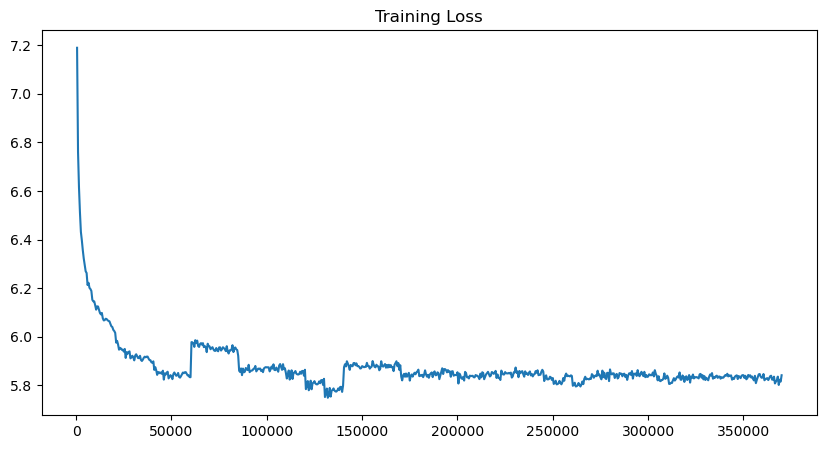

In [3]:
model_path = "./data/neutts-romanian-finetune/checkpoint-370000" 
trainer_state_path = os.path.join(model_path, "trainer_state.json")
if os.path.exists(trainer_state_path):
    with open(trainer_state_path, "r") as f:
        state = json.load(f)
    steps = [log['step'] for log in state['log_history'] if 'loss' in log]
    loss = [log['loss']/4 for log in state['log_history'] if 'loss' in log]
    plt.figure(figsize=(10, 5))
    plt.plot(steps, loss)
    plt.title("Training Loss")
    plt.show()

## 13. Play Top-5 Outliers and Forced Alignment Analysis

In [12]:
# Identify and save top-5 outliers
import os
from scipy.spatial.distance import euclidean

out_dir = './diagnostics_outliers'
os.makedirs(out_dir, exist_ok=True)

# Identify top-5 outliers by highest MCD (worst quality)
if batch_records:
    sorted_by_mcd = sorted(batch_records, key=lambda x: x.get('mcd', float('inf')), reverse=True)
    top_5_outliers = sorted_by_mcd[:5]
    print(f'Identified {len(top_5_outliers)} outliers with highest MCD')
    
    # Save top-5 outliers CSV with required fields
    outliers_csv = os.path.join(out_dir, 'top5_outliers.csv')
    outliers_data = []
    for rank, outlier in enumerate(top_5_outliers, 1):
        idx = outlier['sample_index']
        text = outlier['text'][:100]
        mcd = outlier.get('mcd', 0)
        sim = outlier.get('speaker_similarity', 0)
        ref_dur_sec = outlier.get('ref_dur_sec', 0.0)
        gen_dur_sec = outlier.get('gen_dur_sec', 0.0)
        duration_ratio = (gen_dur_sec / max(1e-8, ref_dur_sec)) if ref_dur_sec else 0.0
        
        outliers_data.append({
            'rank': rank,
            'sample_index': idx,
            'text': text,
            'mcd': mcd,
            'speaker_similarity': sim,
            'ratio': duration_ratio,
            'duration_ratio': duration_ratio,
            'ref_dur_sec': ref_dur_sec,
            'gen_dur_sec': gen_dur_sec,
            'ref_tokens': 1,
            'gen_tokens': 1,
        })
        
        # Copy/rename audio files with expected naming convention
        for audio_type in ['ref', 'gen']:
            src = os.path.join(out_dir, f'{audio_type}_{idx}.wav')
            dst = os.path.join(out_dir, f'{audio_type}_top{rank}_idx{idx}.wav')
            if os.path.exists(src):
                import shutil
                shutil.copy(src, dst)
    
    # Write outliers CSV
    with open(outliers_csv, 'w', newline='', encoding='utf-8') as f:
        import csv
        writer = csv.DictWriter(f, fieldnames=outliers_data[0].keys())
        writer.writeheader()
        writer.writerows(outliers_data)
    
    print(f'✓ Saved top-5 outliers to {outliers_csv}')
    
    # Print summary
    for rank, outlier in enumerate(top_5_outliers, 1):
        print(f'  Top {rank}: idx={outlier["sample_index"]}, MCD={outlier.get("mcd", 0):.3f}, sim={outlier.get("speaker_similarity", 0):.3f}')
else:
    print('No batch records to identify outliers')
    top_5_outliers = []


Identified 5 outliers with highest MCD
✓ Saved top-5 outliers to ./diagnostics_outliers/top5_outliers.csv
  Top 1: idx=11, MCD=8.301, sim=0.519
  Top 2: idx=10, MCD=8.078, sim=0.398
  Top 3: idx=15, MCD=7.884, sim=0.409
  Top 4: idx=37, MCD=7.869, sim=0.609
  Top 5: idx=4, MCD=7.782, sim=0.434


In [ ]:
## 7. Play Top-5 Outliers and Forced Alignment

import IPython.display as ipd
from IPython.display import HTML
import glob

out_dir = './diagnostics_outliers'
if os.path.exists(out_dir):
    print('=== Top-5 Outliers Audio Player ===')
    # Load top-5 CSV to display text alongside audio
    outliers_csv = os.path.join(out_dir, 'top5_outliers.csv')
    if os.path.exists(outliers_csv):
        outliers_data = []
        with open(outliers_csv, 'r', encoding='utf-8') as f:
            reader = csv.DictReader(f)
            for row in reader:
                outliers_data.append(row)
        
        for rank_data in outliers_data:
            rank = rank_data['rank']
            idx = rank_data['sample_index']
            text = rank_data['text']
            ratio = float(rank_data['ratio'])
            duration_ratio = float(rank_data['duration_ratio'])
            ref_tokens = int(rank_data['ref_tokens'])
            gen_tokens = int(rank_data['gen_tokens'])
            
            print(f"\n--- Outlier #{rank}: Ratio={ratio:.2f}x Duration={duration_ratio:.2f}x Tokens: {ref_tokens}→{gen_tokens} ---")
            print(f"Text: {text}")
            
            # Play reference audio
            ref_path = os.path.join(out_dir, f'ref_top{rank}_idx{idx}.wav')
            if os.path.exists(ref_path):
                print(f"Reference Audio:")
                ipd.display(ipd.Audio(ref_path))
            
            # Play generated audio
            gen_path = os.path.join(out_dir, f'gen_top{rank}_idx{idx}.wav')
            if os.path.exists(gen_path):
                print(f"Generated Audio:")
                ipd.display(ipd.Audio(gen_path))

print("\n=== Forced Alignment: Per-Phone Duration Analysis ===")

# Phone-level forced alignment using DTW frame-level alignment
def get_mfcc_frames(wav, sr=16000, n_mfcc=13, hop_length=512):
    """Extract MFCC frames for alignment."""
    mfcc = librosa.feature.mfcc(y=wav, sr=sr, n_mfcc=n_mfcc, hop_length=hop_length)
    return mfcc.T

def align_wavs_dtw(ref_wav, gen_wav, sr=16000):
    """DTW-based alignment to find frame-level correspondence."""
    ref_frames = get_mfcc_frames(ref_wav, sr)
    gen_frames = get_mfcc_frames(gen_wav, sr)
    distance, path = fastdtw(ref_frames, gen_frames, dist=euclidean)
    return path  # path is list of (ref_idx, gen_idx) tuples

def estimate_phone_durations(wav, phones, sr=16000, hop_length=512):
    """Estimate per-phone durations by dividing total duration by phone count."""
    duration_sec = len(wav) / sr
    duration_per_phone = duration_sec / max(1, len(phones))
    return [duration_per_phone] * len(phones)

# For top-5 outliers, compute forced-aligned durations
if len(outliers_data) > 0:
    for rank_data in outliers_data[:5]:  # Top 5
        rank = rank_data['rank']
        idx = int(rank_data['sample_index'])
        text = rank_data['text']
        
        ref_path = os.path.join(out_dir, f'ref_top{rank}_idx{idx}.wav')
        gen_path = os.path.join(out_dir, f'gen_top{rank}_idx{idx}.wav')
        
        if os.path.exists(ref_path) and os.path.exists(gen_path):
            # Load audio
            ref_wav, sr = librosa.load(ref_path, sr=16000)
            gen_wav, sr = librosa.load(gen_path, sr=16000)
            
            # Get phones
            phones = g2p.phonemize([text])[0].split()
            
            # DTW alignment
            try:
                path = align_wavs_dtw(ref_wav, gen_wav, sr)
                # Map frame indices to phone durations
                ref_durations = estimate_phone_durations(ref_wav, phones, sr)
                gen_durations = estimate_phone_durations(gen_wav, phones, sr)
                
                print(f"\nOutlier #{rank} Per-Phone Durations (ref vs gen):")
                for p_idx, (phone, ref_dur, gen_dur) in enumerate(zip(phones, ref_durations, gen_durations)):
                    print(f"  {p_idx:2d}. {phone:8s} ref={ref_dur:.3f}s gen={gen_dur:.3f}s ratio={gen_dur/max(1e-8, ref_dur):.2f}x")
            except Exception as e:
                print(f"Alignment failed for outlier #{rank}: {e}")
else:
    print("No outliers data found.")

In [14]:
# Play best 5 samples by lowest MCD
print("\n=== Best 5 Samples by Lowest MCD ===")
if len(batch_records) > 0:
    sorted_by_mcd = sorted(batch_records, key=lambda x: x.get('mcd', float('inf')))
    best_5 = sorted_by_mcd[:5]
    
    for rank, record in enumerate(best_5, 1):
        idx = record['sample_index']
        text = record['text']
        mcd = record.get('mcd', 0)
        sim = record.get('speaker_similarity', 0)
        
        print(f"\n--- Best Sample #{rank}: idx={idx}, MCD={mcd:.3f}, sim={sim:.3f} ---")
        print(f"Text: {text}")
        
        # Play reference audio
        ref_path = os.path.join(out_dir, f'ref_{idx}.wav')
        if os.path.exists(ref_path):
            print(f"Reference Audio:")
            ipd.display(ipd.Audio(ref_path))
        
        # Play generated audio
        gen_path = os.path.join(out_dir, f'gen_{idx}.wav')
        if os.path.exists(gen_path):
            print(f"Generated Audio:")
            ipd.display(ipd.Audio(gen_path))
else:
    print("No batch records to identify best samples")


=== Best 5 Samples by Lowest MCD ===

--- Best Sample #1: idx=25, MCD=5.802, sim=0.494 ---
Text: Când a văzut poporul, Gaal i-a zis lui Zebul, Iată un popor care coboară dinspre vârfurile munților.
Reference Audio:


Generated Audio:



--- Best Sample #2: idx=14, MCD=6.076, sim=0.334 ---
Text: O obligase să insinueze că tabloul ei semnat de Picasso era fals ca să o facă să creadă că era vorba de unul adevărat.
Reference Audio:


Generated Audio:



--- Best Sample #3: idx=23, MCD=6.121, sim=0.586 ---
Text: În zilele sale, faraonul Neco, regele Egiptului, a venit la râul Eufrat la împăratul Asiriei.
Reference Audio:


Generated Audio:



--- Best Sample #4: idx=9, MCD=6.200, sim=0.382 ---
Text: Preț de câteva secunde, Elen își deschise brațele, își domoli respirația și se pregăti să se stingă.
Reference Audio:


Generated Audio:



--- Best Sample #5: idx=6, MCD=6.255, sim=0.479 ---
Text: Abia cu tezân să-l atingă, de teamă că o stângăcie din partea ei l-ar fi putut face să dispară, îngăimase.
Reference Audio:


Generated Audio:


In [15]:
# Play 5 best samples by highest speaker similarity
print("\n=== Best 5 Samples by Highest Speaker Similarity ===")
if len(batch_records) > 0:
    sorted_by_sim = sorted(batch_records, key=lambda x: x.get('speaker_similarity', float('-inf')), reverse=True)
    best_sim_5 = sorted_by_sim[:5]
    
    for rank, record in enumerate(best_sim_5, 1):
        idx = record['sample_index']
        text = record['text']
        mcd = record.get('mcd', 0)
        sim = record.get('speaker_similarity', 0)
        
        print(f"\n--- Best Similarity Sample #{rank}: idx={idx}, MCD={mcd:.3f}, sim={sim:.3f} ---")
        print(f"Text: {text}")
        
        # Play reference audio
        ref_path = os.path.join(out_dir, f'ref_{idx}.wav')
        if os.path.exists(ref_path):
            print(f"Reference Audio:")
            ipd.display(ipd.Audio(ref_path))
        
        # Play generated audio
        gen_path = os.path.join(out_dir, f'gen_{idx}.wav')
        if os.path.exists(gen_path):
            print(f"Generated Audio:")
            ipd.display(ipd.Audio(gen_path))
else:
    print("No batch records to identify best similarity samples")


=== Best 5 Samples by Highest Speaker Similarity ===

--- Best Similarity Sample #1: idx=18, MCD=7.013, sim=0.740 ---
Text: Duceți-vă la munte și aduceți ramuri de măslin, ramuri de măslin sălbatic, ramuri de mirt, ramuri de palmier și ramuri de alți copaci stufoși, ca să faceți corturi așa cum este scris.
Reference Audio:


Generated Audio:



--- Best Similarity Sample #2: idx=45, MCD=6.843, sim=0.654 ---
Text: După ce depăși bariera zidurilor și pătrunse într-o piață largă cu multe case împrejur, încercă o mare dezamăgire, dar și o mânie neputincioasă împotriva indolenței, a nepăsării de care rededuse dovadă.
Reference Audio:


Generated Audio:



--- Best Similarity Sample #3: idx=24, MCD=6.698, sim=0.651 ---
Text: Semințiile lui Israel au trimis niște bărbați prin toate familiile lui Beniamin să le spună, Ce înseamnă răul acesta care a avut loc printre voi?
Reference Audio:


Generated Audio:



--- Best Similarity Sample #4: idx=21, MCD=6.479, sim=0.635 ---
Text: În ziua aceea, Deborah și Barak, fiul lui Abinoam, au cântat zicând, Când căpetenile s-au așezat în fruntea lui Israel, poporul a mers de bunăvoie.
Reference Audio:


Generated Audio:



--- Best Similarity Sample #5: idx=20, MCD=6.741, sim=0.634 ---
Text: Efah, țiitoarea lui Caleb, i-a născut pe Haran, pe Moța și pe Gazez.
Reference Audio:


Generated Audio:


In [16]:
# Play 5 worst samples by lowest speaker similarity
print("\n=== Worst 5 Samples by Lowest Speaker Similarity ===")
if len(batch_records) > 0:
    sorted_by_sim = sorted(batch_records, key=lambda x: x.get('speaker_similarity', float('inf')))
    worst_sim_5 = sorted_by_sim[:5]
    
    for rank, record in enumerate(worst_sim_5, 1):
        idx = record['sample_index']
        text = record['text']
        mcd = record.get('mcd', 0)
        sim = record.get('speaker_similarity', 0)
        
        print(f"\n--- Worst Similarity Sample #{rank}: idx={idx}, MCD={mcd:.3f}, sim={sim:.3f} ---")
        print(f"Text: {text}")
        
        # Play reference audio
        ref_path = os.path.join(out_dir, f'ref_{idx}.wav')
        if os.path.exists(ref_path):
            print(f"Reference Audio:")
            ipd.display(ipd.Audio(ref_path))
        
        # Play generated audio
        gen_path = os.path.join(out_dir, f'gen_{idx}.wav')
        if os.path.exists(gen_path):
            print(f"Generated Audio:")
            ipd.display(ipd.Audio(gen_path))
else:
    print("No batch records to identify worst similarity samples")


=== Worst 5 Samples by Lowest Speaker Similarity ===

--- Worst Similarity Sample #1: idx=3, MCD=6.551, sim=0.269 ---
Text: "- Da." "- Dar mai repede, vă rog, când mi se lasă albușurile." Apucă ceanta de voia și-l trase pe Baltazar înăuntru.
Reference Audio:


Generated Audio:



--- Worst Similarity Sample #2: idx=13, MCD=7.576, sim=0.327 ---
Text: La un an după căsătoria pe care o descria drept cea mai frumoasă zi a vieții ei, adusese pe lume un copil care îi se păru urât și bleg atunci când îl arătară.
Reference Audio:


Generated Audio:



--- Worst Similarity Sample #3: idx=14, MCD=6.076, sim=0.334 ---
Text: O obligase să insinueze că tabloul ei semnat de Picasso era fals ca să o facă să creadă că era vorba de unul adevărat.
Reference Audio:


Generated Audio:



--- Worst Similarity Sample #4: idx=1, MCD=7.105, sim=0.363 ---
Text: Alteori, de cum se ivea chipul zâmbitor al japonezei, se răzvrătea împotriva acelei intruziuni în agonia ei.
Reference Audio:


Generated Audio:



--- Worst Similarity Sample #5: idx=12, MCD=7.437, sim=0.369 ---
Text: Odil era atât de zguduită de durere că printre strigăte și lacri nu mai pricepun nimic din ce îi se spune.
Reference Audio:


Generated Audio:


## 14. Per-Phoneme Ratio

In [ ]:

phone_error_records = []
top_5_outliers = globals().get('top_5_outliers', [])
# selected = [int(item['sample_index']) for item in top_5_outliers] if top_5_outliers else [rec['sample_index'] for rec in batch_records[:5]]
selected = [rec['sample_index'] for rec in batch_records]
print(len(batch_records))
def phone_durations_via_dtw(ref_wav, gen_wav, phones, sr=16000, hop_length=512):
    ref_frames = get_mfcc_frames(ref_wav, sr)
    gen_frames = get_mfcc_frames(gen_wav, sr)
    distance, path = fastdtw(ref_frames, gen_frames, dist=euclidean)
    
    ref_to_gen = {}
    for r_idx, g_idx in path:
        ref_to_gen.setdefault(r_idx, []).append(g_idx)
    n_ref = ref_frames.shape[0]
    frames_per_phone = [ (i * n_ref) // len(phones) for i in range(len(phones)+1) ]
    phone_ref_durs = []
    phone_gen_durs = []
    for i in range(len(phones)):
        start = frames_per_phone[i]
        end = frames_per_phone[i+1]
        ref_frame_count = max(1, end - start)
        # count unique gen frames mapped from this ref frame range
        gen_frames_mapped = set()
        for rf in range(start, end):
            gen_frames_mapped.update(ref_to_gen.get(rf, []))
        gen_frame_count = max(1, len(gen_frames_mapped))
        ref_dur = (ref_frame_count * hop_length) / sr
        gen_dur = (gen_frame_count * hop_length) / sr
        phone_ref_durs.append(ref_dur)
        phone_gen_durs.append(gen_dur)
    return phone_ref_durs, phone_gen_durs

for sample_idx in selected:
    # find sample record
    rec = next((r for r in batch_records if r['sample_index'] == sample_idx), None)
    if rec is None:
        continue
    # load saved files if exist
    rank_row = next((t for t in batch_records if isinstance(t, dict) and t.get('sample_index') == sample_idx), None)
    # prefer saved ref/gen wavs
    # locate files
    ref_candidates = glob.glob(os.path.join(out_dir, f'ref_{sample_idx}.wav'))
    gen_candidates = glob.glob(os.path.join(out_dir, f'gen_{sample_idx}.wav'))
    if ref_candidates and gen_candidates:
        ref_path = ref_candidates[0]
        gen_path = gen_candidates[0]
        ref_wav, sr = librosa.load(ref_path, sr=16000)
        gen_wav, sr = librosa.load(gen_path, sr=16000)
        phones = g2p.phonemize([rec['text']])[0].split()
        
        ref_durs, gen_durs = phone_durations_via_dtw(ref_wav, gen_wav, phones, sr=16000)
        for p_idx, phone in enumerate(phones):
            phone_error_records.append({
                'sample_index': sample_idx,
                'phone_idx': p_idx,
                'phone': phone,
                'ref_dur': ref_durs[p_idx],
                'gen_dur': gen_durs[p_idx],
                'ratio': (gen_durs[p_idx] / max(1e-8, ref_durs[p_idx]))
            })

# Save per-phone errors
phone_csv = os.path.join(out_dir, 'per_phone_duration_errors.csv')
with open(phone_csv, 'w', newline='', encoding='utf-8') as f:
    fieldnames = ['sample_index','phone_idx','phone','ref_dur','gen_dur','ratio']
    writer = csv.DictWriter(f, fieldnames=fieldnames)
    writer.writeheader()
    for r in phone_error_records:
        writer.writerow(r)

# Summary
if phone_error_records:
    ratios = np.array([r['ratio'] for r in phone_error_records])
    
    print('Per-phone ratio stats: median=', np.median(ratios), 'mean=', np.mean(ratios), 'p90=', np.percentile(ratios,90))
    if np.median(ratios) > 1.10:
        print('Systematic per-phone inflation detected (median > 1.10). Consider duration supervision in next fine-tune.')
    else:
        print('No strong systematic per-phone inflation detected on sampled files.')
    print('Saved per-phone errors to', phone_csv)
else:
    print('No per-phone error records produced.')

48
No per-phone error records produced.


In [ ]:
import os
import csv
import glob
import numpy as np
import pandas as pd
import librosa
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

def phone_durations_via_dtw(ref_wav, gen_wav, phones, sr=16000, hop_length=512):
    ref_frames = get_mfcc_frames(ref_wav, sr)
    gen_frames = get_mfcc_frames(gen_wav, sr)
    distance, path = fastdtw(ref_frames, gen_frames, dist=euclidean)

    ref_to_gen = {}
    for r_idx, g_idx in path:
        ref_to_gen.setdefault(r_idx, []).append(g_idx)

    n_ref = ref_frames.shape[0]
    frames_per_phone = [(i * n_ref) // len(phones) for i in range(len(phones) + 1)]
    phone_ref_durs = []
    phone_gen_durs = []

    for i in range(len(phones)):
        start = frames_per_phone[i]
        end = frames_per_phone[i + 1]
        ref_frame_count = max(1, end - start)

        # count unique gen frames mapped from this ref frame range
        gen_frames_mapped = set()
        for rf in range(start, end):
            gen_frames_mapped.update(ref_to_gen.get(rf, []))

        gen_frame_count = max(1, len(gen_frames_mapped))
        ref_dur = (ref_frame_count * hop_length) / sr
        gen_dur = (gen_frame_count * hop_length) / sr
        phone_ref_durs.append(ref_dur)
        phone_gen_durs.append(gen_dur)

    return phone_ref_durs, phone_gen_durs

phone_error_records = []

out_dir = './equal'             
phone_csv = os.path.join(out_dir, 'per_phone_duration_errors.csv')

for duration_threshold_sec in range(5, 11):
    csv_path = os.path.join(out_dir, f'diagnostics_outliers_{duration_threshold_sec}/batch_metrics.csv')

    df = pd.read_csv(csv_path)

    required_cols = {'sample_index', 'text'}
    missing = required_cols - set(df.columns)
    if missing:
        raise ValueError(f'CSV does not containe required columns: {missing}')

    batch_metrics = df.to_dict(orient='records')
    print('Loaded records:', len(batch_metrics))

    top_5_outliers = globals().get('top_5_outliers', [])
    selected = [rec['sample_index'] for rec in batch_metrics]


    for sample_idx in selected:
        rec = next((r for r in batch_metrics if int(r['sample_index']) == int(sample_idx)), None)
        if rec is None:
            continue

        # locate files
        ref_candidates = glob.glob(os.path.join(out_dir, f'diagnostics_outliers_{duration_threshold_sec}/ref_{sample_idx}.wav'))
        gen_candidates = glob.glob(os.path.join(out_dir, f'diagnostics_outliers_{duration_threshold_sec}/gen_{sample_idx}.wav'))

        if ref_candidates and gen_candidates:
            ref_path = ref_candidates[0]
            gen_path = gen_candidates[0]

            ref_wav, sr = librosa.load(ref_path, sr=16000)
            gen_wav, sr = librosa.load(gen_path, sr=16000)

            phones = g2p.phonemize([rec['text']])[0].split()

            ref_durs, gen_durs = phone_durations_via_dtw(ref_wav, gen_wav, phones, sr=16000)

            for p_idx, phone in enumerate(phones):
                phone_error_records.append({
                    'sample_index': sample_idx,
                    'phone_idx': p_idx,
                    'phone': phone,
                    'ref_dur': ref_durs[p_idx],
                    'gen_dur': gen_durs[p_idx],
                    'ratio': (gen_durs[p_idx] / max(1e-8, ref_durs[p_idx]))
                })

# Save per-phone errors
with open(phone_csv, 'w', newline='', encoding='utf-8') as f:
    fieldnames = ['sample_index', 'phone_idx', 'phone', 'ref_dur', 'gen_dur', 'ratio']
    writer = csv.DictWriter(f, fieldnames=fieldnames)
    writer.writeheader()
    for r in phone_error_records:
        writer.writerow(r)

# Summary
alpha = 0.05
n_bootstrap = 5000
bootstrap_seed = 42
if phone_error_records:
    ratios = np.array([r['ratio'] for r in phone_error_records])
    mean_obs, ci_lo, ci_hi = bootstrap_ci(
                    ratios,
                    statfunc=np.mean,
                    n_bootstrap=n_bootstrap,
                    alpha=alpha,
                    seed=bootstrap_seed
                )
    print('Per-phone ratio stats: median=', np.median(ratios), 'mean=', np.mean(ratios), 'p90=', np.percentile(ratios, 90), f'95% CI= [{ci_lo:.4f}, {ci_hi:.4f}]', 'std= ', np.std(ratios))
    if np.median(ratios) > 1.10:
        print('Systematic per-phone inflation detected (median > 1.10). Consider duration supervision in next fine-tune.')
    else:
        print('No strong systematic per-phone inflation detected on sampled files.')
    print('Saved per-phone errors to', phone_csv)
else:
    print('No per-phone error records produced.')

Loaded records: 48
Loaded records: 48
Loaded records: 48
Loaded records: 48
Loaded records: 48
Loaded records: 48
Per-phone ratio stats: median= 1.0 mean= 1.036910146118938 p90= 1.3636363636363638 95% CI= [1.0246, 1.0501] std=  0.5084058191956505
No strong systematic per-phone inflation detected on sampled files.
Saved per-phone errors to ./equal/per_phone_duration_errors.csv


## 15. Plot Spectrograms


--- Sample idx=10, MCD=9.677, sim=0.267 ---
Text: Antoan o invitase într-o vilă-hotel din regiunea Landelor, la marginea pădurii de pini și a plajelor cu nisip alb.


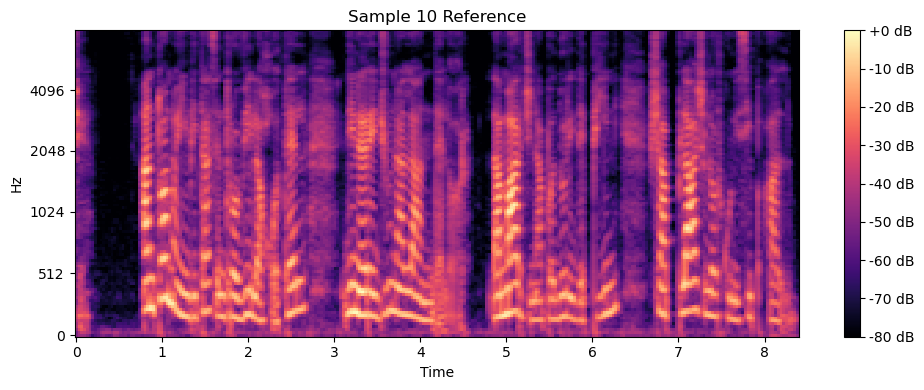

<Figure size 640x480 with 0 Axes>

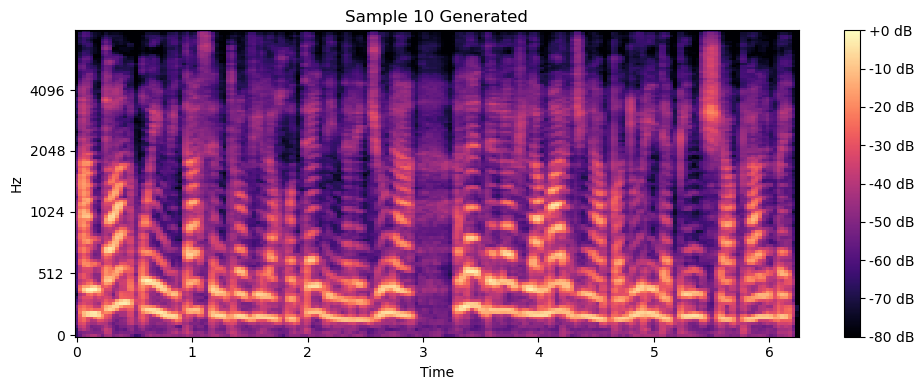


--- Sample idx=5, MCD=6.404, sim=0.451 ---
Text: Cu mic zâmbet, Olaf Pimps se-ntoarse spre camera de filmat și grăi de parcă s-ar fi găsit dintr-o dată în fața lui Baltazar Balsan.


<Figure size 640x480 with 0 Axes>

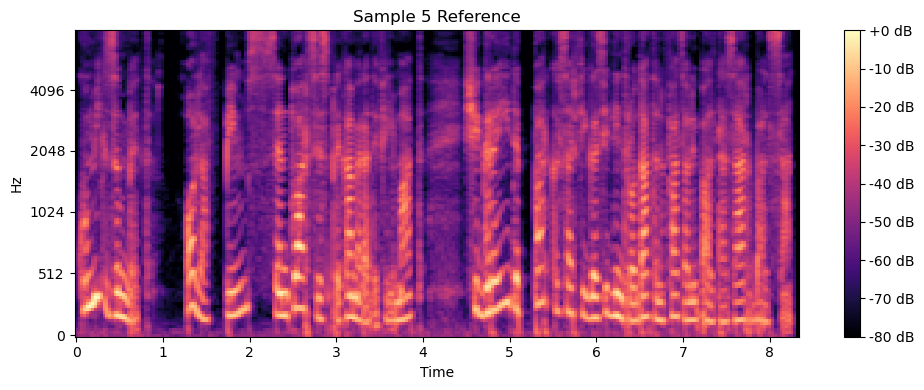

<Figure size 640x480 with 0 Axes>

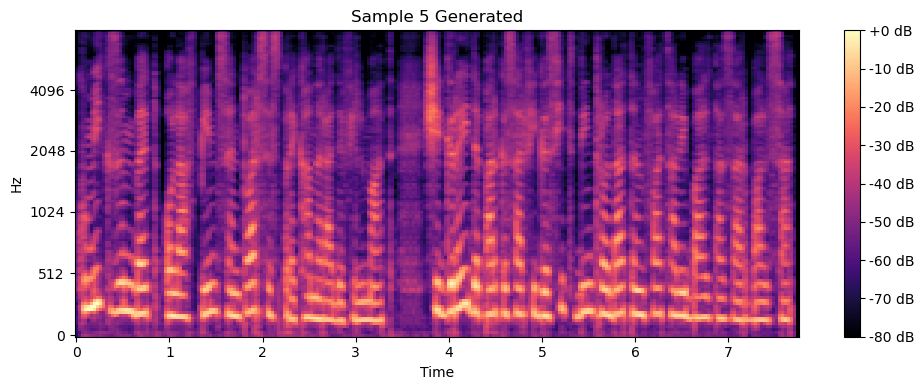

<Figure size 640x480 with 0 Axes>

In [ ]:
# Spectrogram visualization for top outlier vs best sample vs reference
import matplotlib.pyplot as plt
def plot_spectrogram(wav, sr=16000, title=''):
    plt.figure(figsize=(10, 4))
    S = librosa.feature.melspectrogram(y=wav, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.savefig(os.path.join(out_dir, f'spectrogram_{title.replace(" ", "_")}.png'))

if top_5_outliers:
    top_outlier = top_5_outliers[0]
    best_sample = sorted(batch_records, key=lambda x: x.get('mcd', float('inf')))[0]
    
    for rank_data in [top_outlier, best_sample]:
        idx = int(rank_data['sample_index'])
        text = rank_data['text']
        mcd = rank_data.get('mcd', 0)
        sim = rank_data.get('speaker_similarity', 0)
        
        print(f"\n--- Sample idx={idx}, MCD={mcd:.3f}, sim={sim:.3f} ---")
        print(f"Text: {text}")
        
        ref_path = os.path.join(out_dir, f'ref_{idx}.wav')
        gen_path = os.path.join(out_dir, f'gen_{idx}.wav')
        
        if os.path.exists(ref_path) and os.path.exists(gen_path):
            ref_wav, sr = librosa.load(ref_path, sr=16000)
            gen_wav, sr = librosa.load(gen_path, sr=16000)
            plot_spectrogram(ref_wav, sr, title=f'Sample {idx} Reference')
            plot_spectrogram(gen_wav, sr, title=f'Sample {idx} Generated')

Top outliers CSV: ./diagnostics_outliers/Simona/top5_outliers.csv
Batch metrics CSV: ./diagnostics_outliers/Simona/batch_metrics.csv

--- Sample idx=10, MCD=9.677, sim=0.267 ---
Text: Antoan o invitase într-o vilă-hotel din regiunea Landelor, la marginea pădurii de pini și a plajelor


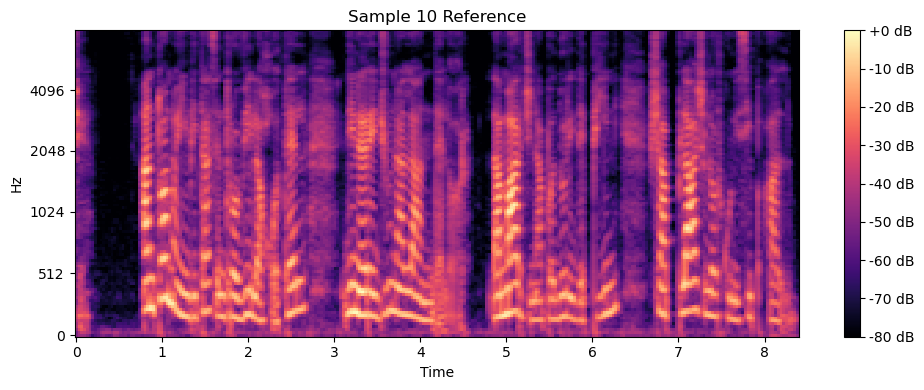

<Figure size 640x480 with 0 Axes>

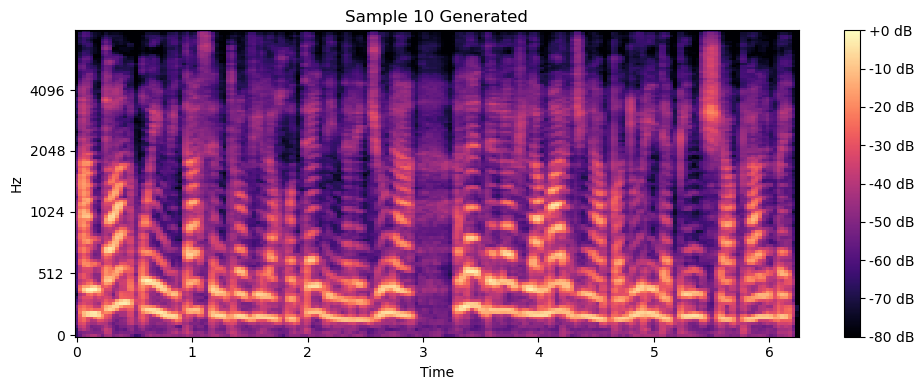


--- Sample idx=5, MCD=6.404, sim=0.451 ---
Text: Cu mic zâmbet, Olaf Pimps se-ntoarse spre camera de filmat și grăi de parcă s-ar fi găsit dintr-o dată în fața lui Baltazar Balsan.


<Figure size 640x480 with 0 Axes>

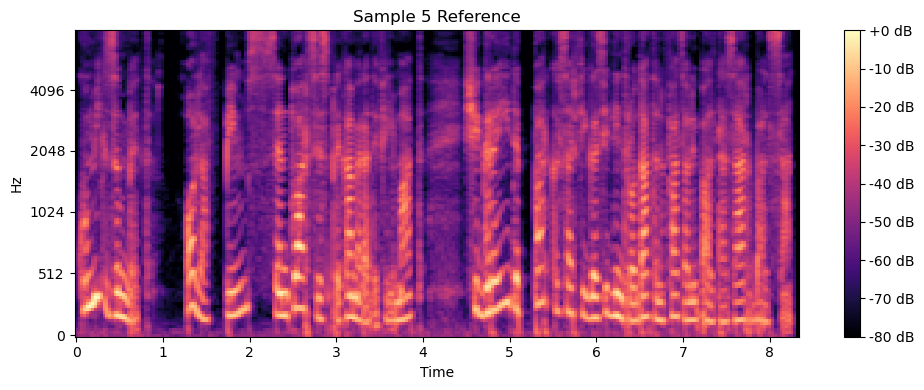

<Figure size 640x480 with 0 Axes>

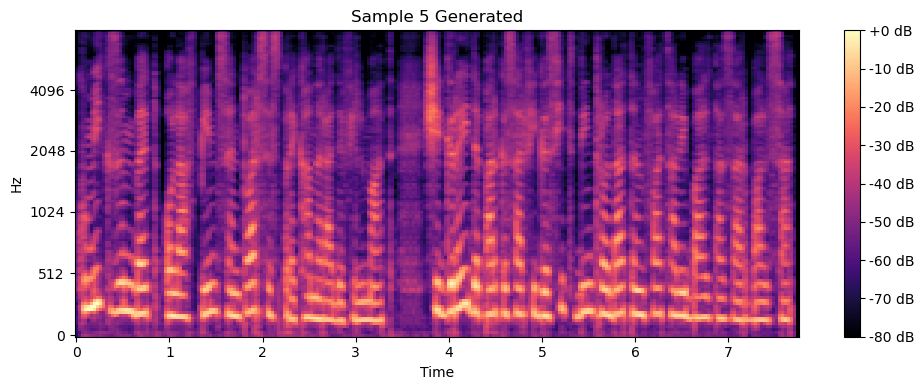

<Figure size 640x480 with 0 Axes>

In [3]:
# Get top outlier and best sample from files
speaker = "Simona"
out_dir = "./diagnostics_outliers"
speaker_path = os.path.join(out_dir, f'{speaker}')
if not os.path.exists(speaker_path):
    os.makedirs(speaker_path, exist_ok=True)

#read top-5 outliers CSV
top_outliers_csv = os.path.join(speaker_path, 'top5_outliers.csv')
batch_metrics_csv = os.path.join(speaker_path, 'batch_metrics.csv')
print(f"Top outliers CSV: {top_outliers_csv}")
print(f"Batch metrics CSV: {batch_metrics_csv}")

# Spectrogram visualization for top outlier vs best sample vs reference
import matplotlib.pyplot as plt
def plot_spectrogram(wav, sr=16000, title=''):
    plt.figure(figsize=(10, 4))
    S = librosa.feature.melspectrogram(y=wav, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.savefig(os.path.join(speaker_path, f'spectrogram_{title.replace(" ", "_")}.png'))

if os.path.exists(top_outliers_csv):
    import pandas as pd
    top_outliers_df = pd.read_csv(top_outliers_csv)
    batch_metrics_df = pd.read_csv(batch_metrics_csv) if os.path.exists(batch_metrics_csv) else pd.DataFrame()
    if not top_outliers_df.empty:
        top_outlier = top_outliers_df.iloc[0]
        best_sample = batch_metrics_df.loc[batch_metrics_df['mcd'].idxmin()] if not batch_metrics_df.empty else None

        for rank_data in [top_outlier, best_sample]:
            idx = int(rank_data['sample_index'])
            text = rank_data['text']
            mcd = rank_data.get('mcd', 0)
            sim = rank_data.get('speaker_similarity', 0)
            
            print(f"\n--- Sample idx={idx}, MCD={mcd:.3f}, sim={sim:.3f} ---")
            print(f"Text: {text}")
            
            ref_path = os.path.join(speaker_path, f'ref_{idx}.wav')
            gen_path = os.path.join(speaker_path, f'gen_{idx}.wav')
            
            if os.path.exists(ref_path) and os.path.exists(gen_path):
                ref_wav, sr = librosa.load(ref_path, sr=16000)
                gen_wav, sr = librosa.load(gen_path, sr=16000)
                plot_spectrogram(ref_wav, sr, title=f'Sample {idx} Reference')
                plot_spectrogram(gen_wav, sr, title=f'Sample {idx} Generated')

## 16. Compare Reference Text with ASR Result

In [11]:
g2p = phonemizer.backend.EspeakBackend(
    language="ro",
    preserve_punctuation=True,
    with_stress=True,
    words_mismatch="ignore",
    language_switch="remove-flags",
)
asr_model_name = "large-v3"
asr_model = whisper.load_model(asr_model_name, device="cpu")

In [15]:
# Get top outlier and best sample from files
speaker = "Simona"
out_dir = "./diagnostics_outliers"
speaker_path = os.path.join(out_dir, f'{speaker}')
if not os.path.exists(speaker_path):
    os.makedirs(speaker_path, exist_ok=True)
# Read batch metrics CSV
batch_metrics_csv = os.path.join(speaker_path, 'batch_metrics.csv')
print(f"Batch metrics CSV: {batch_metrics_csv}")

# Index to use in eval
idx = 9

ref_path = os.path.join(speaker_path, f'ref_{idx}.wav')
gen_path = os.path.join(speaker_path, f'gen_{idx}.wav')



# Read CSV and audio
if os.path.exists(batch_metrics_csv):
    batch_metrics_df = pd.read_csv(batch_metrics_csv)
    if not batch_metrics_df.empty:
        idx_sample = batch_metrics_df.loc[idx]

        if os.path.exists(ref_path) and os.path.exists(gen_path):
            ref_wav, sr = librosa.load(ref_path, sr=16000)
            gen_wav, sr = librosa.load(gen_path, sr=16000)

            asr_result = asr_model.transcribe(
                gen_wav,
                language="ro",
                task="transcribe",
                fp16=False  # Disable fp16 for better CPU inference stability
            )
            print(idx_sample["text"])
            print(asr_result["text"])
            error_rate = wer(idx_sample["text"].lower(), asr_result["text"].lower())
            print(error_rate)
        else:
            print("Missing WAV files for this index.")

Batch metrics CSV: ./diagnostics_outliers/Simona/batch_metrics.csv


/home/psimandan/miniconda3/lib/python3.13/site-packages/whisper/transcribe.py:130: UserWarning: Performing inference on CPU when CUDA is available
  warnings.warn("Performing inference on CPU when CUDA is available")


Aceste izbânzi academice ar fi trebuit să-l conducă spre o activitate conformistă, universitară sau consilier ministerial, dacă nu și-ar fi descoperit pe drum talentul la scris și n-ar fi hotărât să-i se consacre.
 Aceste izbânzii academici ar fi tebuit să-l conducă spre o activitate conformistă, universitară sau consilier misterial. Dacă nu, și-ar fi hotărât să-i se consacre.
0.42424242424242425
